SMA, EMA, MACD, Kalman, Fourier, Wavelet, STL on ARIMA, LSTM, CNN, RNN on different datasets

[Source](https://wire.insiderfinance.io/cracking-the-code-stock-prediction-with-attention-based-lstm-rnn-and-cnn-a-complete-python-2c46e8f25a12)

[Source2](https://towardsdatascience.com/time-series-analysis-visualization-forecasting-with-lstm-77a905180eba)

[Source3](https://medium.com/@wl8380/mastering-day-trading-with-lstm-predicting-the-next-10-minutes-4e03f89fef3f)

[Optuna](https://optuna.readthedocs.io/en/v2.0.0/reference/generated/optuna.trial.Trial.html), [Link2](https://medium.com/@elsaannacantik/forecasting-with-xgboost-catboost-and-lgbm-51832899dacc), [Link3](https://medium.com/@elsaannacantik/forecasting-with-xgboost-catboost-and-lgbm-51832899dacc)

[Tensorflow example](https://www.tensorflow.org/tutorials/structured_data/time_series#multi-output_models)

#### Import Libraries

In [1]:
# def import_libraries():
import numpy as np
import pandas as pd
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_absolute_percentage_error
from sklearn.model_selection import train_test_split
import yfinance as yf
import pandas as pd
import tensorflow as tf
from keras.models import Sequential
from keras.layers import Dense, Dropout, Attention, Add, LayerNormalization, Layer,LSTM
from keras.layers import Conv1D, MaxPooling1D, Flatten, Dense, Dropout, BatchNormalization
from keras.callbacks import EarlyStopping
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_absolute_percentage_error
import matplotlib.pyplot as plt
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots

import os
# import keras_tuner as kt
import optuna
from optuna import Trial, visualization
from optuna.samplers import TPESampler
# import xgboost as xgb
# import lightgbm as lgb
# import catboost as cb
from pykalman import KalmanFilter

from scipy.fft import fft,ifft
from scipy.signal import morlet, cwt
import pywt

from statsmodels.tsa.seasonal import seasonal_decompose, STL , MSTL
from statsforecast import StatsForecast
import plotly.graph_objects as go
from plotly.subplots import make_subplots

from sklearn.metrics import root_mean_squared_error,mean_squared_error,mean_absolute_percentage_error,r2_score,mean_absolute_error
from tensorflow.keras.layers import LeakyReLU,PReLU,ELU

2025-01-08 16:27:47.891502: I tensorflow/core/util/port.cc:113] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2025-01-08 16:27:47.922544: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2025-01-08 16:27:47.922578: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2025-01-08 16:27:47.923387: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2025-01-08 16:27:47.928462: I tensorflow/core/platform/cpu_feature_guar

#### Fetch data

In [2]:
def fetch_stock_data(ticker):
    """
    Fetch Tesla's historical stock data from Yahoo Finance.

    Returns:
        pd.DataFrame: DataFrame containing adjusted close prices indexed by date.
    """
    # Fetch data for Tesla (TSLA) from Yahoo Finance
    ticker = ticker
    start_date = "2010-01-01"
    end_date = "2024-11-17"
    # tesla = yf.download(ticker, start=start_date, end=end_date)
    ticker = yf.Ticker(ticker)
    tesla_data = ticker.history(period="max",interval="1d")
    # tesla.head(4)
    # Return a DataFrame with the adjusted close prices
    # tesla_data = tesla[['Adj Close']].rename(columns={"Adj Close": "adjClose"})
    # tesla_data.index.name = "date"
    return tesla_data
# Fetch Tesla stock data
# tesla_data = fetch_tesla_stock_data()

# Display the first few rows of data
# print(tesla_data.head(10))

#### Filtering functions

##### Comparison plot of Actual(TEST), kalman, fourier, SMA, EMA, MACD, Wavelet

In [3]:
def plot_comparison(actual_test,pred_test, kalman=None, fourier=None, sma=None, ema=None, macd=None, wavelet=None):
# plot dataframe line chart
    global scaler, tesla_data
    plt.figure(figsize=(10, 6))
    # Inverse scale the actual stock prices
    y_raw = scaler.inverse_transform(actual_test.reshape(-1, 1))
    s = tesla_data.index[-len(y_raw):]
    plt.plot(s,y_raw,'black' ,label='Actual')
    plt.plot(s,pred_test,'orange' ,label='Predicted')
    if kalman is not None:
        #read csv file into dataframe
        kalman_df_pred = pd.read_csv(f'predicted_stock_price_kalman.csv',index=False)
        plt.plot(s,kalman_df_pred['kalman_pred'], 'red',label='Kalman')
    if fourier is not None:
        fourier_df_Pred = pd.read_csv(f'predicted_stock_price_fourier.csv',index=False)
        plt.plot(s,fourier_df_Pred['fourier_pred'],'green',label='Fourier')
    if sma is not None:
        sma_df_pred = pd.read_csv(f'predicted_stock_price_SMA.csv',index=False)
        plt.plot(s,sma_df_pred['sma_pred'],'yellow', label='SMA')
    if ema is not None:
        ema_df_pred = pd.read_csv(f'predicted_stock_price_EMA.csv',index=False)
        plt.plot(s,ema_df_pred['ema_pred'],'lightblue' ,label='EMA')
    if macd is not None:
        macd_df_pred = pd.read_csv(f'predicted_stock_price_MACD.csv',index=False)
        plt.plot(s,macd_df_pred['macd_pred'],'magenta' ,label='MACD')
    if wavelet is not None:
        wavelet_df_pred = pd.read_csv(f'predicted_stock_price_wavelet.csv',index=False)
        plt.plot(s,wavelet_df_pred['wavelet_pred'], 'cyan',label='Wavelet')
    plt.title('Actual vs Predicted')
    plt.xlabel('Time')
    plt.ylabel('Value')
    plt.legend()
    plt.show()


##### Kalman

In [4]:
def kalman_filtering(org_data):
    kf = KalmanFilter(transition_matrices=[1],
    observation_matrices=[1],
    initial_state_mean=0,
    initial_state_covariance=1,
    observation_covariance=1,
    transition_covariance=0.0001)

    mean, cov = kf.filter(org_data.values)
    mean = pd.Series(mean.flatten(), index=org_data.index)

    # Apply the smoother to the observations
    smoothed_state_means, smoothed_state_covariances = kf.smooth(org_data.values)
    s_mean = pd.Series(smoothed_state_means.flatten(), index=org_data.index)

    plt.plot(org_data.index,org_data.values, 'green', lw=1.5,label='original')
    plt.plot(org_data.index,org_data.values - mean, 'red', lw=1.5,label='kalman filtered')
    plt.plot(org_data.index,org_data.values - s_mean, 'yellow', lw=1.5,label='Kalman smoothed')
    plt.title(f"{filter} -Kalman filtered price fluctuation")
    plt.ylabel("Deviation from the mean ($)")
    plt.xlabel("Years")
    plt.legend()
    #convert to dataframe
    kalman_df = pd.DataFrame({'filtered': org_data.values - mean, 'kal_smoothed':org_data.values - s_mean})
    return kalman_df

##### Fourier

In [5]:
def fourier_transform(org_data):
    global frequencies,fourier_reconstructed_signal,fft_values,stock_data
    # calcualte the fourier transform
    global threshold
    fft_values = np.fft.fft(org_data)

    # plot the original signal
    plt.figure(figsize=(20,11))
    plt.subplot(3, 1, 1)
    plt.plot(stock_data.index, org_data)
    plt.title(f'{filter} -Original Signal (Time Domain)')
    plt.xlabel('Time [s]')
    plt.ylabel('Price')

    # plot the fourier transform of the simulated sequence
    frequencies = np.fft.fftfreq(len(stock_data.index), d=1)
    print("freq-",frequencies)
    print("amp-",np.abs(fft_values))
    plt.subplot(3, 1, 2)
    plt.plot(frequencies, np.abs(fft_values))
    plt.title(f'{filter} -Fourier Transform (Frequency Domain)')
    plt.xlabel('Frequency [Hz]')
    plt.ylabel('Amplitude')
    

    # Step 2: Filter High Frequencies (Denoising) 
    
    # Filter threshold: keep only low frequencies 
    fft_filtered = np.copy(fft_values) 
    fft_filtered[np.abs(frequencies) > threshold] = 0 # Zero out high frequencies 
    # Reconstruct the Signal (Inverse Fourier Transform) 
    fourier_reconstructed_signal = np.fft.ifft(fft_filtered).real
    
    # Plot Reconstructed Signal 
    plt.subplot(3, 1, 3)   
    plt.plot(stock_data.index, fourier_reconstructed_signal, label="Reconstructed Signal (Low Pass Filter)") 
    plt.xlabel("Time") 
    plt.ylabel("Price") 
    plt.title(f"{filter} -Denoised Time Series") 
    plt.legend() 
    plt.tight_layout()
    plt.show()

    fourier_df = pd.DataFrame({'filtered': fourier_reconstructed_signal}) 
    return fourier_df

In [6]:
#find the lowest positive value in an array frequencies
# def find_lowest_positive_value(frequencies):
#     return min([freq for freq in frequencies if freq > 0])
# find_lowest_positive_value(frequencies)

# Step 3: Identify Dominant Frequencies
# dominant_freqs = frequencies[np.argsort(np.abs(fft_values))[-5:]]
# dominant_freqs
# dominant_amplitudes = np.abs(fft_values)[np.argsort(np.abs(fft_values))[-5:]]
# dominant_amplitudes

In [7]:
# Step 4: Add Sinusoidal Features for Forecasting
# sin_features = [np.sin(2 * np.pi * f * t) for f in dominant_freqs if f > 0]
# cos_features = [np.cos(2 * np.pi * f * t) for f in dominant_freqs if f > 0]
# seasonality_features = np.column_stack(sin_features + cos_features)

# Combine Features with Original Signal
# time_series_df = pd.DataFrame({ "Time": t, "Original_Signal": signal, "Denoised_Signal": reconstructed_signal })
# for i, freq in enumerate(dominant_freqs[dominant_freqs > 0]):
#     time_series_df[f"Sin_{i}"] = np.sin(2 * np.pi * freq * t)
#     time_series_df[f"Cos_{i}"] = np.cos(2 * np.pi * freq * t)

##### SMA

In [8]:
def SMA_transform(org_data):
    #transform close price to simple moving average
    global sma_win
    # sma_win = 20
    temp = org_data.rolling(window=sma_win,min_periods=1).mean()
    # print(temp)
    sma_df = pd.DataFrame(temp)
    #rename the column in sma_df   
    sma_df.columns = ['filtered']

    plt.plot(org_data.index,org_data.values, 'green', lw=1.5,label='original')
    plt.plot(org_data.index,sma_df.filtered, 'red', lw=1.5,label='SMA filtered')
    plt.title(f"{filter} -SMA filtered price fluctuation")
    plt.ylabel("SMA values")
    plt.xlabel("Years")
    plt.legend()

    return sma_df

##### EMA

In [9]:
def EMA_transform(org_data):
    #transform close price to simple moving average
    global ema_win
    temp = org_data.ewm(span=ema_win).mean()
    # print(temp)
    ema_df = pd.DataFrame(temp)
    #rename the column in sma_df
    ema_df.columns = ['filtered']

    plt.plot(org_data.index,org_data.values, 'green', lw=1.5,label='original')
    plt.plot(org_data.index,ema_df.filtered, 'red', lw=1.5,label='EMA filtered')
    plt.title(f"{filter} -EMA filtered price fluctuation")
    plt.ylabel("EMA values")
    plt.xlabel("Years")
    plt.legend()

    return ema_df

##### MACD

In [10]:
def MACD_transform(org_data):
    # Create MACD
    d_26ema = org_data.ewm(span=26).mean()
    d_12ema = org_data.ewm(span=12).mean()
    d_MACD = d_12ema-d_26ema
    macd_df = pd.DataFrame({'filtered': d_MACD})
    #rename the column in sma_df
    # macd_df.columns = ['filtered']

    plt.plot(org_data.index,org_data.values, 'green', lw=1.5,label='original')
    plt.plot(org_data.index,macd_df.filtered, 'red', lw=1.5,label='MACD filtered')
    plt.title(f"{filter} -MACD filtered price fluctuation")
    plt.ylabel("MACD values")
    plt.xlabel("Years")
    plt.legend()

    return macd_df
#calculate MACD

##### Wavelet

In [11]:
def wavelet_deconstruction_plot(data, wavelet_name):
    global details, approximation, wavelet
    # Step 1: Generate Synthetic Time Series Data 
    # np.random.seed(42) 
    # t = np.linspace(0, 10, 1024) 
    # Time vector (must be a power of 2 for DWT) 
    # signal = 5 * np.sin(2 * np.pi * 1 * t) + 2 * np.sin(2 * np.pi * 0.25 * t) + np.random.normal(0, 0.5, len(t)) 
    # Plot Original Signal 
    # plt.figure(figsize=(10, 4)) 
    # print('HEREEEEEEEEE')
    # plt.plot(data.index, data['Close'].values, label="Original Signal") 
    # plt.xlabel("Time") 
    # plt.ylabel("Close price") 
    # plt.title("Time Series Data") 
    # plt.legend() 
    # plt.show() 
    # Step 2: Perform Discrete Wavelet Transform (DWT) 
    wavelet = wavelet_name # 'db4' 
#Different wavelet families can be tested
    # Daubechies wavelet
    max_level = pywt.dwt_max_level(len(data['Close'].values), pywt.Wavelet(wavelet).dec_len) 
    # Max decomposition level 
    coeffs = pywt.wavedec(data['Close'].values, wavelet, level=max_level)

    # Perform wavelet decomposition 
    approximation = coeffs[0] 
    # Approximation coefficients (low-frequency) 
    details = coeffs[1:] 
    # Detail coefficients (high-frequency) 
    print("length of details-",len(details))
    # Step 3: Visualize Wavelet Decomposition 
    
    # plt.figure(figsize=(20, 15)) 
    # plt.subplot(len(details)+1, 1, 1) 
    # plt.plot(approximation, label="Approximation (Low Frequencies)") 
    # plt.title("Approximation Coefficients (A)") 
    # plt.legend() 
    # for i, detail in enumerate(details, 1): 
    #     plt.subplot(len(details)+1, 1, i + 1) 
    #     plt.plot(detail, label=f"Detail Coefficients (D{i})") 
    #     plt.title(f"Detail Coefficients (D{i})") 
    #     plt.legend() 
    # plt.tight_layout() 
    # plt.show() 

In [12]:
def wavelet_denoising(data,detail_index,approx_enable=True,threshold_enable=False,thresh_value=0):
    global details, approximation, wavelet,wavelet_df
    # Step 4: Reconstruct Signal (Inverse Wavelet Transform) 
    # Reconstruct only the approximation (low-frequency content) 
    # if not detail_index in range(len(details)):
    #     detail_index = 0
    #     print("Detail_index",detail_index)
    
    print("Threshold enabled-",threshold_enable)
    if not threshold_enable:
        if approx_enable:
            reconstructed_signal_low = pywt.waverec([approximation] + [np.zeros_like(d) for d in details], wavelet) 
            # Reconstruct signal with selective details (e.g., smooth trends + some details) 
        else:
        # Different details coefficients can be tested
            selective_coeffs = [approximation] + [details[i] if i == detail_index else np.zeros_like(d) for i, d in enumerate(details)] 
            reconstructed_signal_selective = pywt.waverec(selective_coeffs, wavelet) 

        # Plot Original vs Reconstructed Signal 

        plt.figure(figsize=(12, 6)) 
        plt.plot(data.index, data['Close'].values, label="Original Signal", alpha=0.5) 
        if approx_enable:
            plt.plot(data.index[:len(reconstructed_signal_low)], reconstructed_signal_low[:-1], label="Low Frequencies (Approximation)", color='red') 
        else:
            plt.plot(data.index[:len(reconstructed_signal_selective)], reconstructed_signal_selective[:-1], label="Selective Reconstruction", color='green') 
        plt.xlabel("Time") 
        plt.ylabel("Close Price") 
        plt.title("Signal Reconstruction from Wavelet Coefficients") 
        plt.legend() 
        plt.show()

    if threshold_enable:
        threshold = thresh_value
        # Adjust based on noise level 
        thresholded_details = [pywt.threshold(d, threshold, mode='soft') for d in details] 

        # Reconstruct the denoised signal 
        denoised_coeffs = [approximation] + thresholded_details 
        denoised_signal = pywt.waverec(denoised_coeffs, wavelet) 

        # Plot Denoised Signal 
        plt.figure(figsize=(10, 4)) 
        plt.plot(data.index, data['Close'].values, label="Original Signal", alpha=0.5) 
        plt.plot(data.index[:len(denoised_signal)], denoised_signal, label="Denoised Signal", color='orange') 
        plt.xlabel("Time") 
        plt.ylabel("Amplitude") 
        plt.title("Denoised Signal Using Wavelet Transform") 
        plt.legend() 
        plt.show()

    if threshold_enable:
        wavelet_df = pd.DataFrame({'filtered': denoised_signal})
        #rename the column in sma_df
        # print(wavelet_df)
        return wavelet_df
    else:
        if approx_enable:
            wavelet_df = pd.DataFrame({'filtered': reconstructed_signal_low})
            # print(wavelet_df)
            return wavelet_df
        else:
            wavelet_df = pd.DataFrame({'filtered': reconstructed_signal_selective})
            # print(wavelet_df)
            return wavelet_df

In [13]:
def wavelet_transform(org_data,detail_index, wavelet_name,approx_enable=True,threshold_enable=False,thresh_value=0):
    wavelet_deconstruction_plot(org_data, wavelet_name)
    ret_df = wavelet_denoising(org_data,detail_index,approx_enable,threshold_enable,thresh_value)
    return ret_df

##### STL

In [14]:
def plot_components_STL(result,org):

  df = pd.concat([result.observed, result.trend, result.seasonal, result.resid], axis=1)
  df = df.rename(columns={0:'Original Data', 'season':'seasonal','observed':'Original Data'})
  components = df.columns
  rows = len(components)
  fig = make_subplots(rows=rows, cols=1, shared_xaxes=True, subplot_titles = [i for i in components])
  #adjust size of plot
  # fig.update_layout(height=600, width=800)
# Plot original data
  for i, col in enumerate(components):
    fig.add_trace(go.Scatter(x=org.index, y=df[col], mode='lines', name=col), row=i+1, col=1)

  # Update layout
  fig.update_layout(
      title='Time Series Decomposition',
      xaxis_title='Time',
      height=800,
      width=600
  )

  fig.show()

In [15]:
#Assuming period of 1 day
def stl_transform(tesla_data,period):
    # period=[7,14,30,90,120,150,180,240,270,300,330,360,730,1080,1460,1825,2190,2555]
    # period=[7]
    stl = STL(tesla_data['Close'], period=period)
    result_stl = stl.fit()

    # Plot the results
    plot_components_STL(result_stl,tesla_data)
    stl_df = pd.DataFrame({'filtered':result_stl.observed - result_stl.resid})
    return stl_df

##### MSTL

In [16]:
def plot_components(result,org):

  df = pd.concat([result.observed, result.trend, result.seasonal, result.resid], axis=1)
  df = df.rename(columns={0:'Original Data', 'season':'seasonal','observed':'Original Data'})
  components = df.columns
  rows = len(components)
  fig = make_subplots(rows=rows, cols=1, shared_xaxes=True, subplot_titles = [i for i in components])

# Plot original data
  for i, col in enumerate(components):
    fig.add_trace(go.Scatter(x=org.index, y=df[col], mode='lines', name=col), row=i+1, col=1)


  # Update layout
  fig.update_layout(
      title='Time Series Decomposition',
      xaxis_title='Time',
      height=1200,
      width=1200
  )

  fig.show()

In [17]:
#code to calculate variance
#High variance indicate the presence of noise
# def calculate_variance(data):
#     mean = sum(data) / len(data)
#     variance = sum((x - mean) ** 2 for x in data) / len(data)
#     return variance


In [18]:
# from statsmodels.tsa.stattools import adfuller
# def Augmented_Dickey_Fuller_Test_func(series):
#     # print (f'Dickey-Fuller test results for columns: {column_name}')
#     dftest = adfuller(series, autolag='AIC')
#     dfoutput = pd.Series(dftest[0:4], index=['Test Statistic','p-value','No Lags Used','Number of observations used'])
#     for key,value in dftest[4].items():
#         dfoutput['Critical Value (%s)'%key] = value
#     print (dfoutput)
#     if dftest[1] <= 0.05:
#         print("Conclusion:====>")
#         print("Reject the null hypothesis")
#         print("The data is stationary")
#     else:
#         print("Conclusion:====>")
#         print("The null hypothesis cannot be rejected")
#         print("The data is not stationary")

In [19]:
# result_mstl.observed
# Augmented_Dickey_Fuller_Test_func(result_mstl.resid)
# calculate_variance(result_mstl.resid)

In [20]:
#Assuming period of 1 day
def mstl_transform(tesla_data,period):
    # period=[7,14,30,90,120,150,180,240,270,300,330,360,730,1080,1460,1825,2190,2555]
    # period=[7]
    mstl = MSTL(tesla_data['Close'], periods=period)
    result_mstl = mstl.fit()

    # Plot the results
    plot_components(result_mstl,tesla_data)
    mstl_df = pd.DataFrame({'filtered':result_mstl.observed - result_mstl.resid})
    return mstl_df

##### Proposed Method for denoising

#### Create sequences

In [21]:
# def create_sequences(data, window_size, prediction_steps):
#     X = []
#     y = []
#     for i in range(window_size, len(data) - prediction_steps):
#         X.append(data[i-window_size:i, 0]) # input sequence
#         y.append(data[i, 0]) # target value (price at the next timestep)
#     return np.array(X), np.array(y)

def create_sequences(data, window_size, prediction_steps=10):
    X = []
    y = []
    for i in range(len(data) - window_size):
        X.append(data[i:(i + window_size), 0]) # input sequence
        y.append(data[i + window_size, 0]) # target value (price at the next timestep)
    return np.array(X), np.array(y)

#### Model Definition

In [22]:
# Define a custom attention layer
class AttentionLayer(Layer):
    def __init__(self, **kwargs):
        super(AttentionLayer, self).__init__(**kwargs)

    def build(self, input_shape):
        self.W = self.add_weight(shape=(input_shape[2], input_shape[2]), initializer='random_normal', trainable=True)
        self.b = self.add_weight(shape=(input_shape[1],), initializer='zeros', trainable=True)
        super(AttentionLayer, self).build(input_shape)

    def call(self, inputs):
        q = tf.matmul(inputs, self.W)
        a = tf.matmul(q, inputs, transpose_b=True)
        attention_weights = tf.nn.softmax(a, axis=-1)
        return tf.matmul(attention_weights, inputs)

# LSTM model with attention and early stopping
def build_lstm_model_with_attention(input_shape,u,d,optimizer_name,no_of_layers,loss_func,actv_name):
    model = Sequential()
    model.add(LSTM(units=u, return_sequences=True, input_shape=input_shape,activation=actv_name))
    model.add(Dropout(d))

    # Attention layer
    model.add(AttentionLayer())
    model.add(LayerNormalization())

    for i in range(no_of_layers):
        model.add(LSTM(units=u, return_sequences=True,activation=actv_name))
        model.add(Dropout(d))

    model.add(LSTM(units=u, return_sequences=False,activation=actv_name))
    model.add(Dropout(d))
    model.add(Dense(units=1,activation='sigmoid'))  # Output layer for prediction

    model.compile(optimizer=optimizer_name, loss=loss_func)
    return model

# LSTM model without attention and early stopping
def build_lstm_model(input_shape,u,d,optimizer_name,no_of_layers,loss_func,actv_name):
    model = Sequential()
    model.add(LSTM(units=u, return_sequences=True, input_shape=input_shape))#,activation=actv_name))
    model.add(Dropout(d))
    for i in range(no_of_layers):
        model.add(LSTM(units=u, return_sequences=True))#,activation=actv_name))
        model.add(Dropout(d))
    # Attention layer
    # model.add(AttentionLayer())
    # model.add(LayerNormalization())

    model.add(LSTM(units=u, return_sequences=False))#,activation=actv_name))
    model.add(Dropout(d))
    # Output layer for prediction
    model.add(Dense(units=1))  #activation='sigmoid'

    # if loss_func == 'huber_loss':
    #     loss_func = tf.keras.losses.huber_loss
    model.compile(optimizer=optimizer_name, loss=loss_func)
    return model

#### Build Model

In [23]:
def build_model(window_size,d,u,split_size,optimizer_option,num_of_layers,loss_options,actv_option):
    global scaler_X,scaler_Y,raw_data,scaled_data,attn,X_train, X_test, y_train, y_test,scaled_train_X, scaled_val_X, scaled_test_X, scaled_train_Y,scaled_val_Y,scaled_test_Y
    X, y = create_sequences(raw_data, window_size)
    # Reshape input data to be in the shape [samples, time steps, features]
    # X = X.reshape(X.shape[0], X.shape[1], 1)
    # Split the data into training and testing sets
    X_train, X_rest, y_train, y_rest = train_test_split(X, y, test_size=split_size, shuffle=False)
    # print(f"Training data shape: {X_train.shape}")
    # print(f"Testing data shape: {X_test.shape}")
    X_val, X_test, y_val, y_test = train_test_split(X_rest, y_rest, test_size=0.5, shuffle=False)
    print("unscaled X_train size",X_train.shape)
    scaler_X = MinMaxScaler(feature_range=(0, 1))
    scaler_Y = MinMaxScaler(feature_range=(0, 1))

    scaled_train_X = scaler_X.fit_transform(X_train)
    scaled_val_X = scaler_X.transform(X_val)
    scaled_test_X = scaler_X.transform(X_test)

    scaled_train_Y = scaler_Y.fit_transform(y_train.reshape(-1,1)).flatten()
    scaled_val_Y = scaler_Y.transform(y_val.reshape(-1,1)).flatten()
    scaled_test_Y = scaler_Y.transform(y_test.reshape(-1,1)).flatten()

    scaled_train_X = scaled_train_X.reshape(scaled_train_X.shape[0], scaled_train_X.shape[1], 1)
    scaled_val_X = scaled_val_X.reshape(scaled_val_X.shape[0], scaled_val_X.shape[1], 1)
    scaled_test_X = scaled_test_X.reshape(scaled_test_X.shape[0], scaled_test_X.shape[1], 1)

    print("scaled X_train size",scaled_train_X.shape,scaled_train_Y.shape)
    if attn:
        model = build_lstm_model_with_attention(scaled_train_X.shape[1:],u,d,optimizer_option,num_of_layers,loss_options,actv_option)
        # Implement EarlyStopping to prevent overfitting
    else:
        # Build the RNN model
        model = build_lstm_model(scaled_train_X.shape[1:],u,d,optimizer_option,num_of_layers,loss_options,actv_option)
    return model

#### Hyperparameter Optimization

In [24]:
def objective_lstm(trial):
    global  X_train,y_train,X_test,y_test,history, model, scaled_train_X, scaled_val_X, scaled_test_X, scaled_train_Y,scaled_val_Y,scaled_test_Y
    win_size = trial.suggest_int('win_size', 10, 100,step=10, log=False)
    epoch_no = trial.suggest_int('epoch_no', 10, 100,step=10, log=False)
    split_size = trial.suggest_float('split_size', 0.2, 0.5,step=0.1,log=False)
    # attn = trial.suggest_categorical('attn', [True, False])
    units = trial.suggest_int('units', 30, 70,step=10,log=False)
    drop_out = trial.suggest_float('drop_out', 0.2, 0.5,step=0.1,log=False)
    optimizer_options = trial.suggest_categorical('optimizer_name', ['adam', 'rmsprop', 'sgd', 'adagrad', 'adadelta', 'adamax', 'nadam'])
    num_of_layers = trial.suggest_int('no_layers', 2, 9,step=2, log=False)
    loss_options = trial.suggest_categorical('loss_fn_name', ['huber','mean_squared_error', 'mean_squared_logarithmic_error','log_cosh'])
    activation_option = trial.suggest_categorical('activation_name', ['relu', 'gelu','selu'])

    model = build_model(win_size,drop_out,units,split_size,optimizer_options,num_of_layers,loss_options,activation_option)
    # build_rnn_model(input_shape,u,d)
    # model.compile(optimizer='adam', loss='mean_squared_error')


    # Implement EarlyStopping to prevent overfitting
    early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)

    # Train the model with EarlyStopping and 50 epochs

    history = model.fit(scaled_train_X, scaled_train_Y, epochs=epoch_no, batch_size=32, validation_data=(scaled_val_X, scaled_val_Y),verbose=1, shuffle=False, callbacks=[early_stopping])
    loss = history.history['val_loss']
    print("loss value",loss)
    return min(loss)

#### Evaluate model

In [25]:
# Evaluate the model
def evaluate_model(model, x_data,y_data,filter):
    global predicted_stock_price,scaler_X,scaler_Y,mape, mae, rmse, r2,y_raw,predicted_stock_price_raw
    predicted_stock_price = model.predict(x_data)
    predicted_stock_price_raw = scaler_Y.inverse_transform(predicted_stock_price)

    # Inverse scale the actual stock prices
    y_raw = scaler_Y.inverse_transform(y_data.reshape(-1, 1))
    #save predicted value in a dataframe
    predicted_stock_price_raw = predicted_stock_price_raw.flatten()
    pred_df = pd.DataFrame({f"{filter}_pred":predicted_stock_price_raw})
    pred_df.to_csv(f'LSTM_predicted_stock_price_{filter}.csv', index=False)

    # Calculate MAPE
    mape = mean_absolute_percentage_error(y_raw, predicted_stock_price_raw)
    #calculate MAE, RMSE, R2
    mae = mean_absolute_error(y_raw, predicted_stock_price_raw)
    rmse = root_mean_squared_error(y_raw, predicted_stock_price_raw)
    r2 = r2_score(y_raw, predicted_stock_price_raw)
    #save
    print(f"**********************{filter} filter***************************")
    print(f"Mean Absolute Percentage Error (MAPE): {mape:.2f}%")
    #print mae, rmse and r2
    print(f"Mean Absolute Error (MAE): {mae:.2f}")
    print(f"Root Mean Squared Error (RMSE): {rmse:.2f}")
    print(f"R2 Score: {r2:.2f}")
    # return mape, mae, rmse, r2
    # return rmse




#### Plot simple & interative graph

In [26]:
def plot_simple(df,split,title,ticker,y_actual, predicted_stock_price_raw,width=10,height=6):
    # Plot the results
    global window_size,y_train
    if split == 'train':
        s = df.index[window_size:window_size+len(y_actual)]
    else:
        s = df.index[-len(y_actual):]
    #plot date in x axis
    plt.figure(figsize=(width,height))

    plt.figure(figsize=(width, height))
    plt.plot(s,y_actual, label=f"Actual {ticker} Stock Price", color='blue')
    plt.plot(s,predicted_stock_price_raw, label=f"Predicted {ticker} Stock Price", color='red')
    plt.title(title, fontsize=14)
    plt.xlabel('Date', fontsize=12)
    plt.ylabel('Raw Stock Price (USD)', fontsize=12)
    plt.legend()
    plt.grid(True)
    plt.show()

def plot_interative(df,split,title,tick,y_actual,y_pred):
    global y_train,window_size
    if split == 'train':
        s = df.index[window_size:window_size+len(y_actual)]
    else:
        s = df.index[-len(y_actual):]
    fig = go.Figure(data=[
           go.Scatter(x=s, y=y_actual.flatten(), mode='lines', name='Actual'),
           go.Scatter(x=s, y=y_pred.flatten(), mode='lines', name='Predicted')])
    fig.update_layout(title=title+f'-{tick}', xaxis_title='Time', yaxis_title='Close price')
    fig.show()

#### Original data Scaled

In [27]:
def org_data_split(org_data,split_size,window_size):
    global Org_X_train,Org_y_train,Org_X_val,Org_y_val,Org_X_test,Org_y_test
    Org_X, Org_y = create_sequences(org_data, window_size)
    Org_X_train, Org_X_rest, Org_y_train, Org_y_rest = train_test_split(Org_X, Org_y, test_size=split_size, shuffle=False)
    Org_X_val, Org_X_test, Org_y_val, Org_y_test = train_test_split(Org_X_rest, Org_y_rest, test_size=0.5, shuffle=False)


#### Compile all functions

In [28]:
# def abc(tick,ws,ps,u,d,n_t,filter,epoch_no=70,batch_size_no=32,split_size=0.2,attn=False):
def abc(file_name,tick,n_t,filter,study_name,tuning,detail_index=0,wavelet_name="db4",approx_enable=True,threshold_enable=False,thresh_value=0,mstl_period=[7],stl_period=7):
    global model,study_lstm, window_size,stock_data, raw_data,scaler, scaled_data, X, y,X_train, X_test, y_train, y_test,history,model
    # import_libraries()


    # stock_data = fetch_stock_data(tick)
    if filter == 'hybrid':
        hybrid_df = pd.read_csv(file_name,index_col=0)
        stock_data = hybrid_df
    else:
        # stock_data = fetch_stock_data(tick)
        if os.path.isfile(file_name):
            print(f"The file '{file_name}' does exist.")
            stock_data = pd.read_csv(file_name, index_col=0)
                # print(content)    
        else:
            print(f"The file '{file_name}' does not exist.")
            stock_data = fetch_stock_data(tick)
            stock_data.to_csv(file_name,index=True)



    if filter=="kalman":
        filtered_df = kalman_filtering(stock_data['Close'])
        print("Filter Name-",filter)
    elif filter == 'fourier':
        filtered_df = fourier_transform(stock_data['Close'])
        print("Filter Name-",filter)
    elif filter == 'SMA':
        filtered_df = SMA_transform(stock_data['Close'])
        print("Filter Name-",filter)
    elif filter == 'EMA':
        filtered_df = EMA_transform(stock_data['Close'])
        print("Filter Name-",filter)
    elif filter == 'MACD':
        filtered_df = MACD_transform(stock_data['Close'])
        print("Filter Name-",filter)
    elif filter == 'wavelet':
        filtered_df = wavelet_transform(stock_data,detail_index, wavelet_name,approx_enable,threshold_enable,thresh_value)
        print("Filter Name-",filter)
    elif filter == 'STL':
        filtered_df = stl_transform(stock_data,stl_period)
    elif filter == 'mstl':
        filtered_df = mstl_transform(stock_data,mstl_period)
    elif filter == 'hybrid':
        filtered_df = hybrid_df[['filtered_akam']].values
    else:
        pass

    # Fetch Tesla stock data
    # Define the window size and prediction time
    # window_size = ws
    # prediction_steps = ps
    if filter == 'na':
        raw_data = stock_data[['Close']].values
    elif filter == 'hybrid':
        raw_data = filtered_df
    else:
        raw_data = filtered_df[['filtered']].values
    # Normalize the data using MinMaxScaler
    # scaler = MinMaxScaler(feature_range=(0, 1))
    # scaled_data = scaler.fit_transform(raw_data)


    # Create sequences for the model

    # build_model(window_size,d,u,attn,ps=10)
    # Run Hyperband tuning with Optuna for each model
    if tuning:
        study_lstm = optuna.create_study(direction="minimize",sampler=TPESampler(),study_name=f'{study_name}')#, pruner=optuna.pruners.HyperbandPruner())

        # Optimize each study
        study_lstm.optimize(objective_lstm, n_trials=n_t)

        best_trial = study_lstm.best_trial
        print(f'Best parameters: for {filter} filter', best_trial.params)
        print(f'Best value: for {filter} filter', best_trial.value)
        for key, value in best_trial.params.items():
            print("    {}: {}".format(key, value))
        return best_trial.params, best_trial.value

    # if attn:
    #     a = "attention"
    # else:
    #     a = ""
    # print("****************************TEST************************************")
    # evaluate_model(model, X_test,y_test)
    # plot_simple(stock_data,"test",f'Stock Price(Test) Prediction with rnn({a})',tick,y_raw, predicted_stock_price_raw,10,6)
    # plot_interative(stock_data,"test",f'Stock Price(Test) Prediction with rnn({a})',tick,y_raw, predicted_stock_price_raw)

    # print("*****************************TRAIN***********************************")
    # evaluate_model(model, X_train,y_train)
    # plot_simple(stock_data,"train",f'Stock Price(Train) Prediction with rnn({a})',tick,y_raw, predicted_stock_price_raw,10,6)
    # plot_interative(stock_data,"train",f'Stock Price(Train) Prediction with rnn({a})',tick,y_raw, predicted_stock_price_raw)

#### MMM - Original

##### Start Tuning

Without sigmoid and With activation

In [29]:
# win_size=20
# pred_step=10
# epoch_no=2
batch_size_no=32
# split_size=0.2
attn=False
# units=50
# drop_out=0.2
n_trial=50
ticker="MMM" #Cyient.NS, GAIL.NS, INFY.NS, TCS.NS, RELIANCE.NS
filter="na" # kalman, fourier, SMA, EMA, MACD, wavelet
# abc(ticker,win_size,pred_step,units,drop_out,n_trial,filter,epoch_no,batch_size_no,split_size,attn)
study_naam="Original"
stock_file_name=f"{ticker}_data.csv"
tuning=True
abc(stock_file_name,ticker,n_trial,filter,f"{study_naam}",tuning)

The file 'MMM_data.csv' does exist.


In [45]:
# win_size=20
# pred_step=10
# epoch_no=2
batch_size_no=32
# split_size=0.2
attn=False
# units=50
# drop_out=0.2
n_trial=20
ticker="MMM" #Cyient.NS, GAIL.NS, INFY.NS, TCS.NS, RELIANCE.NS
filter="na" # kalman, fourier, SMA, EMA, MACD, wavelet
# abc(ticker,win_size,pred_step,units,drop_out,n_trial,filter,epoch_no,batch_size_no,split_size,attn)
study_naam="Original"
stock_file_name=f"{ticker}_data.csv"
tuning=True
abc(stock_file_name,ticker,n_trial,filter,f"{study_naam}",tuning)

[I 2025-01-02 10:15:59,753] A new study created in memory with name: Original


The file 'MMM_data.csv' does exist.
unscaled X_train size (12663, 20)
scaled X_train size (12663, 20, 1) (12663,)


/home/steve/anaconda3/envs/steve_tensorflow/lib/python3.11/site-packages/optuna/distributions.py:704: UserWarning:

The distribution is specified by [2, 9] and step=2, but the range is not divisible by `step`. It will be replaced by [2, 8].



Epoch 1/40


2025-01-02 10:16:11.155389: E external/local_xla/xla/stream_executor/gpu/asm_compiler.cc:115] *** WARNING *** You are using ptxas 10.1.243, which is older than 11.1. ptxas before 11.1 is known to miscompile XLA code, leading to incorrect results or invalid-address errors.

2025-01-02 10:16:11.245870: E external/local_xla/xla/stream_executor/gpu/asm_compiler.cc:115] *** WARNING *** You are using ptxas 10.1.243, which is older than 11.1. ptxas before 11.1 is known to miscompile XLA code, leading to incorrect results or invalid-address errors.

2025-01-02 10:16:11.255243: E external/local_xla/xla/stream_executor/gpu/asm_compiler.cc:115] *** WARNING *** You are using ptxas 10.1.243, which is older than 11.1. ptxas before 11.1 is known to miscompile XLA code, leading to incorrect results or invalid-address errors.



396/396 [==============================] - 21s 29ms/step - loss: 0.0034 - val_loss: 1.1724
Epoch 2/40
396/396 [==============================] - 9s 23ms/step - loss: 0.0125 - val_loss: 1.3548
Epoch 3/40
396/396 [==============================] - 9s 24ms/step - loss: 0.0138 - val_loss: 1.2996
Epoch 4/40
396/396 [==============================] - 9s 23ms/step - loss: 0.0162 - val_loss: 0.9972
Epoch 5/40
396/396 [==============================] - 9s 23ms/step - loss: 0.0229 - val_loss: 0.9866
Epoch 6/40
396/396 [==============================] - 9s 23ms/step - loss: 0.0248 - val_loss: 1.0361
Epoch 7/40
396/396 [==============================] - 9s 23ms/step - loss: 0.0267 - val_loss: 0.9738
Epoch 8/40
396/396 [==============================] - 9s 23ms/step - loss: 0.0220 - val_loss: 1.2801
Epoch 9/40
396/396 [==============================] - 9s 23ms/step - loss: 0.0189 - val_loss: 1.0149
Epoch 10/40
396/396 [==============================] - 9s 23ms/step - loss: 0.0238 - val_loss: 1.1299

[I 2025-01-02 10:20:18,652] Trial 0 finished with value: 0.9208211898803711 and parameters: {'win_size': 20, 'epoch_no': 40, 'split_size': 0.2, 'units': 50, 'drop_out': 0.4, 'optimizer_name': 'adam', 'no_layers': 8, 'loss_fn_name': 'mean_squared_error', 'activation_name': 'gelu'}. Best is trial 0 with value: 0.9208211898803711.


loss value [1.172359585762024, 1.35477614402771, 1.2996423244476318, 0.9972149729728699, 0.9865668416023254, 1.0361270904541016, 0.9738199710845947, 1.2800908088684082, 1.0148775577545166, 1.1299350261688232, 1.0405067205429077, 0.982204258441925, 1.1120795011520386, 1.3240002393722534, 0.9357845187187195, 1.0736262798309326, 0.9208211898803711, 0.9543275237083435, 1.0655512809753418, 0.9919805526733398, 1.1174527406692505, 1.1098264455795288, 1.0729763507843018, 1.0558581352233887, 1.1645734310150146, 0.9626818895339966, 1.0329346656799316]
unscaled X_train size (12647, 40)
scaled X_train size (12647, 40, 1) (12647,)


/home/steve/anaconda3/envs/steve_tensorflow/lib/python3.11/site-packages/optuna/distributions.py:704: UserWarning:

The distribution is specified by [2, 9] and step=2, but the range is not divisible by `step`. It will be replaced by [2, 8].



Epoch 1/70


2025-01-02 10:20:27.443226: E external/local_xla/xla/stream_executor/gpu/asm_compiler.cc:115] *** WARNING *** You are using ptxas 10.1.243, which is older than 11.1. ptxas before 11.1 is known to miscompile XLA code, leading to incorrect results or invalid-address errors.

2025-01-02 10:20:27.443310: E external/local_xla/xla/stream_executor/gpu/asm_compiler.cc:115] *** WARNING *** You are using ptxas 10.1.243, which is older than 11.1. ptxas before 11.1 is known to miscompile XLA code, leading to incorrect results or invalid-address errors.

2025-01-02 10:20:27.444301: E external/local_xla/xla/stream_executor/gpu/asm_compiler.cc:115] *** WARNING *** You are using ptxas 10.1.243, which is older than 11.1. ptxas before 11.1 is known to miscompile XLA code, leading to incorrect results or invalid-address errors.

2025-01-02 10:20:27.445067: W tensorflow/compiler/mlir/tools/kernel_gen/transforms/gpu_kernel_to_blob_pass.cc:191] Failed to compile generated PTX with ptxas. Falling back to com

396/396 [==============================] - 19s 29ms/step - loss: 0.0453 - val_loss: 0.7692
Epoch 2/70
396/396 [==============================] - 9s 24ms/step - loss: 0.0406 - val_loss: 0.7219
Epoch 3/70
396/396 [==============================] - 9s 24ms/step - loss: 0.0417 - val_loss: 0.7145
Epoch 4/70
396/396 [==============================] - 9s 23ms/step - loss: 0.0418 - val_loss: 0.7147
Epoch 5/70
396/396 [==============================] - 9s 24ms/step - loss: 0.0418 - val_loss: 0.7152
Epoch 6/70
396/396 [==============================] - 9s 23ms/step - loss: 0.0414 - val_loss: 0.7143
Epoch 7/70
396/396 [==============================] - 9s 23ms/step - loss: 0.0413 - val_loss: 0.7117
Epoch 8/70
396/396 [==============================] - 9s 23ms/step - loss: 0.0408 - val_loss: 0.7075
Epoch 9/70
396/396 [==============================] - 9s 23ms/step - loss: 0.0406 - val_loss: 0.7023
Epoch 10/70
396/396 [==============================] - 9s 23ms/step - loss: 0.0402 - val_loss: 0.6957

[I 2025-01-02 10:31:34,421] Trial 1 finished with value: 0.12114298343658447 and parameters: {'win_size': 40, 'epoch_no': 70, 'split_size': 0.2, 'units': 70, 'drop_out': 0.30000000000000004, 'optimizer_name': 'adadelta', 'no_layers': 6, 'loss_fn_name': 'mean_squared_logarithmic_error', 'activation_name': 'selu'}. Best is trial 1 with value: 0.12114298343658447.


loss value [0.7691805362701416, 0.7218964695930481, 0.7145382165908813, 0.714655876159668, 0.7151778340339661, 0.7142698168754578, 0.711704432964325, 0.7074886560440063, 0.7022679448127747, 0.6956967115402222, 0.6883019208908081, 0.6799559593200684, 0.6707609295845032, 0.6601712107658386, 0.6483457684516907, 0.6354573369026184, 0.6210314035415649, 0.6047826409339905, 0.5865373015403748, 0.5656183362007141, 0.5417133569717407, 0.5143038034439087, 0.4831573963165283, 0.447760671377182, 0.4085192382335663, 0.36552363634109497, 0.32078585028648376, 0.27706557512283325, 0.23758064210414886, 0.20591045916080475, 0.18323969841003418, 0.1676272451877594, 0.15720151364803314, 0.15120883285999298, 0.14583227038383484, 0.14288675785064697, 0.14022505283355713, 0.1385197937488556, 0.1366332620382309, 0.1355016976594925, 0.13427047431468964, 0.13392601907253265, 0.13300509750843048, 0.13243108987808228, 0.13182246685028076, 0.13112016022205353, 0.13066332042217255, 0.13006681203842163, 0.1301318109

/home/steve/anaconda3/envs/steve_tensorflow/lib/python3.11/site-packages/optuna/distributions.py:704: UserWarning:

The distribution is specified by [2, 9] and step=2, but the range is not divisible by `step`. It will be replaced by [2, 8].



Epoch 1/10


2025-01-02 10:31:39.252737: E external/local_xla/xla/stream_executor/gpu/asm_compiler.cc:115] *** WARNING *** You are using ptxas 10.1.243, which is older than 11.1. ptxas before 11.1 is known to miscompile XLA code, leading to incorrect results or invalid-address errors.

2025-01-02 10:31:39.298619: E external/local_xla/xla/stream_executor/gpu/asm_compiler.cc:115] *** WARNING *** You are using ptxas 10.1.243, which is older than 11.1. ptxas before 11.1 is known to miscompile XLA code, leading to incorrect results or invalid-address errors.

2025-01-02 10:31:39.380972: E external/local_xla/xla/stream_executor/gpu/asm_compiler.cc:115] *** WARNING *** You are using ptxas 10.1.243, which is older than 11.1. ptxas before 11.1 is known to miscompile XLA code, leading to incorrect results or invalid-address errors.

2025-01-02 10:31:39.387628: E external/local_xla/xla/stream_executor/gpu/asm_compiler.cc:115] *** WARNING *** You are using ptxas 10.1.243, which is older than 11.1. ptxas before

296/296 [==============================] - 11s 21ms/step - loss: 0.0052 - val_loss: 0.4351
Epoch 2/10
296/296 [==============================] - 5s 18ms/step - loss: 0.0132 - val_loss: 0.3902
Epoch 3/10
296/296 [==============================] - 5s 18ms/step - loss: 0.0102 - val_loss: 0.3339
Epoch 4/10
296/296 [==============================] - 5s 18ms/step - loss: 0.0075 - val_loss: 0.2847
Epoch 5/10
296/296 [==============================] - 5s 18ms/step - loss: 0.0050 - val_loss: 0.2475
Epoch 6/10
296/296 [==============================] - 5s 18ms/step - loss: 0.0034 - val_loss: 0.2127
Epoch 7/10
296/296 [==============================] - 5s 18ms/step - loss: 0.0025 - val_loss: 0.1840
Epoch 8/10
296/296 [==============================] - 6s 19ms/step - loss: 0.0020 - val_loss: 0.1729
Epoch 9/10
296/296 [==============================] - 5s 18ms/step - loss: 0.0018 - val_loss: 0.1600
Epoch 10/10
296/296 [==============================] - 5s 18ms/step - loss: 0.0018 - val_loss: 0.1527

[I 2025-01-02 10:32:33,789] Trial 2 finished with value: 0.1527423858642578 and parameters: {'win_size': 70, 'epoch_no': 10, 'split_size': 0.4, 'units': 70, 'drop_out': 0.5, 'optimizer_name': 'sgd', 'no_layers': 2, 'loss_fn_name': 'log_cosh', 'activation_name': 'selu'}. Best is trial 1 with value: 0.12114298343658447.


loss value [0.4350716173648834, 0.39021140336990356, 0.3338931202888489, 0.28473564982414246, 0.2474789321422577, 0.21270179748535156, 0.18401969969272614, 0.17285437881946564, 0.1599959135055542, 0.1527423858642578]
unscaled X_train size (7919, 10)
scaled X_train size (7919, 10, 1) (7919,)


/home/steve/anaconda3/envs/steve_tensorflow/lib/python3.11/site-packages/optuna/distributions.py:704: UserWarning:

The distribution is specified by [2, 9] and step=2, but the range is not divisible by `step`. It will be replaced by [2, 8].



Epoch 1/50


2025-01-02 10:32:38.155850: E external/local_xla/xla/stream_executor/gpu/asm_compiler.cc:115] *** WARNING *** You are using ptxas 10.1.243, which is older than 11.1. ptxas before 11.1 is known to miscompile XLA code, leading to incorrect results or invalid-address errors.

2025-01-02 10:32:38.158526: W tensorflow/compiler/mlir/tools/kernel_gen/transforms/gpu_kernel_to_blob_pass.cc:191] Failed to compile generated PTX with ptxas. Falling back to compilation by driver.
2025-01-02 10:32:38.214365: E external/local_xla/xla/stream_executor/gpu/asm_compiler.cc:115] *** WARNING *** You are using ptxas 10.1.243, which is older than 11.1. ptxas before 11.1 is known to miscompile XLA code, leading to incorrect results or invalid-address errors.

2025-01-02 10:32:38.261170: E external/local_xla/xla/stream_executor/gpu/asm_compiler.cc:115] *** WARNING *** You are using ptxas 10.1.243, which is older than 11.1. ptxas before 11.1 is known to miscompile XLA code, leading to incorrect results or inval

  7/248 [..............................] - ETA: 2s - loss: 1.0506e-04   

2025-01-02 10:32:38.357185: E external/local_xla/xla/stream_executor/gpu/asm_compiler.cc:115] *** WARNING *** You are using ptxas 10.1.243, which is older than 11.1. ptxas before 11.1 is known to miscompile XLA code, leading to incorrect results or invalid-address errors.

2025-01-02 10:32:38.357263: E external/local_xla/xla/stream_executor/gpu/asm_compiler.cc:115] *** WARNING *** You are using ptxas 10.1.243, which is older than 11.1. ptxas before 11.1 is known to miscompile XLA code, leading to incorrect results or invalid-address errors.



248/248 [==============================] - 8s 15ms/step - loss: 9.4243e-04 - val_loss: 1.1470
Epoch 2/50
248/248 [==============================] - 3s 11ms/step - loss: 0.0078 - val_loss: 1.1292
Epoch 3/50
248/248 [==============================] - 3s 11ms/step - loss: 0.0046 - val_loss: 1.0986
Epoch 4/50
248/248 [==============================] - 3s 11ms/step - loss: 0.0028 - val_loss: 1.1348
Epoch 5/50
248/248 [==============================] - 3s 11ms/step - loss: 0.0016 - val_loss: 1.1417
Epoch 6/50
248/248 [==============================] - 3s 11ms/step - loss: 0.0013 - val_loss: 1.1066
Epoch 7/50
248/248 [==============================] - 3s 11ms/step - loss: 0.0012 - val_loss: 1.1035
Epoch 8/50
248/248 [==============================] - 3s 11ms/step - loss: 0.0010 - val_loss: 1.1693
Epoch 9/50
248/248 [==============================] - 3s 11ms/step - loss: 8.8711e-04 - val_loss: 1.1325
Epoch 10/50
248/248 [==============================] - 3s 11ms/step - loss: 9.6542e-04 - val_l

[I 2025-01-02 10:33:14,041] Trial 3 finished with value: 1.0986024141311646 and parameters: {'win_size': 10, 'epoch_no': 50, 'split_size': 0.5, 'units': 30, 'drop_out': 0.30000000000000004, 'optimizer_name': 'rmsprop', 'no_layers': 2, 'loss_fn_name': 'huber', 'activation_name': 'relu'}. Best is trial 1 with value: 0.12114298343658447.


loss value [1.147034764289856, 1.129239797592163, 1.0986024141311646, 1.1348057985305786, 1.14170503616333, 1.1066155433654785, 1.1034742593765259, 1.1693294048309326, 1.1325206756591797, 1.1570332050323486, 1.158788800239563, 1.1679071187973022, 1.126575231552124]
unscaled X_train size (11038, 80)
scaled X_train size (11038, 80, 1) (11038,)


/home/steve/anaconda3/envs/steve_tensorflow/lib/python3.11/site-packages/optuna/distributions.py:704: UserWarning:

The distribution is specified by [2, 9] and step=2, but the range is not divisible by `step`. It will be replaced by [2, 8].



Epoch 1/80


2025-01-02 10:33:21.703036: E external/local_xla/xla/stream_executor/gpu/asm_compiler.cc:115] *** WARNING *** You are using ptxas 10.1.243, which is older than 11.1. ptxas before 11.1 is known to miscompile XLA code, leading to incorrect results or invalid-address errors.

2025-01-02 10:33:21.824501: E external/local_xla/xla/stream_executor/gpu/asm_compiler.cc:115] *** WARNING *** You are using ptxas 10.1.243, which is older than 11.1. ptxas before 11.1 is known to miscompile XLA code, leading to incorrect results or invalid-address errors.

2025-01-02 10:33:21.825634: E external/local_xla/xla/stream_executor/gpu/asm_compiler.cc:115] *** WARNING *** You are using ptxas 10.1.243, which is older than 11.1. ptxas before 11.1 is known to miscompile XLA code, leading to incorrect results or invalid-address errors.



345/345 [==============================] - 17s 30ms/step - loss: 0.0691 - val_loss: 1.4366
Epoch 2/80
345/345 [==============================] - 9s 25ms/step - loss: 0.0612 - val_loss: 1.3501
Epoch 3/80
345/345 [==============================] - 9s 25ms/step - loss: 0.0611 - val_loss: 1.3207
Epoch 4/80
345/345 [==============================] - 9s 26ms/step - loss: 0.0599 - val_loss: 1.3020
Epoch 5/80
345/345 [==============================] - 9s 26ms/step - loss: 0.0584 - val_loss: 1.2829
Epoch 6/80
345/345 [==============================] - 9s 26ms/step - loss: 0.0571 - val_loss: 1.2616
Epoch 7/80
345/345 [==============================] - 9s 25ms/step - loss: 0.0556 - val_loss: 1.2351
Epoch 8/80
345/345 [==============================] - 9s 26ms/step - loss: 0.0540 - val_loss: 1.2061
Epoch 9/80
345/345 [==============================] - 9s 26ms/step - loss: 0.0521 - val_loss: 1.1723
Epoch 10/80
345/345 [==============================] - 9s 26ms/step - loss: 0.0502 - val_loss: 1.1345

[I 2025-01-02 10:45:16,899] Trial 4 finished with value: 0.29850900173187256 and parameters: {'win_size': 80, 'epoch_no': 80, 'split_size': 0.30000000000000004, 'units': 30, 'drop_out': 0.5, 'optimizer_name': 'adadelta', 'no_layers': 4, 'loss_fn_name': 'mean_squared_error', 'activation_name': 'relu'}. Best is trial 1 with value: 0.12114298343658447.


loss value [1.4366062879562378, 1.3501490354537964, 1.320745587348938, 1.3020102977752686, 1.2828700542449951, 1.2615500688552856, 1.2350516319274902, 1.2060987949371338, 1.1723308563232422, 1.1345043182373047, 1.0954428911209106, 1.0506534576416016, 1.001884937286377, 0.9510096907615662, 0.8953328132629395, 0.8395324349403381, 0.7814086675643921, 0.7241838574409485, 0.6682953834533691, 0.6171431541442871, 0.5711260437965393, 0.5341461300849915, 0.5040838718414307, 0.4795960485935211, 0.463788777589798, 0.44823506474494934, 0.43632906675338745, 0.42576268315315247, 0.4193931221961975, 0.41451746225357056, 0.4086979925632477, 0.40602701902389526, 0.40071800351142883, 0.39698997139930725, 0.39405152201652527, 0.3897286355495453, 0.38656842708587646, 0.38319283723831177, 0.3798110783100128, 0.3770778775215149, 0.3745479881763458, 0.37177062034606934, 0.368234246969223, 0.36529749631881714, 0.36486583948135376, 0.3624309003353119, 0.35970500111579895, 0.3566600978374481, 0.3528799414634704

/home/steve/anaconda3/envs/steve_tensorflow/lib/python3.11/site-packages/optuna/distributions.py:704: UserWarning:

The distribution is specified by [2, 9] and step=2, but the range is not divisible by `step`. It will be replaced by [2, 8].



Epoch 1/100


2025-01-02 10:45:27.754261: E external/local_xla/xla/stream_executor/gpu/asm_compiler.cc:115] *** WARNING *** You are using ptxas 10.1.243, which is older than 11.1. ptxas before 11.1 is known to miscompile XLA code, leading to incorrect results or invalid-address errors.

2025-01-02 10:45:27.903534: E external/local_xla/xla/stream_executor/gpu/asm_compiler.cc:115] *** WARNING *** You are using ptxas 10.1.243, which is older than 11.1. ptxas before 11.1 is known to miscompile XLA code, leading to incorrect results or invalid-address errors.

2025-01-02 10:45:27.906053: E external/local_xla/xla/stream_executor/gpu/asm_compiler.cc:115] *** WARNING *** You are using ptxas 10.1.243, which is older than 11.1. ptxas before 11.1 is known to miscompile XLA code, leading to incorrect results or invalid-address errors.



395/395 [==============================] - 24s 38ms/step - loss: 0.0719 - val_loss: 1.0636
Epoch 2/100
395/395 [==============================] - 12s 32ms/step - loss: 0.0719 - val_loss: 1.0636
Epoch 3/100
395/395 [==============================] - 13s 32ms/step - loss: 0.0719 - val_loss: 1.0636
Epoch 4/100
395/395 [==============================] - 12s 31ms/step - loss: 0.0719 - val_loss: 1.0636
Epoch 5/100
395/395 [==============================] - 12s 32ms/step - loss: 0.0719 - val_loss: 1.0636
Epoch 6/100
395/395 [==============================] - 12s 32ms/step - loss: 0.0719 - val_loss: 1.0636
Epoch 7/100
395/395 [==============================] - 13s 32ms/step - loss: 0.0251 - val_loss: 0.2194
Epoch 8/100
395/395 [==============================] - 13s 32ms/step - loss: 0.0754 - val_loss: 1.0636
Epoch 9/100
395/395 [==============================] - 13s 32ms/step - loss: 0.0719 - val_loss: 1.0636
Epoch 10/100
395/395 [==============================] - 13s 32ms/step - loss: 0.0719 

[I 2025-01-02 10:49:03,173] Trial 5 finished with value: 0.21936148405075073 and parameters: {'win_size': 50, 'epoch_no': 100, 'split_size': 0.2, 'units': 60, 'drop_out': 0.5, 'optimizer_name': 'adam', 'no_layers': 8, 'loss_fn_name': 'mean_squared_logarithmic_error', 'activation_name': 'gelu'}. Best is trial 1 with value: 0.12114298343658447.


loss value [1.0636281967163086, 1.0636281967163086, 1.0636281967163086, 1.0636281967163086, 1.0636281967163086, 1.0636281967163086, 0.21936148405075073, 1.0636281967163086, 1.0636281967163086, 1.0636281967163086, 1.0636281967163086, 1.0636281967163086, 1.0636281967163086, 1.0636281967163086, 1.0636281967163086, 1.0636281967163086, 1.0636281967163086]
unscaled X_train size (11052, 60)
scaled X_train size (11052, 60, 1) (11052,)


/home/steve/anaconda3/envs/steve_tensorflow/lib/python3.11/site-packages/optuna/distributions.py:704: UserWarning:

The distribution is specified by [2, 9] and step=2, but the range is not divisible by `step`. It will be replaced by [2, 8].



Epoch 1/60


2025-01-02 10:49:11.273027: E external/local_xla/xla/stream_executor/gpu/asm_compiler.cc:115] *** WARNING *** You are using ptxas 10.1.243, which is older than 11.1. ptxas before 11.1 is known to miscompile XLA code, leading to incorrect results or invalid-address errors.

2025-01-02 10:49:11.367275: E external/local_xla/xla/stream_executor/gpu/asm_compiler.cc:115] *** WARNING *** You are using ptxas 10.1.243, which is older than 11.1. ptxas before 11.1 is known to miscompile XLA code, leading to incorrect results or invalid-address errors.

2025-01-02 10:49:11.447752: E external/local_xla/xla/stream_executor/gpu/asm_compiler.cc:115] *** WARNING *** You are using ptxas 10.1.243, which is older than 11.1. ptxas before 11.1 is known to miscompile XLA code, leading to incorrect results or invalid-address errors.

2025-01-02 10:49:11.544782: E external/local_xla/xla/stream_executor/gpu/asm_compiler.cc:115] *** WARNING *** You are using ptxas 10.1.243, which is older than 11.1. ptxas before

  3/346 [..............................] - ETA: 8s - loss: 3.4384e-05   

2025-01-02 10:49:12.837178: E external/local_xla/xla/stream_executor/gpu/asm_compiler.cc:115] *** WARNING *** You are using ptxas 10.1.243, which is older than 11.1. ptxas before 11.1 is known to miscompile XLA code, leading to incorrect results or invalid-address errors.

2025-01-02 10:49:12.914785: E external/local_xla/xla/stream_executor/gpu/asm_compiler.cc:115] *** WARNING *** You are using ptxas 10.1.243, which is older than 11.1. ptxas before 11.1 is known to miscompile XLA code, leading to incorrect results or invalid-address errors.



346/346 [==============================] - 19s 30ms/step - loss: 9.1070e-04 - val_loss: 0.1588
Epoch 2/60
346/346 [==============================] - 9s 25ms/step - loss: 0.0052 - val_loss: 0.1646
Epoch 3/60
346/346 [==============================] - 9s 25ms/step - loss: 0.0043 - val_loss: 0.1551
Epoch 4/60
346/346 [==============================] - 9s 25ms/step - loss: 0.0038 - val_loss: 0.1699
Epoch 5/60
346/346 [==============================] - 9s 25ms/step - loss: 0.0039 - val_loss: 0.1648
Epoch 6/60
346/346 [==============================] - 9s 25ms/step - loss: 0.0045 - val_loss: 0.1677
Epoch 7/60
346/346 [==============================] - 9s 25ms/step - loss: 0.0057 - val_loss: 0.1809
Epoch 8/60
346/346 [==============================] - 9s 25ms/step - loss: 0.0052 - val_loss: 0.1580
Epoch 9/60
346/346 [==============================] - 9s 25ms/step - loss: 0.0051 - val_loss: 0.1659
Epoch 10/60
346/346 [==============================] - 9s 25ms/step - loss: 0.0061 - val_loss: 0.

[I 2025-01-02 10:51:07,896] Trial 6 finished with value: 0.155124232172966 and parameters: {'win_size': 60, 'epoch_no': 60, 'split_size': 0.30000000000000004, 'units': 60, 'drop_out': 0.5, 'optimizer_name': 'nadam', 'no_layers': 4, 'loss_fn_name': 'log_cosh', 'activation_name': 'gelu'}. Best is trial 1 with value: 0.12114298343658447.


loss value [0.15877079963684082, 0.16464553773403168, 0.155124232172966, 0.1698596179485321, 0.16481313109397888, 0.16774098575115204, 0.18085312843322754, 0.157981276512146, 0.16587689518928528, 0.18249189853668213, 0.1647484302520752, 0.17285649478435516, 0.17695680260658264]
unscaled X_train size (7909, 30)
scaled X_train size (7909, 30, 1) (7909,)


/home/steve/anaconda3/envs/steve_tensorflow/lib/python3.11/site-packages/optuna/distributions.py:704: UserWarning:

The distribution is specified by [2, 9] and step=2, but the range is not divisible by `step`. It will be replaced by [2, 8].



Epoch 1/50
248/248 [==============================] - 10s 20ms/step - loss: 8.4760e-04 - val_loss: 0.3759
Epoch 2/50
248/248 [==============================] - 4s 16ms/step - loss: 0.0610 - val_loss: 0.3802
Epoch 3/50
248/248 [==============================] - 4s 16ms/step - loss: 0.0219 - val_loss: 0.3966
Epoch 4/50
248/248 [==============================] - 4s 16ms/step - loss: 0.0054 - val_loss: 0.3679
Epoch 5/50
248/248 [==============================] - 4s 16ms/step - loss: 0.0018 - val_loss: 0.3468
Epoch 6/50
248/248 [==============================] - 4s 16ms/step - loss: 7.3208e-04 - val_loss: 0.3588
Epoch 7/50
248/248 [==============================] - 4s 16ms/step - loss: 8.1149e-04 - val_loss: 0.3561
Epoch 8/50
248/248 [==============================] - 4s 16ms/step - loss: 0.0016 - val_loss: 0.3317
Epoch 9/50
248/248 [==============================] - 4s 16ms/step - loss: 0.0017 - val_loss: 0.3272
Epoch 10/50
248/248 [==============================] - 4s 16ms/step - loss: 0.

[I 2025-01-02 10:52:29,981] Trial 7 finished with value: 0.32721254229545593 and parameters: {'win_size': 30, 'epoch_no': 50, 'split_size': 0.5, 'units': 30, 'drop_out': 0.30000000000000004, 'optimizer_name': 'nadam', 'no_layers': 2, 'loss_fn_name': 'mean_squared_logarithmic_error', 'activation_name': 'selu'}. Best is trial 1 with value: 0.12114298343658447.


loss value [0.37594494223594666, 0.38023000955581665, 0.3965512216091156, 0.3678615093231201, 0.346761018037796, 0.35880687832832336, 0.35609331727027893, 0.3317481577396393, 0.32721254229545593, 0.3588125705718994, 0.36067813634872437, 0.357835978269577, 0.34762266278266907, 0.34013256430625916, 0.33540403842926025, 0.34514233469963074, 0.3706378936767578, 0.3800756633281708, 0.3892776668071747]
unscaled X_train size (7919, 10)
scaled X_train size (7919, 10, 1) (7919,)


/home/steve/anaconda3/envs/steve_tensorflow/lib/python3.11/site-packages/optuna/distributions.py:704: UserWarning:

The distribution is specified by [2, 9] and step=2, but the range is not divisible by `step`. It will be replaced by [2, 8].



Epoch 1/100


2025-01-02 10:52:34.984323: E external/local_xla/xla/stream_executor/gpu/asm_compiler.cc:115] *** WARNING *** You are using ptxas 10.1.243, which is older than 11.1. ptxas before 11.1 is known to miscompile XLA code, leading to incorrect results or invalid-address errors.

2025-01-02 10:52:35.068917: E external/local_xla/xla/stream_executor/gpu/asm_compiler.cc:115] *** WARNING *** You are using ptxas 10.1.243, which is older than 11.1. ptxas before 11.1 is known to miscompile XLA code, leading to incorrect results or invalid-address errors.

2025-01-02 10:52:35.151527: E external/local_xla/xla/stream_executor/gpu/asm_compiler.cc:115] *** WARNING *** You are using ptxas 10.1.243, which is older than 11.1. ptxas before 11.1 is known to miscompile XLA code, leading to incorrect results or invalid-address errors.

2025-01-02 10:52:35.228717: E external/local_xla/xla/stream_executor/gpu/asm_compiler.cc:115] *** WARNING *** You are using ptxas 10.1.243, which is older than 11.1. ptxas before

  6/248 [..............................] - ETA: 2s - loss: 7.4691e-05   

2025-01-02 10:52:35.930499: E external/local_xla/xla/stream_executor/gpu/asm_compiler.cc:115] *** WARNING *** You are using ptxas 10.1.243, which is older than 11.1. ptxas before 11.1 is known to miscompile XLA code, leading to incorrect results or invalid-address errors.



248/248 [==============================] - 10s 17ms/step - loss: 6.5590e-04 - val_loss: 1.0902
Epoch 2/100
248/248 [==============================] - 3s 13ms/step - loss: 0.0040 - val_loss: 1.1719
Epoch 3/100
248/248 [==============================] - 3s 13ms/step - loss: 0.0036 - val_loss: 1.3524
Epoch 4/100
248/248 [==============================] - 3s 13ms/step - loss: 0.0040 - val_loss: 1.0461
Epoch 5/100
248/248 [==============================] - 3s 13ms/step - loss: 0.0047 - val_loss: 1.0978
Epoch 6/100
248/248 [==============================] - 3s 13ms/step - loss: 0.0064 - val_loss: 1.1175
Epoch 7/100
248/248 [==============================] - 3s 13ms/step - loss: 0.0108 - val_loss: 1.0101
Epoch 8/100
248/248 [==============================] - 3s 13ms/step - loss: 0.0188 - val_loss: 0.9026
Epoch 9/100
248/248 [==============================] - 3s 13ms/step - loss: 0.0064 - val_loss: 1.5778
Epoch 10/100
248/248 [==============================] - 3s 13ms/step - loss: 0.0101 - val

[I 2025-01-02 10:53:36,167] Trial 8 finished with value: 0.9025915861129761 and parameters: {'win_size': 10, 'epoch_no': 100, 'split_size': 0.5, 'units': 70, 'drop_out': 0.4, 'optimizer_name': 'nadam', 'no_layers': 2, 'loss_fn_name': 'log_cosh', 'activation_name': 'selu'}. Best is trial 1 with value: 0.12114298343658447.


loss value [1.0902358293533325, 1.17190420627594, 1.352423906326294, 1.0461490154266357, 1.0978212356567383, 1.117503046989441, 1.0100891590118408, 0.9025915861129761, 1.577800989151001, 1.3825892210006714, 1.4191803932189941, 1.0660427808761597, 1.4872958660125732, 1.5796003341674805, 1.3632149696350098, 1.3557718992233276, 1.219293236732483, 1.476867914199829]
unscaled X_train size (12655, 30)
scaled X_train size (12655, 30, 1) (12655,)


/home/steve/anaconda3/envs/steve_tensorflow/lib/python3.11/site-packages/optuna/distributions.py:704: UserWarning:

The distribution is specified by [2, 9] and step=2, but the range is not divisible by `step`. It will be replaced by [2, 8].



Epoch 1/30
396/396 [==============================] - 11s 15ms/step - loss: 0.0021 - val_loss: 0.4150
Epoch 2/30
396/396 [==============================] - 5s 12ms/step - loss: 0.0047 - val_loss: 0.3959
Epoch 3/30
396/396 [==============================] - 5s 12ms/step - loss: 0.0036 - val_loss: 0.4243
Epoch 4/30
396/396 [==============================] - 5s 12ms/step - loss: 0.0029 - val_loss: 0.5073
Epoch 5/30
396/396 [==============================] - 5s 12ms/step - loss: 0.0025 - val_loss: 0.4964
Epoch 6/30
396/396 [==============================] - 5s 12ms/step - loss: 0.0025 - val_loss: 0.4714
Epoch 7/30
396/396 [==============================] - 5s 12ms/step - loss: 0.0023 - val_loss: 0.4747
Epoch 8/30
396/396 [==============================] - 5s 12ms/step - loss: 0.0019 - val_loss: 0.4918
Epoch 9/30
396/396 [==============================] - 5s 12ms/step - loss: 0.0017 - val_loss: 0.4828
Epoch 10/30
396/396 [==============================] - 5s 12ms/step - loss: 0.0017 - val_l

[I 2025-01-02 10:54:39,603] Trial 9 finished with value: 0.39590805768966675 and parameters: {'win_size': 30, 'epoch_no': 30, 'split_size': 0.2, 'units': 30, 'drop_out': 0.5, 'optimizer_name': 'rmsprop', 'no_layers': 2, 'loss_fn_name': 'huber', 'activation_name': 'relu'}. Best is trial 1 with value: 0.12114298343658447.


loss value [0.4150196611881256, 0.39590805768966675, 0.42427751421928406, 0.5072534680366516, 0.496427059173584, 0.4713501036167145, 0.47468677163124084, 0.4917571246623993, 0.48276230692863464, 0.5027837753295898, 0.493014395236969, 0.4973880648612976]
unscaled X_train size (11024, 100)
scaled X_train size (11024, 100, 1) (11024,)


/home/steve/anaconda3/envs/steve_tensorflow/lib/python3.11/site-packages/optuna/distributions.py:704: UserWarning:

The distribution is specified by [2, 9] and step=2, but the range is not divisible by `step`. It will be replaced by [2, 8].



Epoch 1/70


2025-01-02 10:54:48.268394: E external/local_xla/xla/stream_executor/gpu/asm_compiler.cc:115] *** WARNING *** You are using ptxas 10.1.243, which is older than 11.1. ptxas before 11.1 is known to miscompile XLA code, leading to incorrect results or invalid-address errors.

2025-01-02 10:54:48.336667: E external/local_xla/xla/stream_executor/gpu/asm_compiler.cc:115] *** WARNING *** You are using ptxas 10.1.243, which is older than 11.1. ptxas before 11.1 is known to miscompile XLA code, leading to incorrect results or invalid-address errors.

2025-01-02 10:54:48.440497: E external/local_xla/xla/stream_executor/gpu/asm_compiler.cc:115] *** WARNING *** You are using ptxas 10.1.243, which is older than 11.1. ptxas before 11.1 is known to miscompile XLA code, leading to incorrect results or invalid-address errors.

2025-01-02 10:54:48.443267: E external/local_xla/xla/stream_executor/gpu/asm_compiler.cc:115] *** WARNING *** You are using ptxas 10.1.243, which is older than 11.1. ptxas before

345/345 [==============================] - 23s 45ms/step - loss: 0.0570 - val_loss: 0.6716
Epoch 2/70
345/345 [==============================] - 13s 39ms/step - loss: 0.0570 - val_loss: 0.6716
Epoch 3/70
345/345 [==============================] - 13s 39ms/step - loss: 0.0570 - val_loss: 0.6716
Epoch 4/70
345/345 [==============================] - 13s 39ms/step - loss: 0.0570 - val_loss: 0.6716
Epoch 5/70
345/345 [==============================] - 13s 39ms/step - loss: 0.0570 - val_loss: 0.6716
Epoch 6/70
345/345 [==============================] - 13s 39ms/step - loss: 0.0570 - val_loss: 0.6716
Epoch 7/70
345/345 [==============================] - 13s 39ms/step - loss: 0.0570 - val_loss: 0.6716
Epoch 8/70
345/345 [==============================] - 13s 39ms/step - loss: 0.0570 - val_loss: 0.6716
Epoch 9/70
345/345 [==============================] - 13s 39ms/step - loss: 0.0570 - val_loss: 0.6716
Epoch 10/70
345/345 [==============================] - 13s 39ms/step - loss: 0.0570 - val_los

[I 2025-01-02 10:57:18,502] Trial 10 finished with value: 0.6716241836547852 and parameters: {'win_size': 100, 'epoch_no': 70, 'split_size': 0.30000000000000004, 'units': 50, 'drop_out': 0.2, 'optimizer_name': 'adamax', 'no_layers': 6, 'loss_fn_name': 'mean_squared_logarithmic_error', 'activation_name': 'selu'}. Best is trial 1 with value: 0.12114298343658447.


loss value [0.6716241836547852, 0.6716241836547852, 0.6716241836547852, 0.6716241836547852, 0.6716241836547852, 0.6716241836547852, 0.6716241836547852, 0.6716241836547852, 0.6716241836547852, 0.6716241836547852, 0.6716241836547852]
unscaled X_train size (9473, 60)
scaled X_train size (9473, 60, 1) (9473,)


/home/steve/anaconda3/envs/steve_tensorflow/lib/python3.11/site-packages/optuna/distributions.py:704: UserWarning:

The distribution is specified by [2, 9] and step=2, but the range is not divisible by `step`. It will be replaced by [2, 8].



Epoch 1/10
297/297 [==============================] - 18s 37ms/step - loss: 0.0028 - val_loss: 0.4041
Epoch 2/10
297/297 [==============================] - 9s 31ms/step - loss: 0.0106 - val_loss: 0.3998
Epoch 3/10
297/297 [==============================] - 9s 31ms/step - loss: 0.0107 - val_loss: 0.3992
Epoch 4/10
297/297 [==============================] - 9s 31ms/step - loss: 0.0106 - val_loss: 0.3983
Epoch 5/10
297/297 [==============================] - 9s 31ms/step - loss: 0.0105 - val_loss: 0.3866
Epoch 6/10
297/297 [==============================] - 9s 31ms/step - loss: 0.0105 - val_loss: 0.3861
Epoch 7/10
297/297 [==============================] - 9s 31ms/step - loss: 0.0101 - val_loss: 0.3831
Epoch 8/10
297/297 [==============================] - 9s 31ms/step - loss: 0.0095 - val_loss: 0.3694
Epoch 9/10
297/297 [==============================] - 9s 31ms/step - loss: 0.0091 - val_loss: 0.3567
Epoch 10/10
297/297 [==============================] - 9s 31ms/step - loss: 0.0083 - val_l

[I 2025-01-02 10:59:00,064] Trial 11 finished with value: 0.3436433672904968 and parameters: {'win_size': 60, 'epoch_no': 10, 'split_size': 0.4, 'units': 70, 'drop_out': 0.2, 'optimizer_name': 'sgd', 'no_layers': 6, 'loss_fn_name': 'log_cosh', 'activation_name': 'selu'}. Best is trial 1 with value: 0.12114298343658447.


loss value [0.4041123688220978, 0.3998258411884308, 0.39915236830711365, 0.39833322167396545, 0.3866031765937805, 0.38610467314720154, 0.38309335708618164, 0.36944296956062317, 0.3567224144935608, 0.3436433672904968]
unscaled X_train size (9461, 80)
scaled X_train size (9461, 80, 1) (9461,)


/home/steve/anaconda3/envs/steve_tensorflow/lib/python3.11/site-packages/optuna/distributions.py:704: UserWarning:

The distribution is specified by [2, 9] and step=2, but the range is not divisible by `step`. It will be replaced by [2, 8].



Epoch 1/20


2025-01-02 10:59:09.779463: E external/local_xla/xla/stream_executor/gpu/asm_compiler.cc:115] *** WARNING *** You are using ptxas 10.1.243, which is older than 11.1. ptxas before 11.1 is known to miscompile XLA code, leading to incorrect results or invalid-address errors.

2025-01-02 10:59:09.897501: E external/local_xla/xla/stream_executor/gpu/asm_compiler.cc:115] *** WARNING *** You are using ptxas 10.1.243, which is older than 11.1. ptxas before 11.1 is known to miscompile XLA code, leading to incorrect results or invalid-address errors.

2025-01-02 10:59:09.907776: E external/local_xla/xla/stream_executor/gpu/asm_compiler.cc:115] *** WARNING *** You are using ptxas 10.1.243, which is older than 11.1. ptxas before 11.1 is known to miscompile XLA code, leading to incorrect results or invalid-address errors.



296/296 [==============================] - 20s 42ms/step - loss: 0.0334 - val_loss: 0.8999
Epoch 2/20
296/296 [==============================] - 10s 35ms/step - loss: 0.0281 - val_loss: 0.8679
Epoch 3/20
296/296 [==============================] - 10s 35ms/step - loss: 0.0270 - val_loss: 0.8521
Epoch 4/20
296/296 [==============================] - 10s 35ms/step - loss: 0.0268 - val_loss: 0.8429
Epoch 5/20
296/296 [==============================] - 10s 35ms/step - loss: 0.0266 - val_loss: 0.8369
Epoch 6/20
296/296 [==============================] - 10s 35ms/step - loss: 0.0264 - val_loss: 0.8323
Epoch 7/20
296/296 [==============================] - 10s 35ms/step - loss: 0.0262 - val_loss: 0.8285
Epoch 8/20
296/296 [==============================] - 10s 35ms/step - loss: 0.0262 - val_loss: 0.8252
Epoch 9/20
296/296 [==============================] - 10s 35ms/step - loss: 0.0263 - val_loss: 0.8223
Epoch 10/20
296/296 [==============================] - 10s 35ms/step - loss: 0.0261 - val_los

[I 2025-01-02 11:02:40,097] Trial 12 finished with value: 0.790584146976471 and parameters: {'win_size': 80, 'epoch_no': 20, 'split_size': 0.4, 'units': 60, 'drop_out': 0.30000000000000004, 'optimizer_name': 'adadelta', 'no_layers': 6, 'loss_fn_name': 'log_cosh', 'activation_name': 'selu'}. Best is trial 1 with value: 0.12114298343658447.


loss value [0.8998573422431946, 0.867919385433197, 0.8520957827568054, 0.8429017066955566, 0.836871862411499, 0.8323036432266235, 0.8285340666770935, 0.8251877427101135, 0.8223246932029724, 0.8195012807846069, 0.8166981339454651, 0.8138167858123779, 0.8110032081604004, 0.8082110285758972, 0.805531919002533, 0.8026967644691467, 0.7997523546218872, 0.7968074083328247, 0.7937459349632263, 0.790584146976471]
unscaled X_train size (9479, 50)
scaled X_train size (9479, 50, 1) (9479,)


/home/steve/anaconda3/envs/steve_tensorflow/lib/python3.11/site-packages/optuna/distributions.py:704: UserWarning:

The distribution is specified by [2, 9] and step=2, but the range is not divisible by `step`. It will be replaced by [2, 8].



Epoch 1/80
297/297 [==============================] - 13s 27ms/step - loss: 0.0034 - val_loss: 0.2047
Epoch 2/80
297/297 [==============================] - 7s 22ms/step - loss: 0.0119 - val_loss: 0.1923
Epoch 3/80
297/297 [==============================] - 7s 22ms/step - loss: 0.0108 - val_loss: 0.1755
Epoch 4/80
297/297 [==============================] - 7s 22ms/step - loss: 0.0093 - val_loss: 0.1567
Epoch 5/80
297/297 [==============================] - 6s 22ms/step - loss: 0.0075 - val_loss: 0.1385
Epoch 6/80
297/297 [==============================] - 7s 22ms/step - loss: 0.0056 - val_loss: 0.1197
Epoch 7/80
297/297 [==============================] - 6s 22ms/step - loss: 0.0038 - val_loss: 0.1042
Epoch 8/80
297/297 [==============================] - 7s 22ms/step - loss: 0.0025 - val_loss: 0.0882
Epoch 9/80
297/297 [==============================] - 7s 22ms/step - loss: 0.0018 - val_loss: 0.0790
Epoch 10/80
297/297 [==============================] - 6s 22ms/step - loss: 0.0014 - val_l

[I 2025-01-02 11:08:39,551] Trial 13 finished with value: 0.0458168089389801 and parameters: {'win_size': 50, 'epoch_no': 80, 'split_size': 0.4, 'units': 70, 'drop_out': 0.4, 'optimizer_name': 'sgd', 'no_layers': 4, 'loss_fn_name': 'mean_squared_logarithmic_error', 'activation_name': 'selu'}. Best is trial 13 with value: 0.0458168089389801.


loss value [0.20469148457050323, 0.19227267801761627, 0.1755419373512268, 0.15666398406028748, 0.13848385214805603, 0.11968305706977844, 0.10421957820653915, 0.08822698146104813, 0.07901148498058319, 0.0714036077260971, 0.06720378249883652, 0.06261671334505081, 0.060017187148332596, 0.0608147457242012, 0.059760529547929764, 0.05832637473940849, 0.05657481029629707, 0.057497140020132065, 0.05578277260065079, 0.05802508443593979, 0.05588511750102043, 0.05533517152070999, 0.054756443947553635, 0.0533733144402504, 0.05171383544802666, 0.05339144542813301, 0.05243990570306778, 0.05338602140545845, 0.049934420734643936, 0.05441489815711975, 0.052381668239831924, 0.051642149686813354, 0.05109022185206413, 0.050538815557956696, 0.05185644328594208, 0.050152067095041275, 0.05182923004031181, 0.04979575425386429, 0.05016445368528366, 0.04944828897714615, 0.04763292893767357, 0.04895692318677902, 0.048669230192899704, 0.0458168089389801, 0.047028668224811554, 0.04876772314310074, 0.04793710261583

/home/steve/anaconda3/envs/steve_tensorflow/lib/python3.11/site-packages/optuna/distributions.py:704: UserWarning:

The distribution is specified by [2, 9] and step=2, but the range is not divisible by `step`. It will be replaced by [2, 8].



Epoch 1/80


2025-01-02 11:08:45.518467: E external/local_xla/xla/stream_executor/gpu/asm_compiler.cc:115] *** WARNING *** You are using ptxas 10.1.243, which is older than 11.1. ptxas before 11.1 is known to miscompile XLA code, leading to incorrect results or invalid-address errors.

2025-01-02 11:08:45.575219: E external/local_xla/xla/stream_executor/gpu/asm_compiler.cc:115] *** WARNING *** You are using ptxas 10.1.243, which is older than 11.1. ptxas before 11.1 is known to miscompile XLA code, leading to incorrect results or invalid-address errors.

2025-01-02 11:08:45.685230: E external/local_xla/xla/stream_executor/gpu/asm_compiler.cc:115] *** WARNING *** You are using ptxas 10.1.243, which is older than 11.1. ptxas before 11.1 is known to miscompile XLA code, leading to incorrect results or invalid-address errors.

2025-01-02 11:08:45.692282: E external/local_xla/xla/stream_executor/gpu/asm_compiler.cc:115] *** WARNING *** You are using ptxas 10.1.243, which is older than 11.1. ptxas before

346/346 [==============================] - 13s 23ms/step - loss: 0.0212 - val_loss: 0.3265
Epoch 2/80
346/346 [==============================] - 6s 19ms/step - loss: 0.0366 - val_loss: 0.3652
Epoch 3/80
346/346 [==============================] - 6s 19ms/step - loss: 0.0348 - val_loss: 0.3776
Epoch 4/80
346/346 [==============================] - 6s 19ms/step - loss: 0.0340 - val_loss: 0.3809
Epoch 5/80
346/346 [==============================] - 6s 19ms/step - loss: 0.0333 - val_loss: 0.3795
Epoch 6/80
346/346 [==============================] - 6s 19ms/step - loss: 0.0329 - val_loss: 0.3756
Epoch 7/80
346/346 [==============================] - 6s 19ms/step - loss: 0.0324 - val_loss: 0.3690
Epoch 8/80
346/346 [==============================] - 6s 19ms/step - loss: 0.0315 - val_loss: 0.3588
Epoch 9/80
346/346 [==============================] - 6s 19ms/step - loss: 0.0307 - val_loss: 0.3451
Epoch 10/80
346/346 [==============================] - 6s 19ms/step - loss: 0.0293 - val_loss: 0.3261

[I 2025-01-02 11:17:36,221] Trial 14 finished with value: 0.027896391227841377 and parameters: {'win_size': 40, 'epoch_no': 80, 'split_size': 0.30000000000000004, 'units': 50, 'drop_out': 0.4, 'optimizer_name': 'adagrad', 'no_layers': 4, 'loss_fn_name': 'mean_squared_logarithmic_error', 'activation_name': 'selu'}. Best is trial 14 with value: 0.027896391227841377.


loss value [0.3265354335308075, 0.3652068078517914, 0.377607524394989, 0.3808920085430145, 0.37950772047042847, 0.3756314516067505, 0.36897605657577515, 0.3587891161441803, 0.3450881540775299, 0.32608649134635925, 0.3006218671798706, 0.2668624818325043, 0.22309952974319458, 0.17159569263458252, 0.12102983146905899, 0.08375149220228195, 0.06228075921535492, 0.05113152042031288, 0.0454886369407177, 0.042890314012765884, 0.04110923781991005, 0.0405573733150959, 0.03967011347413063, 0.038985248655080795, 0.038503557443618774, 0.03780285641551018, 0.03792131319642067, 0.037651948630809784, 0.03699515759944916, 0.036847300827503204, 0.03668473660945892, 0.03648774325847626, 0.036112770438194275, 0.03573473542928696, 0.03547373786568642, 0.03559182211756706, 0.035391874611377716, 0.03492826223373413, 0.03445371985435486, 0.03407149761915207, 0.03387361019849777, 0.03381214663386345, 0.03379783034324646, 0.033171217888593674, 0.03332343325018883, 0.03315604478120804, 0.032659340649843216, 0.03

/home/steve/anaconda3/envs/steve_tensorflow/lib/python3.11/site-packages/optuna/distributions.py:704: UserWarning:

The distribution is specified by [2, 9] and step=2, but the range is not divisible by `step`. It will be replaced by [2, 8].



Epoch 1/90
297/297 [==============================] - 14s 25ms/step - loss: 0.0184 - val_loss: 0.5028
Epoch 2/90
297/297 [==============================] - 6s 20ms/step - loss: 0.0355 - val_loss: 0.5580
Epoch 3/90
297/297 [==============================] - 6s 20ms/step - loss: 0.0324 - val_loss: 0.5618
Epoch 4/90
297/297 [==============================] - 6s 20ms/step - loss: 0.0309 - val_loss: 0.5475
Epoch 5/90
297/297 [==============================] - 6s 20ms/step - loss: 0.0293 - val_loss: 0.5210
Epoch 6/90
297/297 [==============================] - 6s 20ms/step - loss: 0.0274 - val_loss: 0.4807
Epoch 7/90
297/297 [==============================] - 6s 20ms/step - loss: 0.0252 - val_loss: 0.4275
Epoch 8/90
297/297 [==============================] - 6s 20ms/step - loss: 0.0216 - val_loss: 0.3585
Epoch 9/90
297/297 [==============================] - 6s 20ms/step - loss: 0.0169 - val_loss: 0.2799
Epoch 10/90
297/297 [==============================] - 6s 20ms/step - loss: 0.0113 - val_l

[I 2025-01-02 11:26:42,463] Trial 15 finished with value: 0.0521332249045372 and parameters: {'win_size': 40, 'epoch_no': 90, 'split_size': 0.4, 'units': 50, 'drop_out': 0.4, 'optimizer_name': 'adagrad', 'no_layers': 4, 'loss_fn_name': 'mean_squared_logarithmic_error', 'activation_name': 'selu'}. Best is trial 14 with value: 0.027896391227841377.


loss value [0.5027647614479065, 0.5580145120620728, 0.5617694854736328, 0.5475020408630371, 0.5210363864898682, 0.480720192193985, 0.42753034830093384, 0.35854747891426086, 0.27993807196617126, 0.2059774398803711, 0.15512079000473022, 0.12331999093294144, 0.10681766271591187, 0.09783065319061279, 0.09283749014139175, 0.08951158076524734, 0.08700338751077652, 0.08552315086126328, 0.08417217433452606, 0.08290337771177292, 0.08160965144634247, 0.08051742613315582, 0.07958082109689713, 0.07923740893602371, 0.07850747555494308, 0.07783365249633789, 0.07796508818864822, 0.07715770602226257, 0.07605148106813431, 0.07545128464698792, 0.07393111288547516, 0.07299266010522842, 0.0720936730504036, 0.07196300476789474, 0.07231912761926651, 0.07121341675519943, 0.07064276188611984, 0.070091612637043, 0.06922606378793716, 0.0684770941734314, 0.06715551018714905, 0.06732482463121414, 0.06624934077262878, 0.06672023981809616, 0.06588652729988098, 0.06644424796104431, 0.06554969400167465, 0.06486584246

/home/steve/anaconda3/envs/steve_tensorflow/lib/python3.11/site-packages/optuna/distributions.py:704: UserWarning:

The distribution is specified by [2, 9] and step=2, but the range is not divisible by `step`. It will be replaced by [2, 8].



Epoch 1/80


2025-01-02 11:26:48.957484: E external/local_xla/xla/stream_executor/gpu/asm_compiler.cc:115] *** WARNING *** You are using ptxas 10.1.243, which is older than 11.1. ptxas before 11.1 is known to miscompile XLA code, leading to incorrect results or invalid-address errors.

2025-01-02 11:26:49.178162: E external/local_xla/xla/stream_executor/gpu/asm_compiler.cc:115] *** WARNING *** You are using ptxas 10.1.243, which is older than 11.1. ptxas before 11.1 is known to miscompile XLA code, leading to incorrect results or invalid-address errors.

2025-01-02 11:26:49.178215: E external/local_xla/xla/stream_executor/gpu/asm_compiler.cc:115] *** WARNING *** You are using ptxas 10.1.243, which is older than 11.1. ptxas before 11.1 is known to miscompile XLA code, leading to incorrect results or invalid-address errors.



346/346 [==============================] - 14s 24ms/step - loss: 0.0200 - val_loss: 0.3141
Epoch 2/80
346/346 [==============================] - 7s 20ms/step - loss: 0.0369 - val_loss: 0.3562
Epoch 3/80
346/346 [==============================] - 7s 20ms/step - loss: 0.0339 - val_loss: 0.3643
Epoch 4/80
346/346 [==============================] - 7s 20ms/step - loss: 0.0327 - val_loss: 0.3617
Epoch 5/80
346/346 [==============================] - 7s 20ms/step - loss: 0.0314 - val_loss: 0.3516
Epoch 6/80
346/346 [==============================] - 7s 20ms/step - loss: 0.0302 - val_loss: 0.3356
Epoch 7/80
346/346 [==============================] - 7s 20ms/step - loss: 0.0284 - val_loss: 0.3117
Epoch 8/80
346/346 [==============================] - 7s 20ms/step - loss: 0.0262 - val_loss: 0.2791
Epoch 9/80
346/346 [==============================] - 7s 20ms/step - loss: 0.0228 - val_loss: 0.2348
Epoch 10/80
346/346 [==============================] - 7s 20ms/step - loss: 0.0176 - val_loss: 0.1807

[I 2025-01-02 11:36:11,116] Trial 16 finished with value: 0.030324429273605347 and parameters: {'win_size': 50, 'epoch_no': 80, 'split_size': 0.30000000000000004, 'units': 40, 'drop_out': 0.4, 'optimizer_name': 'adagrad', 'no_layers': 4, 'loss_fn_name': 'mean_squared_logarithmic_error', 'activation_name': 'selu'}. Best is trial 14 with value: 0.027896391227841377.


loss value [0.31413087248802185, 0.35624954104423523, 0.36432960629463196, 0.3617166578769684, 0.35155609250068665, 0.3356076776981354, 0.3116779327392578, 0.27908942103385925, 0.2348308563232422, 0.18065400421619415, 0.12799444794654846, 0.09042269736528397, 0.06986911594867706, 0.06003103032708168, 0.05468299239873886, 0.051995839923620224, 0.050066713243722916, 0.048972614109516144, 0.04838871583342552, 0.04742516204714775, 0.04630967229604721, 0.045813288539648056, 0.04526704177260399, 0.04509035497903824, 0.04485934600234032, 0.04394284635782242, 0.04325954616069794, 0.042811956256628036, 0.04248526319861412, 0.04195549711585045, 0.041529107838869095, 0.041168536990880966, 0.04055333510041237, 0.04059609770774841, 0.040288519114255905, 0.03996410220861435, 0.039416149258613586, 0.03919391334056854, 0.038370732218027115, 0.03797881677746773, 0.03761673346161842, 0.037428613752126694, 0.03748016059398651, 0.03736138343811035, 0.036598000675439835, 0.0364411287009716, 0.0358792878687

/home/steve/anaconda3/envs/steve_tensorflow/lib/python3.11/site-packages/optuna/distributions.py:704: UserWarning:

The distribution is specified by [2, 9] and step=2, but the range is not divisible by `step`. It will be replaced by [2, 8].



Epoch 1/80
346/346 [==============================] - 14s 23ms/step - loss: 0.0167 - val_loss: 0.2777
Epoch 2/80
346/346 [==============================] - 6s 18ms/step - loss: 0.0394 - val_loss: 0.3466
Epoch 3/80
346/346 [==============================] - 6s 18ms/step - loss: 0.0342 - val_loss: 0.3564
Epoch 4/80
346/346 [==============================] - 6s 18ms/step - loss: 0.0324 - val_loss: 0.3496
Epoch 5/80
346/346 [==============================] - 6s 18ms/step - loss: 0.0306 - val_loss: 0.3321
Epoch 6/80
346/346 [==============================] - 6s 18ms/step - loss: 0.0287 - val_loss: 0.3052
Epoch 7/80
346/346 [==============================] - 6s 18ms/step - loss: 0.0259 - val_loss: 0.2669
Epoch 8/80
346/346 [==============================] - 6s 19ms/step - loss: 0.0221 - val_loss: 0.2173
Epoch 9/80
346/346 [==============================] - 6s 19ms/step - loss: 0.0168 - val_loss: 0.1611
Epoch 10/80
346/346 [==============================] - 6s 18ms/step - loss: 0.0109 - val_l

[I 2025-01-02 11:44:48,608] Trial 17 finished with value: 0.026502957567572594 and parameters: {'win_size': 40, 'epoch_no': 80, 'split_size': 0.30000000000000004, 'units': 40, 'drop_out': 0.4, 'optimizer_name': 'adagrad', 'no_layers': 4, 'loss_fn_name': 'mean_squared_logarithmic_error', 'activation_name': 'selu'}. Best is trial 17 with value: 0.026502957567572594.


loss value [0.27765560150146484, 0.34663042426109314, 0.3563634753227234, 0.3495590388774872, 0.3321051597595215, 0.3051571547985077, 0.2669008672237396, 0.21726195514202118, 0.16114899516105652, 0.11269596964120865, 0.08136691153049469, 0.06339222192764282, 0.05436813831329346, 0.049022894352674484, 0.046766262501478195, 0.045029107481241226, 0.043806008994579315, 0.04253655672073364, 0.041922710835933685, 0.04107203334569931, 0.04015805944800377, 0.03962673246860504, 0.03926714137196541, 0.03930003568530083, 0.03846525028347969, 0.038676291704177856, 0.037856575101614, 0.037833403795957565, 0.03725817799568176, 0.037225060164928436, 0.03668750077486038, 0.03610094636678696, 0.03569870442152023, 0.035275898873806, 0.03512365743517876, 0.03445806726813316, 0.034581467509269714, 0.03401097282767296, 0.03336722403764725, 0.03313232585787773, 0.032591626048088074, 0.03253765031695366, 0.03264639526605606, 0.03274915739893913, 0.03261920064687729, 0.03205016627907753, 0.032076552510261536,

/home/steve/anaconda3/envs/steve_tensorflow/lib/python3.11/site-packages/optuna/distributions.py:704: UserWarning:

The distribution is specified by [2, 9] and step=2, but the range is not divisible by `step`. It will be replaced by [2, 8].



Epoch 1/90
347/347 [==============================] - 13s 21ms/step - loss: 0.0166 - val_loss: 0.2750
Epoch 2/90
347/347 [==============================] - 5s 16ms/step - loss: 0.0391 - val_loss: 0.3381
Epoch 3/90
347/347 [==============================] - 6s 16ms/step - loss: 0.0341 - val_loss: 0.3451
Epoch 4/90
347/347 [==============================] - 6s 16ms/step - loss: 0.0316 - val_loss: 0.3349
Epoch 5/90
347/347 [==============================] - 6s 16ms/step - loss: 0.0296 - val_loss: 0.3148
Epoch 6/90
347/347 [==============================] - 6s 16ms/step - loss: 0.0271 - val_loss: 0.2845
Epoch 7/90
347/347 [==============================] - 6s 16ms/step - loss: 0.0241 - val_loss: 0.2444
Epoch 8/90
347/347 [==============================] - 6s 16ms/step - loss: 0.0198 - val_loss: 0.1952
Epoch 9/90
347/347 [==============================] - 6s 16ms/step - loss: 0.0144 - val_loss: 0.1430
Epoch 10/90
347/347 [==============================] - 6s 16ms/step - loss: 0.0091 - val_l

[I 2025-01-02 11:54:39,936] Trial 18 finished with value: 0.024231599643826485 and parameters: {'win_size': 30, 'epoch_no': 90, 'split_size': 0.30000000000000004, 'units': 40, 'drop_out': 0.4, 'optimizer_name': 'adagrad', 'no_layers': 4, 'loss_fn_name': 'mean_squared_logarithmic_error', 'activation_name': 'gelu'}. Best is trial 18 with value: 0.024231599643826485.


loss value [0.27495378255844116, 0.3381119966506958, 0.3451123833656311, 0.3349127173423767, 0.314815491437912, 0.2845134139060974, 0.24437324702739716, 0.195206880569458, 0.14303350448608398, 0.10056017339229584, 0.07297858595848083, 0.05722562223672867, 0.04858225956559181, 0.04424108937382698, 0.04188668355345726, 0.04016610607504845, 0.03826375678181648, 0.038557082414627075, 0.03738319128751755, 0.037343356758356094, 0.03698737546801567, 0.0367315299808979, 0.036520980298519135, 0.03574609011411667, 0.03613663464784622, 0.035522181540727615, 0.03482082486152649, 0.03424740210175514, 0.03447144478559494, 0.0338667593896389, 0.03343379497528076, 0.03286881744861603, 0.03326975181698799, 0.033273618668317795, 0.033034853637218475, 0.0324963741004467, 0.03205360844731331, 0.031759072095155716, 0.03199039399623871, 0.03145115077495575, 0.03136405348777771, 0.030893849208950996, 0.031001556664705276, 0.03044440969824791, 0.031214196234941483, 0.030643947422504425, 0.030062967911362648, 

/home/steve/anaconda3/envs/steve_tensorflow/lib/python3.11/site-packages/optuna/distributions.py:704: UserWarning:

The distribution is specified by [2, 9] and step=2, but the range is not divisible by `step`. It will be replaced by [2, 8].



Epoch 1/90
347/347 [==============================] - 18s 28ms/step - loss: 0.0249 - val_loss: 0.8450
Epoch 2/90
347/347 [==============================] - 8s 23ms/step - loss: 0.0773 - val_loss: 1.1455
Epoch 3/90
347/347 [==============================] - 8s 22ms/step - loss: 0.0646 - val_loss: 1.2128
Epoch 4/90
347/347 [==============================] - 8s 22ms/step - loss: 0.0627 - val_loss: 1.2421
Epoch 5/90
347/347 [==============================] - 8s 22ms/step - loss: 0.0623 - val_loss: 1.2589
Epoch 6/90
347/347 [==============================] - 8s 22ms/step - loss: 0.0617 - val_loss: 1.2683
Epoch 7/90
347/347 [==============================] - 8s 22ms/step - loss: 0.0616 - val_loss: 1.2751
Epoch 8/90
347/347 [==============================] - 8s 22ms/step - loss: 0.0617 - val_loss: 1.2807
Epoch 9/90
347/347 [==============================] - 8s 22ms/step - loss: 0.0616 - val_loss: 1.2854
Epoch 10/90
347/347 [==============================] - 8s 22ms/step - loss: 0.0616 - val_l

[I 2025-01-02 11:56:16,223] Trial 19 finished with value: 0.8450194001197815 and parameters: {'win_size': 20, 'epoch_no': 90, 'split_size': 0.30000000000000004, 'units': 40, 'drop_out': 0.30000000000000004, 'optimizer_name': 'adagrad', 'no_layers': 6, 'loss_fn_name': 'mean_squared_error', 'activation_name': 'gelu'}. Best is trial 18 with value: 0.024231599643826485.


loss value [0.8450194001197815, 1.1454588174819946, 1.2128310203552246, 1.2421348094940186, 1.2589166164398193, 1.2683360576629639, 1.2750834226608276, 1.2807430028915405, 1.2854059934616089, 1.288808822631836, 1.2912105321884155]
Best parameters: for na filter {'win_size': 30, 'epoch_no': 90, 'split_size': 0.30000000000000004, 'units': 40, 'drop_out': 0.4, 'optimizer_name': 'adagrad', 'no_layers': 4, 'loss_fn_name': 'mean_squared_logarithmic_error', 'activation_name': 'gelu'}
Best value: for na filter 0.024231599643826485
    win_size: 30
    epoch_no: 90
    split_size: 0.30000000000000004
    units: 40
    drop_out: 0.4
    optimizer_name: adagrad
    no_layers: 4
    loss_fn_name: mean_squared_logarithmic_error
    activation_name: gelu


({'win_size': 30,
  'epoch_no': 90,
  'split_size': 0.30000000000000004,
  'units': 40,
  'drop_out': 0.4,
  'optimizer_name': 'adagrad',
  'no_layers': 4,
  'loss_fn_name': 'mean_squared_logarithmic_error',
  'activation_name': 'gelu'},
 0.024231599643826485)

##### Best parameter values

In [46]:
study_lstm.best_trial.params

{'win_size': 30,
 'epoch_no': 90,
 'split_size': 0.30000000000000004,
 'units': 40,
 'drop_out': 0.4,
 'optimizer_name': 'adagrad',
 'no_layers': 4,
 'loss_fn_name': 'mean_squared_logarithmic_error',
 'activation_name': 'gelu'}

##### Optuna plot

In [47]:
optuna.visualization.plot_optimization_history(study_lstm)

In [48]:
# optuna-dashboard sqlite:///db.sqlite3

optuna.visualization.plot_slice(study_lstm)

##### After hyperparameter tuning - Train and Evaluate model with best values

In [36]:
win_size= 100#study_cnn.best_trial.params['win_size']
epoch_no= 100#study_cnn.best_trial.params['epoch_no']
drop_out= 0.4#round(study_cnn.best_trial.params['drop_out'],2)
units= 30#study_cnn.best_trial.params['units']
split_size= 0.4#round(study_cnn.best_trial.params['split_size'],2)
optimizer_options ='nadam'#study_cnn.best_trial.params['optimizer_name']
num_of_layers= 2#study_cnn.best_trial.params['no_layers']  
# loss_option= 'log_cosh'#study_cnn.best_trial.params['loss_fn_name']
loss_option= 'mean_squared_error'
actv_option= 'gelu'#study_cnn.best_trial.params['activation_name']

best_model = build_model(win_size,drop_out,units,split_size,optimizer_options,num_of_layers,loss_option,actv_option)
# print(f"**********************{filter} filter*************************")
history = best_model.fit(scaled_train_X, scaled_train_Y, epochs=epoch_no, batch_size=32, validation_data=(scaled_val_X, scaled_val_Y))

unscaled X_train size (9449, 100)
scaled X_train size (9449, 100, 1) (9449,)
Epoch 1/100


2025-01-02 09:57:26.651383: E external/local_xla/xla/stream_executor/gpu/asm_compiler.cc:115] *** WARNING *** You are using ptxas 10.1.243, which is older than 11.1. ptxas before 11.1 is known to miscompile XLA code, leading to incorrect results or invalid-address errors.

2025-01-02 09:57:26.652531: E external/local_xla/xla/stream_executor/gpu/asm_compiler.cc:115] *** WARNING *** You are using ptxas 10.1.243, which is older than 11.1. ptxas before 11.1 is known to miscompile XLA code, leading to incorrect results or invalid-address errors.

2025-01-02 09:57:26.653067: W tensorflow/compiler/mlir/tools/kernel_gen/transforms/gpu_kernel_to_blob_pass.cc:191] Failed to compile generated PTX with ptxas. Falling back to compilation by driver.
2025-01-02 09:57:26.653383: E external/local_xla/xla/stream_executor/gpu/asm_compiler.cc:115] *** WARNING *** You are using ptxas 10.1.243, which is older than 11.1. ptxas before 11.1 is known to miscompile XLA code, leading to incorrect results or inval

296/296 [==============================] - 14s 27ms/step - loss: 0.0056 - val_loss: 0.2955
Epoch 2/100
296/296 [==============================] - 7s 24ms/step - loss: 0.0024 - val_loss: 0.2146
Epoch 3/100
296/296 [==============================] - 7s 24ms/step - loss: 0.0022 - val_loss: 0.2159
Epoch 4/100
296/296 [==============================] - 7s 24ms/step - loss: 0.0020 - val_loss: 0.1625
Epoch 5/100
296/296 [==============================] - 7s 24ms/step - loss: 0.0020 - val_loss: 0.2522
Epoch 6/100
296/296 [==============================] - 7s 24ms/step - loss: 0.0019 - val_loss: 0.1666
Epoch 7/100
296/296 [==============================] - 7s 23ms/step - loss: 0.0019 - val_loss: 0.2506
Epoch 8/100
296/296 [==============================] - 7s 24ms/step - loss: 0.0017 - val_loss: 0.2233
Epoch 9/100
296/296 [==============================] - 7s 24ms/step - loss: 0.0018 - val_loss: 0.2344
Epoch 10/100
296/296 [==============================] - 7s 23ms/step - loss: 0.0018 - val_los

In [41]:
win_size= 100#study_cnn.best_trial.params['win_size']
epoch_no= 100#study_cnn.best_trial.params['epoch_no']
drop_out= 0.4#round(study_cnn.best_trial.params['drop_out'],2)
units= 30#study_cnn.best_trial.params['units']
split_size= 0.4#round(study_cnn.best_trial.params['split_size'],2)
optimizer_options ='nadam'#study_cnn.best_trial.params['optimizer_name']
num_of_layers= 2#study_cnn.best_trial.params['no_layers']  
# loss_option= 'log_cosh'#study_cnn.best_trial.params['loss_fn_name']
loss_option= 'mean_squared_error'
actv_option= 'gelu'#study_cnn.best_trial.params['activation_name']

best_model = build_model(win_size,drop_out,units,split_size,optimizer_options,num_of_layers,loss_option,actv_option)
# print(f"**********************{filter} filter*************************")
history = best_model.fit(scaled_train_X, scaled_train_Y, epochs=epoch_no, batch_size=32, validation_data=(scaled_val_X, scaled_val_Y))

unscaled X_train size (9497, 20)
scaled X_train size (9497, 20, 1) (9497,)
Epoch 1/50


2025-01-02 10:11:00.240502: E external/local_xla/xla/stream_executor/gpu/asm_compiler.cc:115] *** WARNING *** You are using ptxas 10.1.243, which is older than 11.1. ptxas before 11.1 is known to miscompile XLA code, leading to incorrect results or invalid-address errors.

2025-01-02 10:11:00.298250: E external/local_xla/xla/stream_executor/gpu/asm_compiler.cc:115] *** WARNING *** You are using ptxas 10.1.243, which is older than 11.1. ptxas before 11.1 is known to miscompile XLA code, leading to incorrect results or invalid-address errors.

2025-01-02 10:11:00.607012: E external/local_xla/xla/stream_executor/gpu/asm_compiler.cc:115] *** WARNING *** You are using ptxas 10.1.243, which is older than 11.1. ptxas before 11.1 is known to miscompile XLA code, leading to incorrect results or invalid-address errors.

2025-01-02 10:11:00.614487: E external/local_xla/xla/stream_executor/gpu/asm_compiler.cc:115] *** WARNING *** You are using ptxas 10.1.243, which is older than 11.1. ptxas before

297/297 [==============================] - 9s 15ms/step - loss: 0.0097 - val_loss: 0.4029
Epoch 2/50
297/297 [==============================] - 3s 11ms/step - loss: 0.0051 - val_loss: 0.2873
Epoch 3/50
297/297 [==============================] - 3s 11ms/step - loss: 0.0045 - val_loss: 0.5440
Epoch 4/50
297/297 [==============================] - 3s 11ms/step - loss: 0.0042 - val_loss: 0.3568
Epoch 5/50
297/297 [==============================] - 3s 11ms/step - loss: 0.0039 - val_loss: 0.4498
Epoch 6/50
297/297 [==============================] - 3s 11ms/step - loss: 0.0038 - val_loss: 0.5041
Epoch 7/50
297/297 [==============================] - 3s 11ms/step - loss: 0.0039 - val_loss: 0.5582
Epoch 8/50
297/297 [==============================] - 3s 11ms/step - loss: 0.0038 - val_loss: 0.6310
Epoch 9/50
297/297 [==============================] - 3s 11ms/step - loss: 0.0037 - val_loss: 0.6110
Epoch 10/50
297/297 [==============================] - 3s 11ms/step - loss: 0.0035 - val_loss: 0.6549


After hyperparameter tuning

In [49]:
win_size= study_lstm.best_trial.params['win_size']
epoch_no= study_lstm.best_trial.params['epoch_no']
drop_out= round(study_lstm.best_trial.params['drop_out'],2)
units= study_lstm.best_trial.params['units']
split_size= round(study_lstm.best_trial.params['split_size'],2)
optimizer_options =study_lstm.best_trial.params['optimizer_name']
num_of_layers= study_lstm.best_trial.params['no_layers']
loss_option= study_lstm.best_trial.params['loss_fn_name']
actv_option= study_lstm.best_trial.params['activation_name']

best_model = build_model(win_size,drop_out,units,split_size,optimizer_options,num_of_layers,loss_option,actv_option)
# print(f"**********************{filter} filter*************************")
history = best_model.fit(scaled_train_X, scaled_train_Y, epochs=epoch_no, batch_size=32, validation_data=(scaled_val_X, scaled_val_Y))

unscaled X_train size (11073, 30)
scaled X_train size (11073, 30, 1) (11073,)
Epoch 1/90
347/347 [==============================] - 13s 21ms/step - loss: 0.0358 - val_loss: 0.4493
Epoch 2/90
347/347 [==============================] - 6s 17ms/step - loss: 0.0334 - val_loss: 0.4372
Epoch 3/90
347/347 [==============================] - 6s 17ms/step - loss: 0.0325 - val_loss: 0.4229
Epoch 4/90
347/347 [==============================] - 6s 17ms/step - loss: 0.0314 - val_loss: 0.4021
Epoch 5/90
347/347 [==============================] - 6s 17ms/step - loss: 0.0302 - val_loss: 0.3902
Epoch 6/90
347/347 [==============================] - 6s 17ms/step - loss: 0.0286 - val_loss: 0.3636
Epoch 7/90
347/347 [==============================] - 6s 17ms/step - loss: 0.0261 - val_loss: 0.3270
Epoch 8/90
347/347 [==============================] - 6s 17ms/step - loss: 0.0227 - val_loss: 0.2778
Epoch 9/90
347/347 [==============================] - 6s 17ms/step - loss: 0.0177 - val_loss: 0.2124
Epoch 10/90


In [31]:
evaluate_model(best_model,scaled_test_X,scaled_test_Y, filter)

99/99 [==============================] - 1s 3ms/step
**********************na filter***************************
Mean Absolute Percentage Error (MAPE): 0.78%
Mean Absolute Error (MAE): 83.06
Root Mean Squared Error (RMSE): 87.14
R2 Score: -9.92


In [37]:
evaluate_model(best_model,scaled_test_X,scaled_test_Y, filter)

99/99 [==============================] - 2s 7ms/step
**********************na filter***************************
Mean Absolute Percentage Error (MAPE): 0.81%
Mean Absolute Error (MAE): 85.68
Root Mean Squared Error (RMSE): 89.57
R2 Score: -10.78


In [42]:
evaluate_model(best_model,scaled_test_X,scaled_test_Y, filter)

99/99 [==============================] - 1s 4ms/step
**********************na filter***************************
Mean Absolute Percentage Error (MAPE): 0.80%
Mean Absolute Error (MAE): 85.03
Root Mean Squared Error (RMSE): 89.02
R2 Score: -10.42


After hyperparameter tuning

In [50]:
evaluate_model(best_model,scaled_test_X,scaled_test_Y, filter)

75/75 [==============================] - 2s 5ms/step
**********************na filter***************************
Mean Absolute Percentage Error (MAPE): 0.51%
Mean Absolute Error (MAE): 60.30
Root Mean Squared Error (RMSE): 63.31
R2 Score: -8.13


##### Val and training loss plot

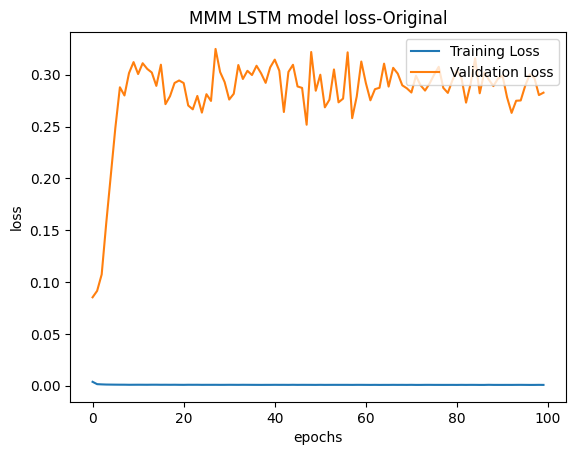

In [32]:
#Plot training and validation loss using history
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title(f'{ticker} LSTM model loss-{study_naam}')
plt.ylabel('loss')
plt.xlabel('epochs')
plt.legend(loc='upper right')
plt.show()

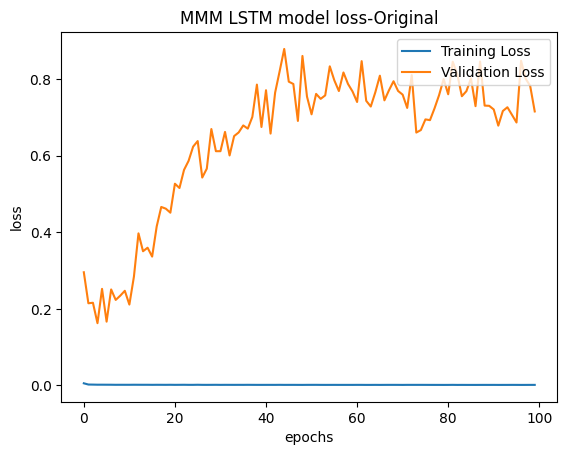

In [38]:
#Plot training and validation loss using history
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title(f'{ticker} LSTM model loss-{study_naam}')
plt.ylabel('loss')
plt.xlabel('epochs')
plt.legend(loc='upper right')
plt.show()

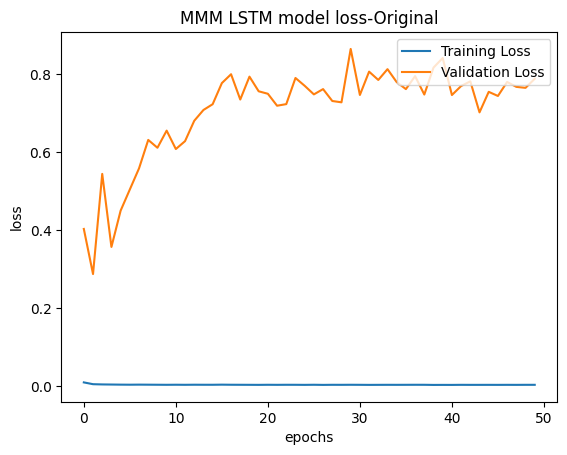

In [43]:
#Plot training and validation loss using history
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title(f'{ticker} LSTM model loss-{study_naam}')
plt.ylabel('loss')
plt.xlabel('epochs')
plt.legend(loc='upper right')
plt.show()

After hyperparameter tuning

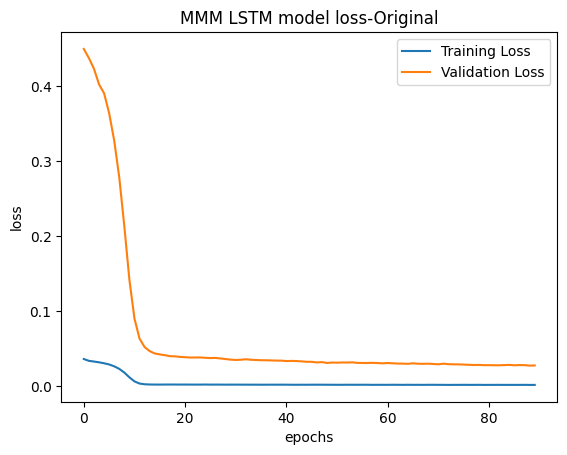

In [51]:
#Plot training and validation loss using history
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title(f'{ticker} LSTM model loss-{study_naam}')
plt.ylabel('loss')
plt.xlabel('epochs')
plt.legend(loc='upper right')
plt.show()

##### Save model

In [52]:
# Save the entire model as a `.keras` zip archive.
# best_model.save('TSLA_model_hyperparameter.keras')
best_model.save(f'saved_model_LSTM/{ticker}_model_{study_naam}_tuned')
# Save the weights
# model.save_weights('./checkpoints/my_checkpoint')

# Create a new model instance
# model = create_model()

# Restore the weights
# model.load_weights('./checkpoints/my_checkpoint')

INFO:tensorflow:Assets written to: saved_model_LSTM/MMM_model_Original_tuned/assets


INFO:tensorflow:Assets written to: saved_model_LSTM/MMM_model_Original_tuned/assets


In [53]:
best_model.summary()

Model: "sequential_23"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_140 (LSTM)             (None, 30, 40)            6720      
                                                                 
 dropout_140 (Dropout)       (None, 30, 40)            0         
                                                                 
 lstm_141 (LSTM)             (None, 30, 40)            12960     
                                                                 
 dropout_141 (Dropout)       (None, 30, 40)            0         
                                                                 
 lstm_142 (LSTM)             (None, 30, 40)            12960     
                                                                 
 dropout_142 (Dropout)       (None, 30, 40)            0         
                                                                 
 lstm_143 (LSTM)             (None, 30, 40)          

##### Load model

In [ ]:
new_model = tf.keras.models.load_model('TSLA_model_hyperparameter.keras')

##### Plot

In [35]:
if attn:
    a = "attention"
else:
    a = ""

print("****************************TEST************************************")
# plot_simple(stock_data,"test",f'Stock Price(Test) Prediction with CNN({a})',ticker,y_raw, predicted_stock_price_raw,10,6)
plot_interative(stock_data,"test",f'Stock Price(Test) Prediction with LSTM({a})',ticker,y_raw, predicted_stock_price_raw)

****************************TEST************************************


In [40]:
if attn:
    a = "attention"
else:
    a = ""

print("****************************TEST************************************")
# plot_simple(stock_data,"test",f'Stock Price(Test) Prediction with CNN({a})',ticker,y_raw, predicted_stock_price_raw,10,6)
plot_interative(stock_data,"test",f'Stock Price(Test) Prediction with LSTM({a})',ticker,y_raw, predicted_stock_price_raw)

****************************TEST************************************


In [44]:
if attn:
    a = "attention"
else:
    a = ""

print("****************************TEST************************************")
# plot_simple(stock_data,"test",f'Stock Price(Test) Prediction with CNN({a})',ticker,y_raw, predicted_stock_price_raw,10,6)
plot_interative(stock_data,"test",f'Stock Price(Test) Prediction with LSTM({a})',ticker,y_raw, predicted_stock_price_raw)

****************************TEST************************************


After hyperparameter tuning

In [54]:
if attn:
    a = "attention"
else:
    a = ""

print("****************************TEST************************************")
# plot_simple(stock_data,"test",f'Stock Price(Test) Prediction with CNN({a})',ticker,y_raw, predicted_stock_price_raw,10,6)
plot_interative(stock_data,"test",f'Stock Price(Test) Prediction with LSTM({a})',ticker,y_raw, predicted_stock_price_raw)

****************************TEST************************************


#### MMM - Filtered(SMA)

##### Start Tuning

The file 'MMM_data.csv' does exist.
Filter Name- SMA


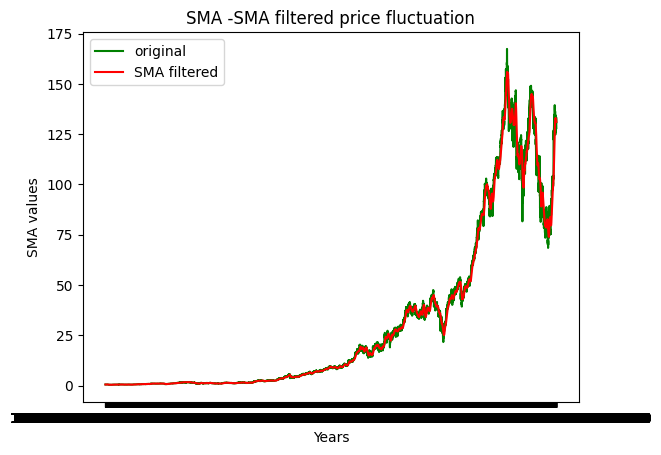

In [55]:
# win_size=20
# pred_step=10
# epoch_no=2
batch_size_no=32
# split_size=0.2
attn=False
# units=50
# drop_out=0.2
n_trial=50
ticker="MMM" #Cyient.NS, GAIL.NS, INFY.NS, TCS.NS, RELIANCE.NS
filter="SMA" # kalman, fourier, SMA, EMA, MACD, wavelet
# abc(ticker,win_size,pred_step,units,drop_out,n_trial,filter,epoch_no,batch_size_no,split_size,attn)
study_naam="SMA"
sma_win = 50 #Re run
tuning=False
stock_file_name=f"{ticker}_data.csv"
abc(stock_file_name,ticker,n_trial,filter,f"{study_naam}",tuning)

In [ ]:
# win_size=20
# pred_step=10
# epoch_no=2
batch_size_no=32
# split_size=0.2
attn=False
# units=50
# drop_out=0.2
n_trial=50
ticker="MMM" #Cyient.NS, GAIL.NS, INFY.NS, TCS.NS, RELIANCE.NS
filter="SMA" # kalman, fourier, SMA, EMA, MACD, wavelet
# abc(ticker,win_size,pred_step,units,drop_out,n_trial,filter,epoch_no,batch_size_no,split_size,attn)
study_naam="SMA"
sma_win = 10 #Re run
tuning=False
stock_file_name=f"{ticker}_data.csv"
abc(stock_file_name,ticker,n_trial,filter,f"{study_naam}",tuning)

##### After hyperparameter tuning - Train model with best values

In [56]:
win_size= study_lstm.best_trial.params['win_size']
epoch_no= study_lstm.best_trial.params['epoch_no']
drop_out= round(study_lstm.best_trial.params['drop_out'],2)
units= study_lstm.best_trial.params['units']
split_size= round(study_lstm.best_trial.params['split_size'],2)
optimizer_options =study_lstm.best_trial.params['optimizer_name']
num_of_layers= study_lstm.best_trial.params['no_layers']
loss_option= study_lstm.best_trial.params['loss_fn_name']
actv_option= study_lstm.best_trial.params['activation_name']

best_model = build_model(win_size,drop_out,units,split_size,optimizer_options,num_of_layers,loss_option,actv_option)
# print(f"**********************{filter} filter*************************")
history = best_model.fit(scaled_train_X, scaled_train_Y, epochs=epoch_no, batch_size=32, validation_data=(scaled_val_X, scaled_val_Y))

unscaled X_train size (11073, 30)
scaled X_train size (11073, 30, 1) (11073,)
Epoch 1/90
347/347 [==============================] - 13s 21ms/step - loss: 0.0373 - val_loss: 0.4429
Epoch 2/90
347/347 [==============================] - 6s 17ms/step - loss: 0.0339 - val_loss: 0.4290
Epoch 3/90
347/347 [==============================] - 6s 17ms/step - loss: 0.0324 - val_loss: 0.4022
Epoch 4/90
347/347 [==============================] - 6s 17ms/step - loss: 0.0296 - val_loss: 0.3581
Epoch 5/90
347/347 [==============================] - 6s 17ms/step - loss: 0.0261 - val_loss: 0.3103
Epoch 6/90
347/347 [==============================] - 6s 17ms/step - loss: 0.0206 - val_loss: 0.2370
Epoch 7/90
347/347 [==============================] - 6s 17ms/step - loss: 0.0133 - val_loss: 0.1535
Epoch 8/90
347/347 [==============================] - 6s 17ms/step - loss: 0.0067 - val_loss: 0.0919
Epoch 9/90
347/347 [==============================] - 6s 17ms/step - loss: 0.0033 - val_loss: 0.0604
Epoch 10/90


In [ ]:
win_size= 10#study_cnn.best_trial.params['win_size']
epoch_no= 100#study_cnn.best_trial.params['epoch_no']
drop_out= 0.4#round(study_cnn.best_trial.params['drop_out'],2)
units= 30#study_cnn.best_trial.params['units']
split_size= 0.4#round(study_cnn.best_trial.params['split_size'],2)
optimizer_options ='nadam'#study_cnn.best_trial.params['optimizer_name']
num_of_layers= 2#study_cnn.best_trial.params['no_layers']  
loss_option= 'log_cosh'#study_cnn.best_trial.params['loss_fn_name']
actv_option= 'gelu'#study_cnn.best_trial.params['activation_name']
filter_size= 64#study_cnn.best_trial.params['filter_size']
kernel_size= 3#study_cnn.best_trial.params['kernel_size']

best_model = build_model(win_size,drop_out,units,split_size,optimizer_options,num_of_layers,loss_option,actv_option)
# print(f"**********************{filter} filter*************************")
history = best_model.fit(scaled_train_X, scaled_train_Y, epochs=epoch_no, batch_size=32, validation_data=(scaled_val_X, scaled_val_Y))

##### Evalute tuned model

In [57]:
evaluate_model(best_model,scaled_test_X,scaled_test_Y, filter)

75/75 [==============================] - 2s 6ms/step
**********************SMA filter***************************
Mean Absolute Percentage Error (MAPE): 0.50%
Mean Absolute Error (MAE): 58.70
Root Mean Squared Error (RMSE): 61.65
R2 Score: -8.12


In [ ]:
evaluate_model(best_model,scaled_test_X,scaled_test_Y, filter)

##### Validation and training loss plot

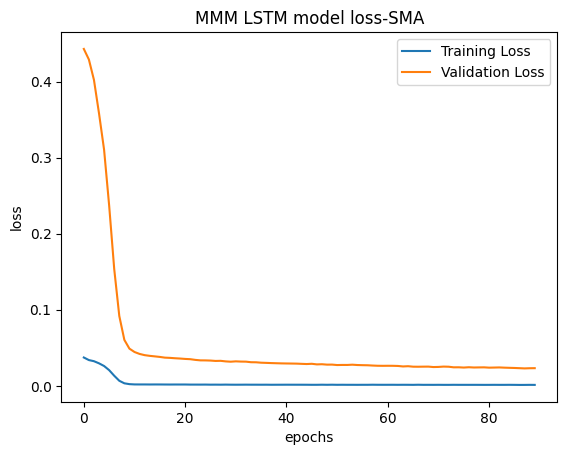

In [58]:

#Plot training and validation loss using history
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title(f'{ticker} LSTM model loss-{study_naam}')
plt.ylabel('loss')
plt.xlabel('epochs')
plt.legend(loc='upper right')
plt.show()

In [ ]:

#Plot training and validation loss using history
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title(f'{ticker} LSTM model loss-{study_naam}')
plt.ylabel('loss')
plt.xlabel('epochs')
plt.legend(loc='upper right')
plt.show()

##### Save model

In [59]:
# Save the entire model as a `.keras` zip archive.
# best_model.save(f'TSLA_model_hyperparameter_{filter}.keras')
best_model.save(f'saved_model_LSTM/{ticker}_model_{study_naam}_{sma_win}')
# Save the weights
# model.save_weights('./checkpoints/my_checkpoint')

# Create a new model instance
# model = create_model()

# Restore the weights
# model.load_weights('./checkpoints/my_checkpoint')

INFO:tensorflow:Assets written to: saved_model_LSTM/MMM_model_SMA_50/assets


INFO:tensorflow:Assets written to: saved_model_LSTM/MMM_model_SMA_50/assets


In [ ]:
best_model.summary()

##### Load model

In [ ]:
new_model = tf.keras.models.load_model('TSLA_model_hyperparameter.keras')

##### Plot

****************************TEST************************************


<Figure size 1000x600 with 0 Axes>

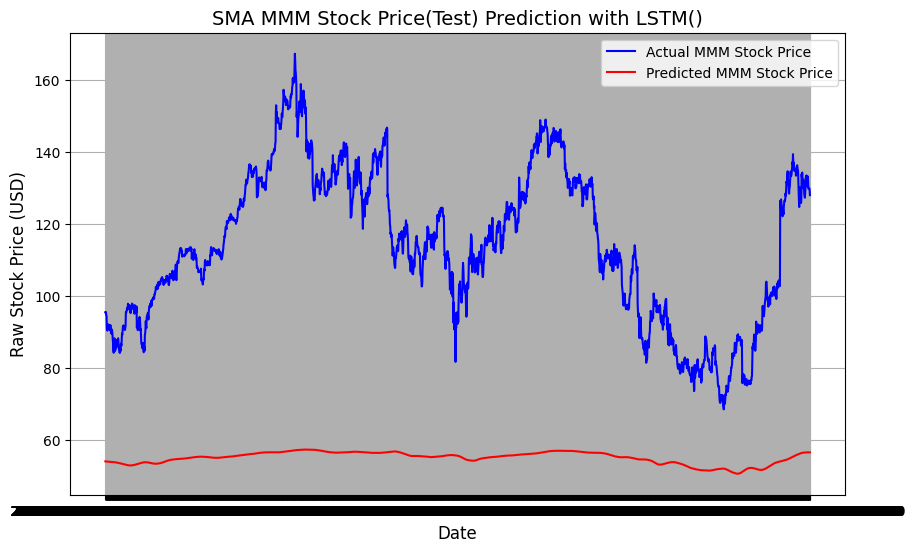

In [60]:
if attn:
    a = "attention"
else:
    a = ""
org_data_split(stock_data[['Close']].values,split_size,win_size)
print("****************************TEST************************************")
model_name="LSTM"
plot_simple(stock_data,"test",f'{study_naam} {ticker} Stock Price(Test) Prediction with {model_name}({a})',ticker,Org_y_test, predicted_stock_price_raw,10,6)
plot_interative(stock_data,"test",f'{study_naam} {ticker} Stock Price(Test) Prediction with {model_name}({a})',ticker,Org_y_test, predicted_stock_price_raw)

#### MMM - Filtered(kalman)

##### Start Tuning

The file 'MMM_data.csv' does exist.
Filter Name- kalman


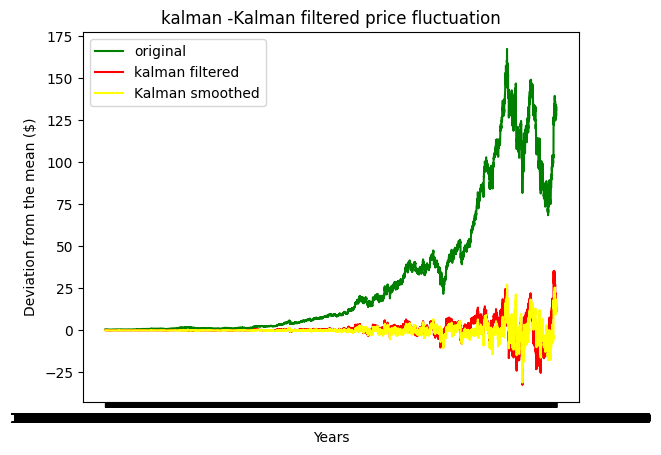

In [61]:
# win_size=20
# pred_step=10
# epoch_no=2
batch_size_no=32
# split_size=0.2
attn=False
# units=50
# drop_out=0.2
n_trial=50
ticker="MMM" #Cyient.NS, GAIL.NS, INFY.NS, TCS.NS, RELIANCE.NS
filter="kalman" # kalman, fourier, SMA, EMA, MACD, wavelet
# abc(ticker,win_size,pred_step,units,drop_out,n_trial,filter,epoch_no,batch_size_no,split_size,attn)
study_naam="kalman"
sma_win = 50 #Re run
tuning=False
stock_file_name=f"{ticker}_data.csv"
abc(stock_file_name,ticker,n_trial,filter,f"{study_naam}",tuning)

In [62]:
study_lstm.best_trial.params

{'win_size': 30,
 'epoch_no': 90,
 'split_size': 0.30000000000000004,
 'units': 40,
 'drop_out': 0.4,
 'optimizer_name': 'adagrad',
 'no_layers': 4,
 'loss_fn_name': 'mean_squared_logarithmic_error',
 'activation_name': 'gelu'}

##### After hyperparameter tuning - Evaluate model with best values

In [63]:
win_size= study_lstm.best_trial.params['win_size']
epoch_no= study_lstm.best_trial.params['epoch_no']
drop_out= round(study_lstm.best_trial.params['drop_out'],2)
units= study_lstm.best_trial.params['units']
split_size= round(study_lstm.best_trial.params['split_size'],2)
optimizer_options =study_lstm.best_trial.params['optimizer_name']
num_of_layers= study_lstm.best_trial.params['no_layers']
loss_option= study_lstm.best_trial.params['loss_fn_name']
actv_option= study_lstm.best_trial.params['activation_name']

best_model = build_model(win_size,drop_out,units,split_size,optimizer_options,num_of_layers,loss_option,actv_option)
# print(f"**********************{filter} filter*************************")
history = best_model.fit(scaled_train_X, scaled_train_Y, epochs=epoch_no, batch_size=32, validation_data=(scaled_val_X, scaled_val_Y))

unscaled X_train size (11073, 30)
scaled X_train size (11073, 30, 1) (11073,)
Epoch 1/90
347/347 [==============================] - 13s 21ms/step - loss: 0.0228 - val_loss: 0.0673
Epoch 2/90
347/347 [==============================] - 6s 17ms/step - loss: 0.0069 - val_loss: 0.0635
Epoch 3/90
347/347 [==============================] - 6s 17ms/step - loss: 0.0065 - val_loss: 0.0628
Epoch 4/90
347/347 [==============================] - 6s 17ms/step - loss: 0.0064 - val_loss: 0.0626
Epoch 5/90
347/347 [==============================] - 6s 17ms/step - loss: 0.0062 - val_loss: 0.0629
Epoch 6/90
347/347 [==============================] - 6s 17ms/step - loss: 0.0060 - val_loss: 0.0626
Epoch 7/90
347/347 [==============================] - 6s 17ms/step - loss: 0.0060 - val_loss: 0.0621
Epoch 8/90
347/347 [==============================] - 6s 17ms/step - loss: 0.0058 - val_loss: 0.0619
Epoch 9/90
347/347 [==============================] - 6s 17ms/step - loss: 0.0058 - val_loss: 0.0616
Epoch 10/90


##### Evaluate trained model

In [64]:
evaluate_model(best_model,scaled_test_X,scaled_test_Y, filter)

75/75 [==============================] - 2s 6ms/step
**********************kalman filter***************************
Mean Absolute Percentage Error (MAPE): 1.67%
Mean Absolute Error (MAE): 6.78
Root Mean Squared Error (RMSE): 8.58
R2 Score: 0.44


##### Val and training loss plot

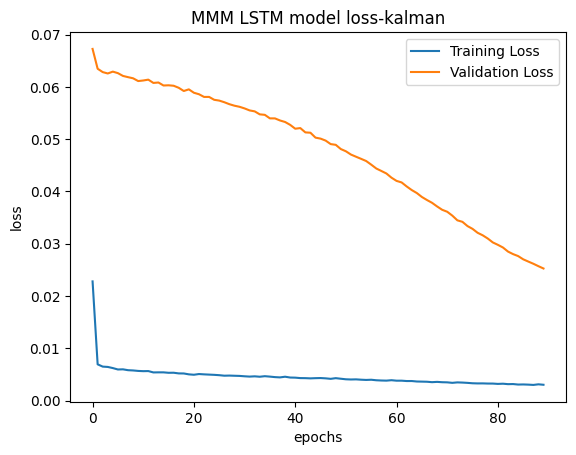

In [65]:

#Plot training and validation loss using history
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title(f'{ticker} LSTM model loss-{study_naam}')
plt.ylabel('loss')
plt.xlabel('epochs')
plt.legend(loc='upper right')
plt.show()

##### Save model

In [66]:
# Save the entire model as a `.keras` zip archive.
# best_model.save(f'TSLA_model_hyperparameter_{filter}.keras')
best_model.save(f'saved_model_LSTM/{ticker}_model_{study_naam}')
# Save the weights
# model.save_weights('./checkpoints/my_checkpoint')

# Create a new model instance
# model = create_model()

# Restore the weights
# model.load_weights('./checkpoints/my_checkpoint')

INFO:tensorflow:Assets written to: saved_model_LSTM/MMM_model_kalman/assets


INFO:tensorflow:Assets written to: saved_model_LSTM/MMM_model_kalman/assets


##### Load model

In [ ]:
new_model = tf.keras.models.load_model('TSLA_model_hyperparameter.keras')

##### Plot

In [67]:
if attn:
    a = "attention"
else:
    a = ""
org_data_split(stock_data[['Close']].values,split_size,win_size)
print("****************************TEST************************************")
model_name="LSTM"
# plot_simple(stock_data,"test",f'{study_naam} {ticker} Stock Price(Test) Prediction with {model_name}({a})',ticker,Org_y_test, predicted_stock_price_raw,10,6)
plot_interative(stock_data,"test",f'{study_naam} {ticker} Stock Price(Test) Prediction with {model_name}({a})',ticker,Org_y_test, predicted_stock_price_raw)

****************************TEST************************************


#### MMM - Filtered(EMA)

##### Start Tuning

The file 'MMM_data.csv' does exist.
Filter Name- EMA


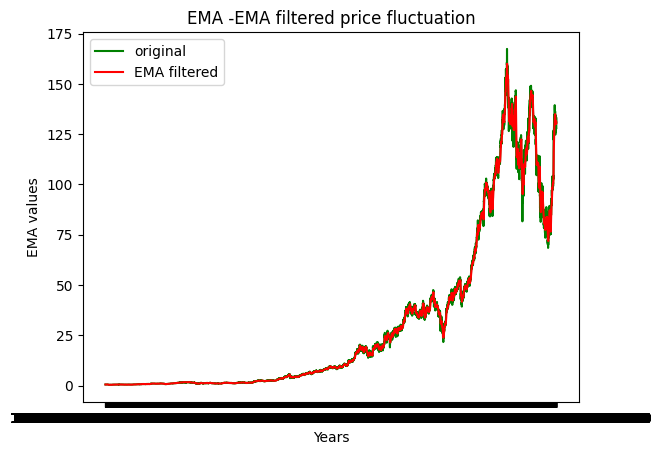

In [29]:
# win_size=20
# pred_step=10
# epoch_no=2
batch_size_no=32
# split_size=0.2
attn=False
# units=50
# drop_out=0.2
n_trial=50
ticker="MMM" #Cyient.NS, GAIL.NS, INFY.NS, TCS.NS, RELIANCE.NS
filter="EMA" # kalman, fourier, SMA, EMA, MACD, wavelet
# abc(ticker,win_size,pred_step,units,drop_out,n_trial,filter,epoch_no,batch_size_no,split_size,attn)
study_naam="EMA"
ema_win=20
tuning=False
stock_file_name=f"{ticker}_data.csv"
abc(stock_file_name,ticker,n_trial,filter,f"{study_naam}",tuning)

##### After hyperparameter tuning - Evaluate model with best values

In [32]:
win_size= 30#study_lstm.best_trial.params['win_size']
epoch_no= 100 #study_lstm.best_trial.params['epoch_no']
drop_out= 0.4 #round(study_lstm.best_trial.params['drop_out'],2)
units= 40#study_lstm.best_trial.params['units']
split_size= 0.3 #round(study_lstm.best_trial.params['split_size'],2)
optimizer_options ='adagrad' #study_lstm.best_trial.params['optimizer_name']
num_of_layers= 4  #study_lstm.best_trial.params['no_layers']
loss_option= 'mean_squared_logarithmic_error'#study_lstm.best_trial.params['loss_fn_name']
actv_option= 'gelu'#study_lstm.best_trial.params['activation_name']

best_model = build_model(win_size,drop_out,units,split_size,optimizer_options,num_of_layers,loss_option,actv_option)
# print(f"**********************{filter} filter*************************")
history = best_model.fit(scaled_train_X, scaled_train_Y, epochs=epoch_no, batch_size=32, validation_data=(scaled_val_X, scaled_val_Y))

unscaled X_train size (11073, 30)
scaled X_train size (11073, 30, 1) (11073,)


2025-01-08 16:30:38.680512: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1929] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 13797 MB memory:  -> device: 0, name: NVIDIA RTX A4000, pci bus id: 0000:65:00.0, compute capability: 8.6
2025-01-08 16:30:38.869021: E external/local_xla/xla/stream_executor/gpu/asm_compiler.cc:115] *** WARNING *** You are using ptxas 10.1.243, which is older than 11.1. ptxas before 11.1 is known to miscompile XLA code, leading to incorrect results or invalid-address errors.

2025-01-08 16:30:38.872031: W external/local_xla/xla/stream_executor/gpu/asm_compiler.cc:225] Falling back to the CUDA driver for PTX compilation; ptxas does not support CC 8.6
2025-01-08 16:30:38.872050: W external/local_xla/xla/stream_executor/gpu/asm_compiler.cc:228] Used ptxas at ptxas
2025-01-08 16:30:38.872094: W tensorflow/compiler/mlir/tools/kernel_gen/transforms/gpu_kernel_to_blob_pass.cc:191] Failed to compile generated PTX with ptxas. Falling back to comp

Epoch 1/100


2025-01-08 16:30:45.987376: I external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:454] Loaded cuDNN version 8904
2025-01-08 16:30:45.998659: E external/local_xla/xla/stream_executor/gpu/asm_compiler.cc:115] *** WARNING *** You are using ptxas 10.1.243, which is older than 11.1. ptxas before 11.1 is known to miscompile XLA code, leading to incorrect results or invalid-address errors.

2025-01-08 16:30:45.999738: E external/local_xla/xla/stream_executor/gpu/asm_compiler.cc:115] *** WARNING *** You are using ptxas 10.1.243, which is older than 11.1. ptxas before 11.1 is known to miscompile XLA code, leading to incorrect results or invalid-address errors.

2025-01-08 16:30:46.000695: W tensorflow/compiler/mlir/tools/kernel_gen/transforms/gpu_kernel_to_blob_pass.cc:191] Failed to compile generated PTX with ptxas. Falling back to compilation by driver.
2025-01-08 16:30:46.001062: E external/local_xla/xla/stream_executor/gpu/asm_compiler.cc:115] *** WARNING *** You are using ptxas 10.1.24

347/347 [==============================] - 15s 23ms/step - loss: 0.0383 - val_loss: 0.4693
Epoch 2/100
347/347 [==============================] - 7s 20ms/step - loss: 0.0342 - val_loss: 0.4441
Epoch 3/100
347/347 [==============================] - 7s 19ms/step - loss: 0.0332 - val_loss: 0.4262
Epoch 4/100
347/347 [==============================] - 7s 20ms/step - loss: 0.0315 - val_loss: 0.4096
Epoch 5/100
347/347 [==============================] - 7s 19ms/step - loss: 0.0302 - val_loss: 0.3839
Epoch 6/100
347/347 [==============================] - 6s 19ms/step - loss: 0.0273 - val_loss: 0.3471
Epoch 7/100
347/347 [==============================] - 7s 19ms/step - loss: 0.0235 - val_loss: 0.2937
Epoch 8/100
347/347 [==============================] - 7s 19ms/step - loss: 0.0180 - val_loss: 0.2321
Epoch 9/100
347/347 [==============================] - 7s 19ms/step - loss: 0.0119 - val_loss: 0.1662
Epoch 10/100
347/347 [==============================] - 7s 20ms/step - loss: 0.0067 - val_los

In [37]:
win_size= 30#study_lstm.best_trial.params['win_size']
epoch_no= 100 #study_lstm.best_trial.params['epoch_no']
drop_out= 0.4 #round(study_lstm.best_trial.params['drop_out'],2)
units= 40#study_lstm.best_trial.params['units']
split_size= 0.3 #round(study_lstm.best_trial.params['split_size'],2)
optimizer_options ='adam' #study_lstm.best_trial.params['optimizer_name']
num_of_layers= 4  #study_lstm.best_trial.params['no_layers']
loss_option= 'mean_squared_error'#study_lstm.best_trial.params['loss_fn_name']
actv_option= 'gelu'#study_lstm.best_trial.params['activation_name']

best_model = build_model(win_size,drop_out,units,split_size,optimizer_options,num_of_layers,loss_option,actv_option)
# print(f"**********************{filter} filter*************************")
history = best_model.fit(scaled_train_X, scaled_train_Y, epochs=epoch_no, batch_size=32, validation_data=(scaled_val_X, scaled_val_Y))

unscaled X_train size (11073, 30)
scaled X_train size (11073, 30, 1) (11073,)
Epoch 1/100


2025-01-08 16:44:46.203285: E external/local_xla/xla/stream_executor/gpu/asm_compiler.cc:115] *** WARNING *** You are using ptxas 10.1.243, which is older than 11.1. ptxas before 11.1 is known to miscompile XLA code, leading to incorrect results or invalid-address errors.

2025-01-08 16:44:46.247275: E external/local_xla/xla/stream_executor/gpu/asm_compiler.cc:115] *** WARNING *** You are using ptxas 10.1.243, which is older than 11.1. ptxas before 11.1 is known to miscompile XLA code, leading to incorrect results or invalid-address errors.

2025-01-08 16:44:46.325274: E external/local_xla/xla/stream_executor/gpu/asm_compiler.cc:115] *** WARNING *** You are using ptxas 10.1.243, which is older than 11.1. ptxas before 11.1 is known to miscompile XLA code, leading to incorrect results or invalid-address errors.

2025-01-08 16:44:46.333770: E external/local_xla/xla/stream_executor/gpu/asm_compiler.cc:115] *** WARNING *** You are using ptxas 10.1.243, which is older than 11.1. ptxas before

347/347 [==============================] - 14s 23ms/step - loss: 0.0052 - val_loss: 0.2083
Epoch 2/100
347/347 [==============================] - 7s 20ms/step - loss: 0.0026 - val_loss: 0.1650
Epoch 3/100
347/347 [==============================] - 7s 20ms/step - loss: 0.0024 - val_loss: 0.2153
Epoch 4/100
347/347 [==============================] - 7s 19ms/step - loss: 0.0021 - val_loss: 0.2630
Epoch 5/100
347/347 [==============================] - 7s 19ms/step - loss: 0.0020 - val_loss: 0.2738
Epoch 6/100
347/347 [==============================] - 7s 19ms/step - loss: 0.0018 - val_loss: 0.2909
Epoch 7/100
347/347 [==============================] - 6s 18ms/step - loss: 0.0016 - val_loss: 0.2834
Epoch 8/100
347/347 [==============================] - 7s 19ms/step - loss: 0.0018 - val_loss: 0.3216
Epoch 9/100
347/347 [==============================] - 7s 20ms/step - loss: 0.0016 - val_loss: 0.3020
Epoch 10/100
347/347 [==============================] - 7s 20ms/step - loss: 0.0016 - val_los

##### Evaluate trained model

In [33]:
evaluate_model(best_model,scaled_test_X,scaled_test_Y, filter)

75/75 [==============================] - 2s 7ms/step
**********************EMA filter***************************
Mean Absolute Percentage Error (MAPE): 0.56%
Mean Absolute Error (MAE): 65.59
Root Mean Squared Error (RMSE): 68.52
R2 Score: -10.03


In [38]:
evaluate_model(best_model,scaled_test_X,scaled_test_Y, filter)

75/75 [==============================] - 2s 6ms/step
**********************EMA filter***************************
Mean Absolute Percentage Error (MAPE): 0.65%
Mean Absolute Error (MAE): 75.41
Root Mean Squared Error (RMSE): 78.18
R2 Score: -13.37


##### Val and training loss plot

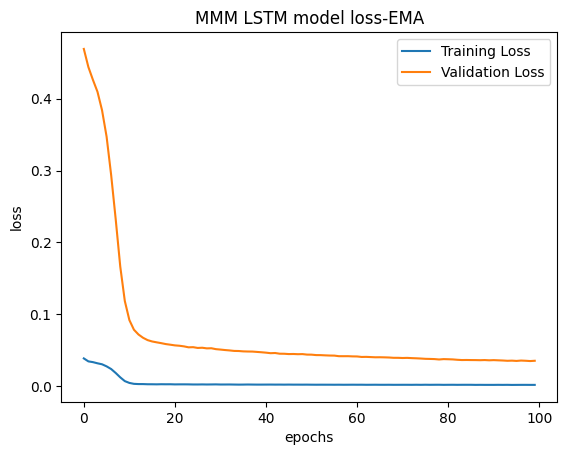

In [34]:

#Plot training and validation loss using history
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title(f'{ticker} LSTM model loss-{study_naam}')
plt.ylabel('loss')
plt.xlabel('epochs')
plt.legend(loc='upper right')
plt.show()

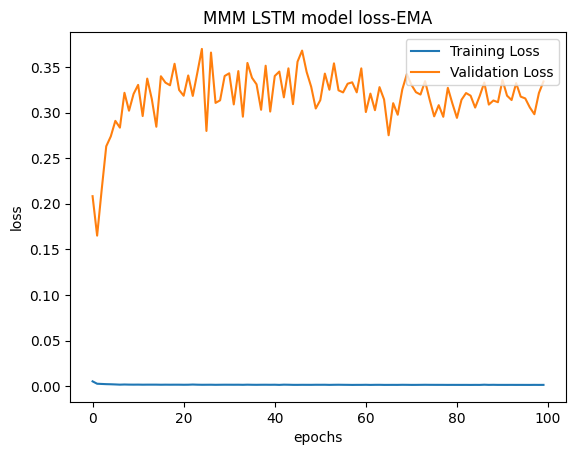

In [39]:

#Plot training and validation loss using history
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title(f'{ticker} LSTM model loss-{study_naam}')
plt.ylabel('loss')
plt.xlabel('epochs')
plt.legend(loc='upper right')
plt.show()

##### Save model

In [35]:
# Save the entire model as a `.keras` zip archive.
# best_model.save(f'TSLA_model_hyperparameter_{filter}.keras')
best_model.save(f'saved_model_LSTM/{ticker}_model_{study_naam}_{ema_win}')
# Save the weights
# model.save_weights('./checkpoints/my_checkpoint')

# Create a new model instance
# model = create_model()

# Restore the weights
# model.load_weights('./checkpoints/my_checkpoint')

INFO:tensorflow:Assets written to: saved_model_LSTM/MMM_model_EMA_20/assets


INFO:tensorflow:Assets written to: saved_model_LSTM/MMM_model_EMA_20/assets


##### Load model

In [ ]:
new_model = tf.keras.models.load_model('TSLA_model_hyperparameter.keras')

##### Plot

In [36]:
if attn:
    a = "attention"
else:
    a = ""
org_data_split(stock_data[['Close']].values,split_size,win_size)
print("****************************TEST************************************")
model_name="LSTM"
# plot_simple(stock_data,"test",f'{study_naam} {ticker} Stock Price(Test) Prediction with {model_name}({a})',ticker,Org_y_test, predicted_stock_price_raw,10,6)
plot_interative(stock_data,"test",f'{study_naam} {ticker} Stock Price(Test) Prediction with {model_name}({a})',ticker,Org_y_test, predicted_stock_price_raw)

****************************TEST************************************


#### TSLA - Filtered(MACD)

##### Start Tuning

[I 2024-11-26 19:16:09,397] A new study created in memory with name: MACD


Filter Name- MACD
Epoch 1/10
91/91 [==============================] - 3s 14ms/step - loss: 0.0078 - val_loss: 0.0103
Epoch 2/10
91/91 [==============================] - 1s 8ms/step - loss: 0.0024 - val_loss: 0.0093
Epoch 3/10
91/91 [==============================] - 1s 8ms/step - loss: 0.0021 - val_loss: 0.0081
Epoch 4/10
91/91 [==============================] - 1s 8ms/step - loss: 0.0020 - val_loss: 0.0082
Epoch 5/10
91/91 [==============================] - 1s 8ms/step - loss: 0.0018 - val_loss: 0.0071
Epoch 6/10
91/91 [==============================] - 1s 8ms/step - loss: 0.0016 - val_loss: 0.0062
Epoch 7/10
91/91 [==============================] - 1s 8ms/step - loss: 0.0016 - val_loss: 0.0055
Epoch 8/10
91/91 [==============================] - 1s 8ms/step - loss: 0.0014 - val_loss: 0.0041
Epoch 9/10
91/91 [==============================] - 1s 8ms/step - loss: 0.0012 - val_loss: 0.0048
Epoch 10/10
91/91 [==============================] - 1s 8ms/step - loss: 0.0013 - val_loss: 0.0033


[I 2024-11-26 19:16:20,064] Trial 0 finished with value: 0.0032991310581564903 and parameters: {'win_size': 20, 'epoch_no': 10, 'split_size': 0.2, 'units': 70, 'drop_out': 0.2}. Best is trial 0 with value: 0.0032991310581564903.


loss value [0.010338778607547283, 0.009312453679740429, 0.008104554377496243, 0.008184535428881645, 0.0070703160017728806, 0.006199487950652838, 0.005478709004819393, 0.0040875328704714775, 0.004820379428565502, 0.0032991310581564903]
Epoch 1/25
68/68 [==============================] - 4s 20ms/step - loss: 0.0092 - val_loss: 0.0087
Epoch 2/25
68/68 [==============================] - 1s 11ms/step - loss: 9.5575e-04 - val_loss: 0.0086
Epoch 3/25
68/68 [==============================] - 1s 12ms/step - loss: 8.2655e-04 - val_loss: 0.0088
Epoch 4/25
68/68 [==============================] - 1s 12ms/step - loss: 7.4906e-04 - val_loss: 0.0085
Epoch 5/25
68/68 [==============================] - 1s 12ms/step - loss: 6.9822e-04 - val_loss: 0.0087
Epoch 6/25
68/68 [==============================] - 1s 12ms/step - loss: 6.5303e-04 - val_loss: 0.0093
Epoch 7/25
68/68 [==============================] - 1s 11ms/step - loss: 6.2656e-04 - val_loss: 0.0092
Epoch 8/25
68/68 [==============================

[I 2024-11-26 19:16:35,230] Trial 1 finished with value: 0.008545308373868465 and parameters: {'win_size': 40, 'epoch_no': 25, 'split_size': 0.4, 'units': 70, 'drop_out': 0.2}. Best is trial 0 with value: 0.0032991310581564903.


loss value [0.008725729770958424, 0.008564658463001251, 0.008764608763158321, 0.008545308373868465, 0.008692014962434769, 0.009346519596874714, 0.009218539111316204, 0.01007468905299902, 0.009372632950544357, 0.009564652107656002, 0.009989520534873009, 0.010228118859231472, 0.010320046916604042, 0.010919501073658466]
Best parameters: for MACD filter {'win_size': 20, 'epoch_no': 10, 'split_size': 0.2, 'units': 70, 'drop_out': 0.2}
Best value: for MACD filter 0.0032991310581564903
    win_size: 20
    epoch_no: 10
    split_size: 0.2
    units: 70
    drop_out: 0.2


({'win_size': 20,
  'epoch_no': 10,
  'split_size': 0.2,
  'units': 70,
  'drop_out': 0.2},
 0.0032991310581564903)

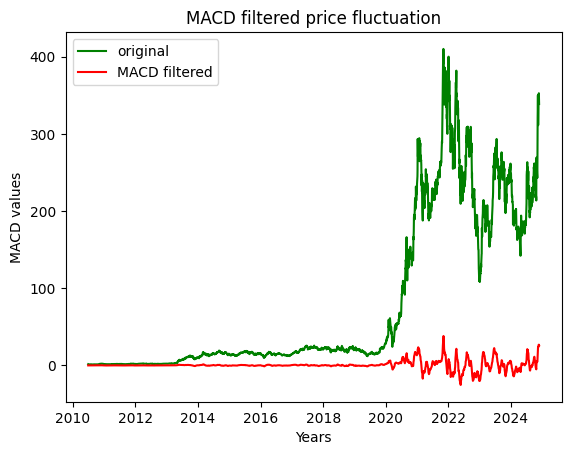

In [ ]:
# win_size=20
# pred_step=10
# epoch_no=2
batch_size_no=32
# split_size=0.2
attn=False
# units=50
# drop_out=0.2
n_trial=2
ticker="TSLA" #Cyient.NS, GAIL.NS, INFY.NS, TCS.NS, RELIANCE.NS
filter="MACD" # kalman, fourier, SMA, EMA, MACD, wavelet
# abc(ticker,win_size,pred_step,units,drop_out,n_trial,filter,epoch_no,batch_size_no,split_size,attn)
study_naam="MACD"
abc(ticker,n_trial,filter,f"{study_naam}",batch_size_no,attn)

##### Optuna plot

In [ ]:
optuna.visualization.plot_optimization_history(study_lstm)

In [ ]:
# optuna-dashboard sqlite:///db.sqlite3

optuna.visualization.plot_slice(study_lstm)

##### Best parameter values

In [ ]:
study_lstm.best_trial.params

{'win_size': 20,
 'epoch_no': 10,
 'split_size': 0.2,
 'units': 70,
 'drop_out': 0.2}

##### After hyperparameter tuning - Evaluate model with best values

In [ ]:
win_size=study_lstm.best_trial.params['win_size']
pred_step=10
epoch_no=study_lstm.best_trial.params['epoch_no']
batch_size_no=32
split_size=round(study_lstm.best_trial.params['split_size'],2)
attn=False
units=study_lstm.best_trial.params['units']
drop_out=round(study_lstm.best_trial.params['drop_out'],2)
n_trial=0
best_model = build_model(win_size,drop_out,units,split_size)
# print(f"**********************{study_naam} filter*************************")

scaled_data_unfilt = scaler.transform(tesla_data[['Close']].values)
X_unfilt,y_unfilt = create_sequences(scaled_data_unfilt,study_lstm.best_trial.params['win_size'])
X_test_unfilt = X_unfilt[-len(X_test):]
y_test_unfilt = y_unfilt[-len(y_test):]

history = best_model.fit(X_train, y_train, epochs=epoch_no, batch_size=32, validation_data=(X_test_unfilt, y_test_unfilt))
# abc("TSLA",win_size,pred_step,units,drop_out,n_trial,epoch_no,batch_size_no,split_size,attn)

Epoch 1/10
91/91 [==============================] - 3s 14ms/step - loss: 0.0100 - val_loss: 0.0096
Epoch 2/10
91/91 [==============================] - 1s 8ms/step - loss: 0.0020 - val_loss: 0.0080
Epoch 3/10
91/91 [==============================] - 1s 9ms/step - loss: 0.0019 - val_loss: 0.0063
Epoch 4/10
91/91 [==============================] - 1s 8ms/step - loss: 0.0018 - val_loss: 0.0053
Epoch 5/10
91/91 [==============================] - 1s 8ms/step - loss: 0.0015 - val_loss: 0.0043
Epoch 6/10
91/91 [==============================] - 1s 8ms/step - loss: 0.0014 - val_loss: 0.0037
Epoch 7/10
91/91 [==============================] - 1s 8ms/step - loss: 0.0012 - val_loss: 0.0035
Epoch 8/10
91/91 [==============================] - 1s 8ms/step - loss: 0.0012 - val_loss: 0.0028
Epoch 9/10
91/91 [==============================] - 1s 9ms/step - loss: 0.0010 - val_loss: 0.0026
Epoch 10/10
91/91 [==============================] - 1s 8ms/step - loss: 9.8636e-04 - val_loss: 0.0025


##### Evaluate trained model

In [ ]:
evaluate_model(best_model,X_test_unfilt,y_test_unfilt, filter)

23/23 [==============================] - 1s 3ms/step
**********************MACD filter***************************
Mean Absolute Percentage Error (MAPE): 1.92%
Mean Absolute Error (MAE): 2.41
Root Mean Squared Error (RMSE): 3.14
R2 Score: 0.91


##### Val and training loss plot

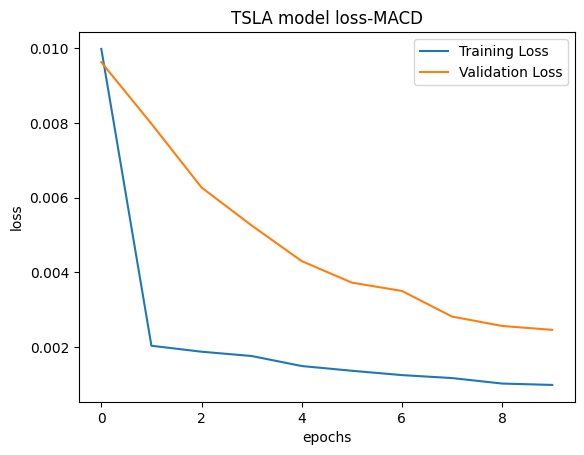

In [ ]:
#Plot training and validation loss using history
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title(f'{ticker} model loss-{study_naam}')
plt.ylabel('loss')
plt.xlabel('epochs')
plt.legend(loc='upper right')
plt.show()

##### Save model

In [ ]:
# Save the entire model as a `.keras` zip archive.
best_model.save(f'TSLA_model_hyperparameter_{filter}.keras')

# Save the weights
# model.save_weights('./checkpoints/my_checkpoint')

# Create a new model instance
# model = create_model()

# Restore the weights
# model.load_weights('./checkpoints/my_checkpoint')

In [ ]:
best_model.summary()

Model: "sequential_20"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_40 (LSTM)              (None, 20, 70)            20160     
                                                                 
 dropout_40 (Dropout)        (None, 20, 70)            0         
                                                                 
 lstm_41 (LSTM)              (None, 70)                39480     
                                                                 
 dropout_41 (Dropout)        (None, 70)                0         
                                                                 
 dense_20 (Dense)            (None, 1)                 71        
                                                                 
Total params: 59711 (233.25 KB)
Trainable params: 59711 (233.25 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


##### Load model

In [ ]:
new_model = tf.keras.models.load_model('TSLA_model_hyperparameter.keras')

##### Plot

****************************TEST************************************


<Figure size 1000x600 with 0 Axes>

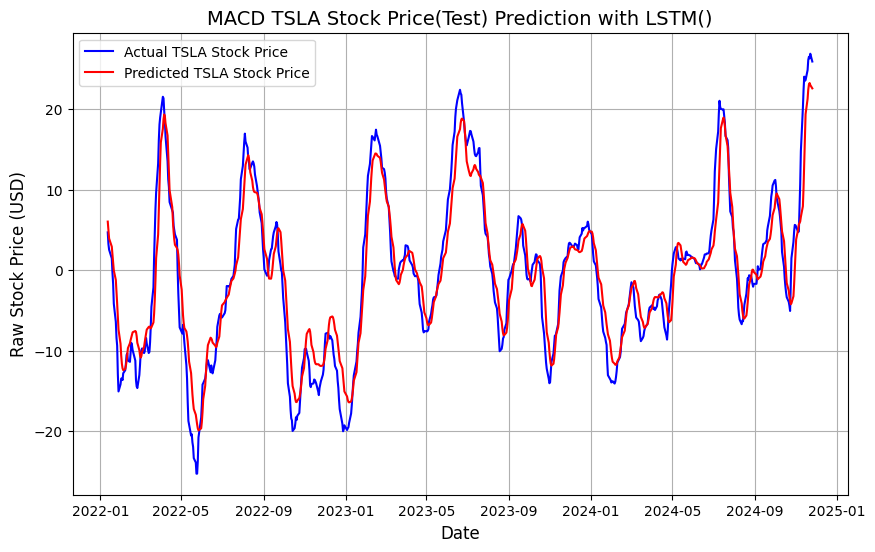

In [ ]:
if attn:
    a = "attention"
else:
    a = ""

print("****************************TEST************************************")
model_name="LSTM"
plot_simple(tesla_data,"test",f'{study_naam} {ticker} Stock Price(Test) Prediction with {model_name}({a})',ticker,y_raw, predicted_stock_price_raw,10,6)
plot_interative(tesla_data,"test",f'{study_naam} {ticker} Stock Price(Test) Prediction with {model_name}({a})',ticker,y_raw, predicted_stock_price_raw)

#### MMM - Filtered(Fourier)

##### Start Tuning

The file 'MMM_data.csv' does exist.
freq- [ 0.00000000e+00  6.30954634e-05  1.26190927e-04 ... -1.89286390e-04
 -1.26190927e-04 -6.30954634e-05]
amp- [480674.12022886 341676.29187914 202154.25583769 ... 151775.07892297
 202154.25583769 341676.29187914]


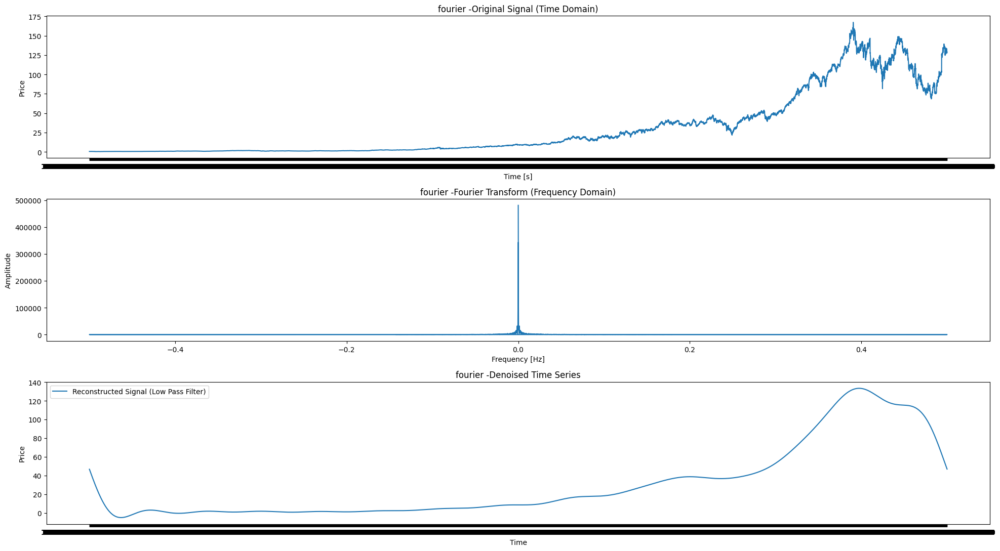

Filter Name- fourier


In [74]:
# win_size=20
# pred_step=10
# epoch_no=2
batch_size_no=32
# split_size=0.2
attn=False
# units=50
# drop_out=0.2
n_trial=2
threshold = 0.001 #0.2, 0.1, 0.05, 0.01, 0.005, 0.001
ticker="MMM" #Cyient.NS, GAIL.NS, INFY.NS, TCS.NS, RELIANCE.NS
filter="fourier" # kalman, fourier, SMA, EMA, MACD, wavelet
# abc(ticker,win_size,pred_step,units,drop_out,n_trial,filter,epoch_no,batch_size_no,split_size,attn)
study_naam="fourier"
tuning=False
stock_file_name=f"{ticker}_data.csv"
abc(stock_file_name,ticker,n_trial,filter,f"{study_naam}",tuning)

In [ ]:
# win_size=20
# pred_step=10
# epoch_no=2
batch_size_no=32
# split_size=0.2
attn=False
# units=50
# drop_out=0.2
n_trial=2
threshold = 0.2 #0.2, 0.1, 0.05, 0.01, 0.005, 0.001
ticker="MMM" #Cyient.NS, GAIL.NS, INFY.NS, TCS.NS, RELIANCE.NS
filter="fourier" # kalman, fourier, SMA, EMA, MACD, wavelet
# abc(ticker,win_size,pred_step,units,drop_out,n_trial,filter,epoch_no,batch_size_no,split_size,attn)
study_naam="fourier"
tuning=False
stock_file_name=f"{ticker}_data.csv"
abc(stock_file_name,ticker,n_trial,filter,f"{study_naam}",tuning)

In [ ]:
# win_size=20
# pred_step=10
# epoch_no=2
batch_size_no=32
# split_size=0.2
attn=False
# units=50
# drop_out=0.2
n_trial=2
threshold = 0.01 #0.2, 0.1, 0.05, 0.01, 0.005, 0.001
ticker="MMM" #Cyient.NS, GAIL.NS, INFY.NS, TCS.NS, RELIANCE.NS
filter="fourier" # kalman, fourier, SMA, EMA, MACD, wavelet
# abc(ticker,win_size,pred_step,units,drop_out,n_trial,filter,epoch_no,batch_size_no,split_size,attn)
study_naam="fourier"
tuning=False
stock_file_name=f"{ticker}_data.csv"
abc(stock_file_name,ticker,n_trial,filter,f"{study_naam}",tuning)

##### After hyperparameter tuning - Train model with best values

In [75]:
win_size= study_lstm.best_trial.params['win_size']
epoch_no= study_lstm.best_trial.params['epoch_no']
drop_out= round(study_lstm.best_trial.params['drop_out'],2)
units= study_lstm.best_trial.params['units']
split_size= round(study_lstm.best_trial.params['split_size'],2)
optimizer_options =study_lstm.best_trial.params['optimizer_name']
num_of_layers= study_lstm.best_trial.params['no_layers']
loss_option= study_lstm.best_trial.params['loss_fn_name']
actv_option= study_lstm.best_trial.params['activation_name']

best_model = build_model(win_size,drop_out,units,split_size,optimizer_options,num_of_layers,loss_option,actv_option)
# print(f"**********************{filter} filter*************************")
history = best_model.fit(scaled_train_X, scaled_train_Y, epochs=epoch_no, batch_size=32, validation_data=(scaled_val_X, scaled_val_Y))

unscaled X_train size (11073, 30)
scaled X_train size (11073, 30, 1) (11073,)
Epoch 1/90
347/347 [==============================] - 13s 21ms/step - loss: 0.0354 - val_loss: 0.3435
Epoch 2/90
347/347 [==============================] - 6s 17ms/step - loss: 0.0276 - val_loss: 0.3220
Epoch 3/90
347/347 [==============================] - 6s 17ms/step - loss: 0.0264 - val_loss: 0.3067
Epoch 4/90
347/347 [==============================] - 6s 17ms/step - loss: 0.0255 - val_loss: 0.2919
Epoch 5/90
347/347 [==============================] - 6s 17ms/step - loss: 0.0242 - val_loss: 0.2788
Epoch 6/90
347/347 [==============================] - 6s 17ms/step - loss: 0.0232 - val_loss: 0.2630
Epoch 7/90
347/347 [==============================] - 6s 17ms/step - loss: 0.0214 - val_loss: 0.2403
Epoch 8/90
347/347 [==============================] - 6s 17ms/step - loss: 0.0191 - val_loss: 0.2056
Epoch 9/90
347/347 [==============================] - 6s 17ms/step - loss: 0.0160 - val_loss: 0.1683
Epoch 10/90


##### Evaluate trained model

In [76]:
evaluate_model(best_model,scaled_test_X,scaled_test_Y, filter)

75/75 [==============================] - 2s 5ms/step
**********************fourier filter***************************
Mean Absolute Percentage Error (MAPE): 0.46%
Mean Absolute Error (MAE): 53.77
Root Mean Squared Error (RMSE): 56.20
R2 Score: -7.54


##### Val and training loss plot

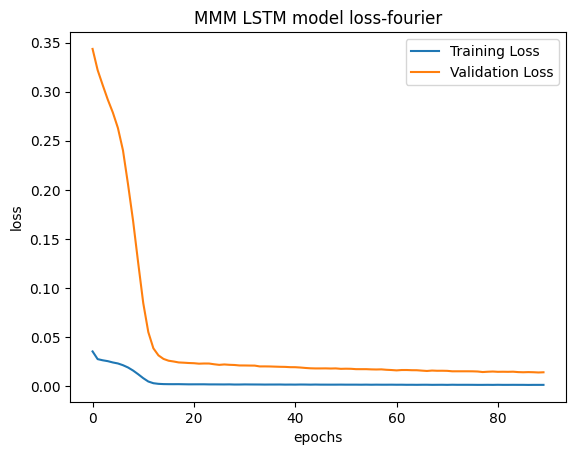

In [77]:

#Plot training and validation loss using history
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title(f'{ticker} LSTM model loss-{study_naam}')
plt.ylabel('loss')
plt.xlabel('epochs')
plt.legend(loc='upper right')
plt.show()

##### Save model

In [78]:
# Save the entire model as a `.keras` zip archive.
# best_model.save(f'TSLA_model_hyperparameter_{filter}.keras')
best_model.save(f'saved_model_LSTM/{ticker}_model_{study_naam}_{threshold}')
# Save the weights
# model.save_weights('./checkpoints/my_checkpoint')

# Create a new model instance
# model = create_model()

# Restore the weights
# model.load_weights('./checkpoints/my_checkpoint')

INFO:tensorflow:Assets written to: saved_model_LSTM/MMM_model_fourier_0.001/assets


INFO:tensorflow:Assets written to: saved_model_LSTM/MMM_model_fourier_0.001/assets


In [ ]:
best_model.summary()

##### Load model

In [ ]:
new_model = tf.keras.models.load_model('TSLA_model_hyperparameter.keras')

##### Plot

In [79]:
if attn:
    a = "attention"
else:
    a = ""
org_data_split(stock_data[['Close']].values,split_size,win_size)
print("****************************TEST************************************")
model_name="LSTM"
# plot_simple(stock_data,"test",f'{study_naam} {ticker} Stock Price(Test) Prediction with {model_name}({a})',ticker,Org_y_test, predicted_stock_price_raw,10,6)
plot_interative(stock_data,"test",f'{study_naam} {ticker} Stock Price(Test) Prediction with {model_name}({a})',ticker,Org_y_test, predicted_stock_price_raw)

****************************TEST************************************


#### MMM - Filtered(Wavelet)

##### Start Tuning

The file 'MMM_data.csv' does exist.
length of details- 8
Threshold enabled- False


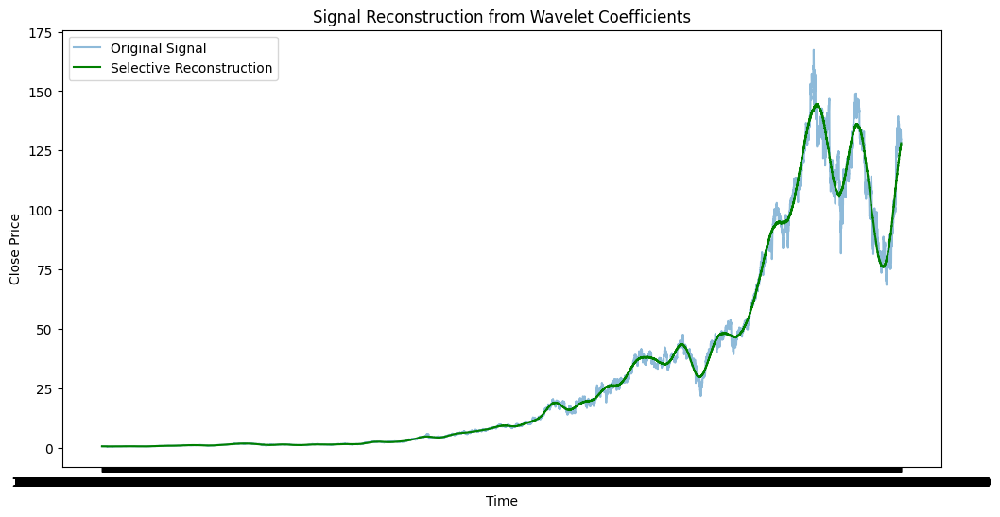

Filter Name- wavelet


In [84]:
# win_size=20
# pred_step=10
# epoch_no=2
batch_size_no=32
# split_size=0.2
attn=False
# units=50
# drop_out=0.2
n_trial=2
ticker="MMM" #Cyient.NS, GAIL.NS, INFY.NS, TCS.NS, RELIANCE.NS
filter="wavelet" # kalman, fourier, SMA, EMA, MACD, wavelet
# abc(ticker,win_size,pred_step,units,drop_out,n_trial,filter,epoch_no,batch_size_no,split_size,attn)
study_naam="wavelet"
# detail_index=0
# wavelet_name="db4"
# approx_enable=True
# threshold_enable=False
# thresh_value=0
tuning=False
stock_file_name=f"{ticker}_data.csv"
detail_index=8
#'haar', 'db', 'sym', 'coif', 'bior', 'rbio', 'dmey', 'gaus',
# 'mexh', 'morl', 'cgau', 'shan', 'fbsp', 'cmor'
wavelet_name="dmey"
approx_enable=False
threshold_enable=False
thresh_value=0
abc(stock_file_name,ticker,n_trial,filter,f"{study_naam}",tuning,detail_index,wavelet_name,approx_enable,threshold_enable,thresh_value)

The file 'MMM_data.csv' does exist.
length of details- 8
Threshold enabled- False


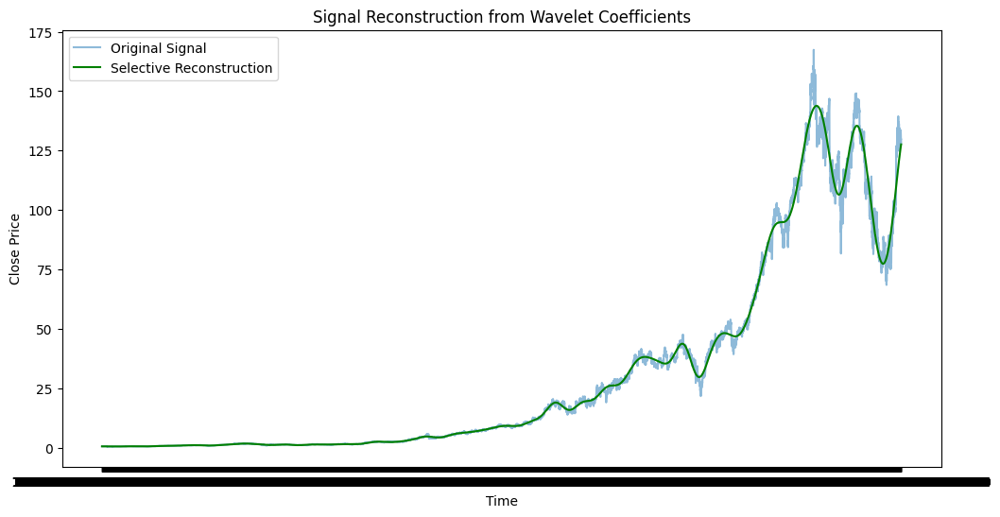

Filter Name- wavelet


In [90]:
# win_size=20
# pred_step=10
# epoch_no=2
batch_size_no=32
# split_size=0.2
attn=False
# units=50
# drop_out=0.2
n_trial=2
ticker="MMM" #Cyient.NS, GAIL.NS, INFY.NS, TCS.NS, RELIANCE.NS
filter="wavelet" # kalman, fourier, SMA, EMA, MACD, wavelet
# abc(ticker,win_size,pred_step,units,drop_out,n_trial,filter,epoch_no,batch_size_no,split_size,attn)
study_naam="wavelet"
# detail_index=0
# wavelet_name="db4"
# approx_enable=True
# threshold_enable=False
# thresh_value=0
tuning=False
stock_file_name=f"{ticker}_data.csv"
detail_index=8
#'haar', 'db', 'sym', 'coif', 'bior', 'rbio', 'dmey', 'gaus',
# 'mexh', 'morl', 'cgau', 'shan', 'fbsp', 'cmor'
wavelet_name="sym18"
approx_enable=False
threshold_enable=False
thresh_value=0
abc(stock_file_name,ticker,n_trial,filter,f"{study_naam}",tuning,detail_index,wavelet_name,approx_enable,threshold_enable,thresh_value)

The file 'MMM_data.csv' does exist.
length of details- 11
Threshold enabled- False


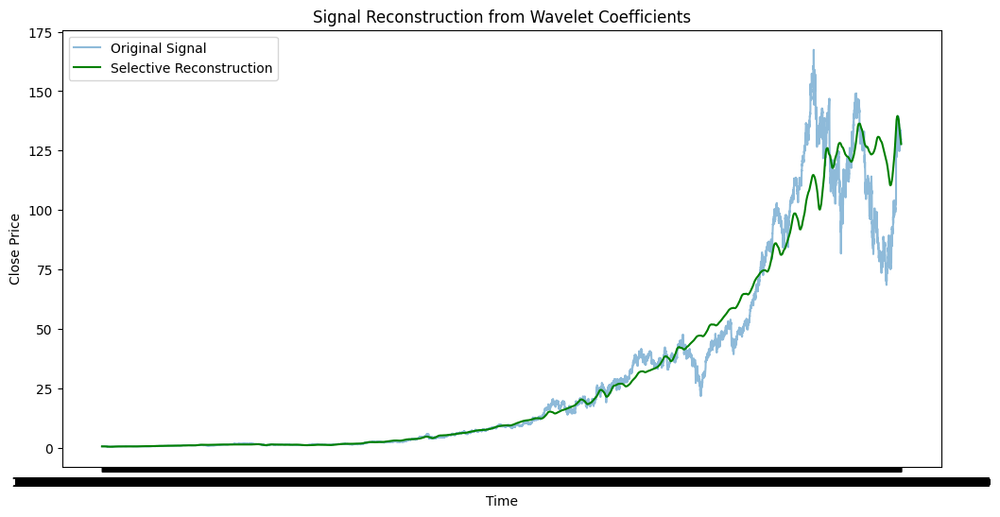

Filter Name- wavelet


In [96]:
# win_size=20
# pred_step=10
# epoch_no=2
batch_size_no=32
# split_size=0.2
attn=False
# units=50
# drop_out=0.2
n_trial=2
ticker="MMM" #Cyient.NS, GAIL.NS, INFY.NS, TCS.NS, RELIANCE.NS
filter="wavelet" # kalman, fourier, SMA, EMA, MACD, wavelet
# abc(ticker,win_size,pred_step,units,drop_out,n_trial,filter,epoch_no,batch_size_no,split_size,attn)
study_naam="wavelet"
# detail_index=0
# wavelet_name="db4"
# approx_enable=True
# threshold_enable=False
# thresh_value=0
tuning=False
stock_file_name=f"{ticker}_data.csv"
detail_index=3
#'haar', 'db', 'sym', 'coif', 'bior', 'rbio', 'dmey', 'gaus',
# 'mexh', 'morl', 'cgau', 'shan', 'fbsp', 'cmor'
wavelet_name="db4"
approx_enable=False
threshold_enable=False
thresh_value=0
abc(stock_file_name,ticker,n_trial,filter,f"{study_naam}",tuning,detail_index,wavelet_name,approx_enable,threshold_enable,thresh_value)

The file 'MMM_data.csv' does exist.
length of details- 8
Threshold enabled- False


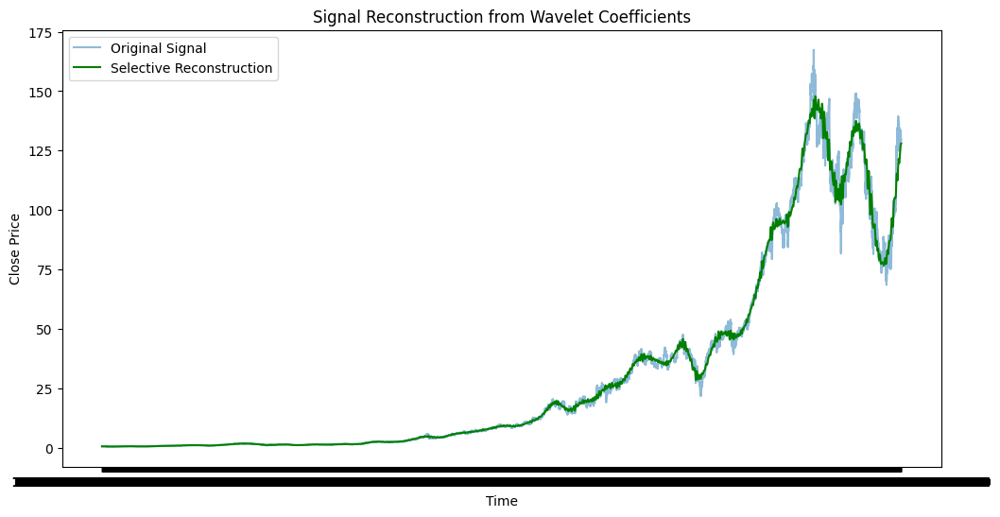

Filter Name- wavelet


In [102]:
# win_size=20
# pred_step=10
# epoch_no=2
batch_size_no=32
# split_size=0.2
attn=False
# units=50
# drop_out=0.2
n_trial=2
ticker="MMM" #Cyient.NS, GAIL.NS, INFY.NS, TCS.NS, RELIANCE.NS
filter="wavelet" # kalman, fourier, SMA, EMA, MACD, wavelet
# abc(ticker,win_size,pred_step,units,drop_out,n_trial,filter,epoch_no,batch_size_no,split_size,attn)
study_naam="wavelet"
# detail_index=0
# wavelet_name="db4"
# approx_enable=True
# threshold_enable=False
# thresh_value=0
tuning=False
stock_file_name=f"{ticker}_data.csv"
detail_index=3
#'haar', 'db', 'sym', 'coif', 'bior', 'rbio', 'dmey', 'gaus',
# 'mexh', 'morl', 'cgau', 'shan', 'fbsp', 'cmor'
wavelet_name="sym18"
approx_enable=False
threshold_enable=False
thresh_value=0
abc(stock_file_name,ticker,n_trial,filter,f"{study_naam}",tuning,detail_index,wavelet_name,approx_enable,threshold_enable,thresh_value)

In [108]:
study_lstm.best_params

{'win_size': 30,
 'epoch_no': 90,
 'split_size': 0.30000000000000004,
 'units': 40,
 'drop_out': 0.4,
 'optimizer_name': 'adagrad',
 'no_layers': 4,
 'loss_fn_name': 'mean_squared_logarithmic_error',
 'activation_name': 'gelu'}

##### After hyperparameter tuning - Train model with best values

In [85]:
win_size= study_lstm.best_trial.params['win_size']
epoch_no= study_lstm.best_trial.params['epoch_no']
drop_out= round(study_lstm.best_trial.params['drop_out'],2)
units= study_lstm.best_trial.params['units']
split_size= round(study_lstm.best_trial.params['split_size'],2)
optimizer_options =study_lstm.best_trial.params['optimizer_name']
num_of_layers= study_lstm.best_trial.params['no_layers']
loss_option= study_lstm.best_trial.params['loss_fn_name']
actv_option= study_lstm.best_trial.params['activation_name']

best_model = build_model(win_size,drop_out,units,split_size,optimizer_options,num_of_layers,loss_option,actv_option)
# print(f"**********************{filter} filter*************************")
history = best_model.fit(scaled_train_X, scaled_train_Y, epochs=epoch_no, batch_size=32, validation_data=(scaled_val_X, scaled_val_Y))

unscaled X_train size (11074, 30)
scaled X_train size (11074, 30, 1) (11074,)
Epoch 1/90
347/347 [==============================] - 14s 24ms/step - loss: 0.0415 - val_loss: 0.4750
Epoch 2/90
347/347 [==============================] - 7s 20ms/step - loss: 0.0360 - val_loss: 0.4283
Epoch 3/90
347/347 [==============================] - 7s 20ms/step - loss: 0.0317 - val_loss: 0.3642
Epoch 4/90
347/347 [==============================] - 7s 20ms/step - loss: 0.0254 - val_loss: 0.2769
Epoch 5/90
347/347 [==============================] - 7s 19ms/step - loss: 0.0163 - val_loss: 0.1788
Epoch 6/90
347/347 [==============================] - 7s 19ms/step - loss: 0.0084 - val_loss: 0.1095
Epoch 7/90
347/347 [==============================] - 7s 19ms/step - loss: 0.0045 - val_loss: 0.0777
Epoch 8/90
347/347 [==============================] - 6s 18ms/step - loss: 0.0033 - val_loss: 0.0638
Epoch 9/90
347/347 [==============================] - 7s 20ms/step - loss: 0.0030 - val_loss: 0.0571
Epoch 10/90


In [91]:
win_size= study_lstm.best_trial.params['win_size']
epoch_no= study_lstm.best_trial.params['epoch_no']
drop_out= round(study_lstm.best_trial.params['drop_out'],2)
units= study_lstm.best_trial.params['units']
split_size= round(study_lstm.best_trial.params['split_size'],2)
optimizer_options =study_lstm.best_trial.params['optimizer_name']
num_of_layers= study_lstm.best_trial.params['no_layers']
loss_option= study_lstm.best_trial.params['loss_fn_name']
actv_option= study_lstm.best_trial.params['activation_name']

best_model = build_model(win_size,drop_out,units,split_size,optimizer_options,num_of_layers,loss_option,actv_option)
# print(f"**********************{filter} filter*************************")
history = best_model.fit(scaled_train_X, scaled_train_Y, epochs=epoch_no, batch_size=32, validation_data=(scaled_val_X, scaled_val_Y))

unscaled X_train size (11074, 30)
scaled X_train size (11074, 30, 1) (11074,)
Epoch 1/90
347/347 [==============================] - 13s 21ms/step - loss: 0.0402 - val_loss: 0.4685
Epoch 2/90
347/347 [==============================] - 6s 17ms/step - loss: 0.0351 - val_loss: 0.4178
Epoch 3/90
347/347 [==============================] - 6s 17ms/step - loss: 0.0300 - val_loss: 0.3487
Epoch 4/90
347/347 [==============================] - 6s 17ms/step - loss: 0.0224 - val_loss: 0.2511
Epoch 5/90
347/347 [==============================] - 6s 17ms/step - loss: 0.0126 - val_loss: 0.1546
Epoch 6/90
347/347 [==============================] - 6s 17ms/step - loss: 0.0055 - val_loss: 0.0982
Epoch 7/90
347/347 [==============================] - 6s 17ms/step - loss: 0.0030 - val_loss: 0.0741
Epoch 8/90
347/347 [==============================] - 6s 17ms/step - loss: 0.0026 - val_loss: 0.0636
Epoch 9/90
347/347 [==============================] - 6s 17ms/step - loss: 0.0023 - val_loss: 0.0586
Epoch 10/90


In [97]:
win_size= study_lstm.best_trial.params['win_size']
epoch_no= study_lstm.best_trial.params['epoch_no']
drop_out= round(study_lstm.best_trial.params['drop_out'],2)
units= study_lstm.best_trial.params['units']
split_size= round(study_lstm.best_trial.params['split_size'],2)
optimizer_options =study_lstm.best_trial.params['optimizer_name']
num_of_layers= study_lstm.best_trial.params['no_layers']
loss_option= study_lstm.best_trial.params['loss_fn_name']
actv_option= study_lstm.best_trial.params['activation_name']

best_model = build_model(win_size,drop_out,units,split_size,optimizer_options,num_of_layers,loss_option,actv_option)
# print(f"**********************{filter} filter*************************")
history = best_model.fit(scaled_train_X, scaled_train_Y, epochs=epoch_no, batch_size=32, validation_data=(scaled_val_X, scaled_val_Y))

unscaled X_train size (11074, 30)
scaled X_train size (11074, 30, 1) (11074,)
Epoch 1/90
347/347 [==============================] - 13s 21ms/step - loss: 0.0366 - val_loss: 0.5538
Epoch 2/90
347/347 [==============================] - 6s 17ms/step - loss: 0.0325 - val_loss: 0.5107
Epoch 3/90
347/347 [==============================] - 6s 17ms/step - loss: 0.0291 - val_loss: 0.4348
Epoch 4/90
347/347 [==============================] - 6s 17ms/step - loss: 0.0235 - val_loss: 0.3369
Epoch 5/90
347/347 [==============================] - 6s 17ms/step - loss: 0.0156 - val_loss: 0.2248
Epoch 6/90
347/347 [==============================] - 6s 17ms/step - loss: 0.0075 - val_loss: 0.1373
Epoch 7/90
347/347 [==============================] - 6s 17ms/step - loss: 0.0036 - val_loss: 0.0967
Epoch 8/90
347/347 [==============================] - 6s 17ms/step - loss: 0.0026 - val_loss: 0.0803
Epoch 9/90
347/347 [==============================] - 6s 17ms/step - loss: 0.0023 - val_loss: 0.0731
Epoch 10/90


In [103]:
win_size= study_lstm.best_trial.params['win_size']
epoch_no= study_lstm.best_trial.params['epoch_no']
drop_out= round(study_lstm.best_trial.params['drop_out'],2)
units= study_lstm.best_trial.params['units']
split_size= round(study_lstm.best_trial.params['split_size'],2)
optimizer_options =study_lstm.best_trial.params['optimizer_name']
num_of_layers= study_lstm.best_trial.params['no_layers']
loss_option= study_lstm.best_trial.params['loss_fn_name']
actv_option= study_lstm.best_trial.params['activation_name']

best_model = build_model(win_size,drop_out,units,split_size,optimizer_options,num_of_layers,loss_option,actv_option)
# print(f"**********************{filter} filter*************************")
history = best_model.fit(scaled_train_X, scaled_train_Y, epochs=epoch_no, batch_size=32, validation_data=(scaled_val_X, scaled_val_Y))

unscaled X_train size (11074, 30)
scaled X_train size (11074, 30, 1) (11074,)
Epoch 1/90
347/347 [==============================] - 13s 21ms/step - loss: 0.0383 - val_loss: 0.4511
Epoch 2/90
347/347 [==============================] - 6s 17ms/step - loss: 0.0342 - val_loss: 0.4159
Epoch 3/90
347/347 [==============================] - 6s 17ms/step - loss: 0.0308 - val_loss: 0.3640
Epoch 4/90
347/347 [==============================] - 6s 17ms/step - loss: 0.0252 - val_loss: 0.2787
Epoch 5/90
347/347 [==============================] - 6s 17ms/step - loss: 0.0169 - val_loss: 0.1807
Epoch 6/90
347/347 [==============================] - 6s 17ms/step - loss: 0.0080 - val_loss: 0.1038
Epoch 7/90
347/347 [==============================] - 6s 17ms/step - loss: 0.0040 - val_loss: 0.0697
Epoch 8/90
347/347 [==============================] - 6s 17ms/step - loss: 0.0026 - val_loss: 0.0577
Epoch 9/90
347/347 [==============================] - 6s 17ms/step - loss: 0.0023 - val_loss: 0.0519
Epoch 10/90


In [109]:
win_size= study_lstm.best_trial.params['win_size']
epoch_no= study_lstm.best_trial.params['epoch_no']
drop_out= round(study_lstm.best_trial.params['drop_out'],2)
units= study_lstm.best_trial.params['units']
split_size= round(study_lstm.best_trial.params['split_size'],2)
optimizer_options = 'adam' #study_lstm.best_trial.params['optimizer_name']
num_of_layers= study_lstm.best_trial.params['no_layers']
loss_option= 'mean_squared_error' #study_lstm.best_trial.params['loss_fn_name']
actv_option= study_lstm.best_trial.params['activation_name']

best_model = build_model(win_size,drop_out,units,split_size,optimizer_options,num_of_layers,loss_option,actv_option)
# print(f"**********************{filter} filter*************************")
history = best_model.fit(scaled_train_X, scaled_train_Y, epochs=epoch_no, batch_size=32, validation_data=(scaled_val_X, scaled_val_Y))

unscaled X_train size (11074, 30)
scaled X_train size (11074, 30, 1) (11074,)
Epoch 1/90


2025-01-02 14:44:34.834885: E external/local_xla/xla/stream_executor/gpu/asm_compiler.cc:115] *** WARNING *** You are using ptxas 10.1.243, which is older than 11.1. ptxas before 11.1 is known to miscompile XLA code, leading to incorrect results or invalid-address errors.

2025-01-02 14:44:34.944342: E external/local_xla/xla/stream_executor/gpu/asm_compiler.cc:115] *** WARNING *** You are using ptxas 10.1.243, which is older than 11.1. ptxas before 11.1 is known to miscompile XLA code, leading to incorrect results or invalid-address errors.

2025-01-02 14:44:34.950671: E external/local_xla/xla/stream_executor/gpu/asm_compiler.cc:115] *** WARNING *** You are using ptxas 10.1.243, which is older than 11.1. ptxas before 11.1 is known to miscompile XLA code, leading to incorrect results or invalid-address errors.



347/347 [==============================] - 18s 22ms/step - loss: 0.0054 - val_loss: 0.2386
Epoch 2/90
347/347 [==============================] - 6s 17ms/step - loss: 0.0030 - val_loss: 0.2412
Epoch 3/90
347/347 [==============================] - 6s 17ms/step - loss: 0.0023 - val_loss: 0.2666
Epoch 4/90
347/347 [==============================] - 6s 17ms/step - loss: 0.0022 - val_loss: 0.3419
Epoch 5/90
347/347 [==============================] - 6s 17ms/step - loss: 0.0019 - val_loss: 0.3299
Epoch 6/90
347/347 [==============================] - 6s 17ms/step - loss: 0.0017 - val_loss: 0.3372
Epoch 7/90
347/347 [==============================] - 6s 17ms/step - loss: 0.0017 - val_loss: 0.3436
Epoch 8/90
347/347 [==============================] - 6s 17ms/step - loss: 0.0017 - val_loss: 0.3624
Epoch 9/90
347/347 [==============================] - 6s 17ms/step - loss: 0.0017 - val_loss: 0.3527
Epoch 10/90
347/347 [==============================] - 6s 17ms/step - loss: 0.0017 - val_loss: 0.3321

##### Evaluate trained model

In [86]:
evaluate_model(best_model,scaled_test_X,scaled_test_Y, filter)

75/75 [==============================] - 2s 6ms/step
**********************wavelet filter***************************
Mean Absolute Percentage Error (MAPE): 0.51%
Mean Absolute Error (MAE): 59.84
Root Mean Squared Error (RMSE): 62.47
R2 Score: -9.36


In [92]:
evaluate_model(best_model,scaled_test_X,scaled_test_Y, filter)

75/75 [==============================] - 2s 5ms/step
**********************wavelet filter***************************
Mean Absolute Percentage Error (MAPE): 0.53%
Mean Absolute Error (MAE): 61.56
Root Mean Squared Error (RMSE): 64.09
R2 Score: -10.21


In [98]:
evaluate_model(best_model,scaled_test_X,scaled_test_Y, filter)

75/75 [==============================] - 2s 6ms/step
**********************wavelet filter***************************
Mean Absolute Percentage Error (MAPE): 0.57%
Mean Absolute Error (MAE): 66.59
Root Mean Squared Error (RMSE): 68.02
R2 Score: -20.53


In [104]:
evaluate_model(best_model,scaled_test_X,scaled_test_Y, filter)

75/75 [==============================] - 2s 6ms/step
**********************wavelet filter***************************
Mean Absolute Percentage Error (MAPE): 0.52%
Mean Absolute Error (MAE): 60.32
Root Mean Squared Error (RMSE): 62.96
R2 Score: -9.69


In [110]:
evaluate_model(best_model,scaled_test_X,scaled_test_Y, filter)

75/75 [==============================] - 2s 6ms/step
**********************wavelet filter***************************
Mean Absolute Percentage Error (MAPE): 0.66%
Mean Absolute Error (MAE): 75.89
Root Mean Squared Error (RMSE): 78.30
R2 Score: -15.53


##### Val and training loss plot

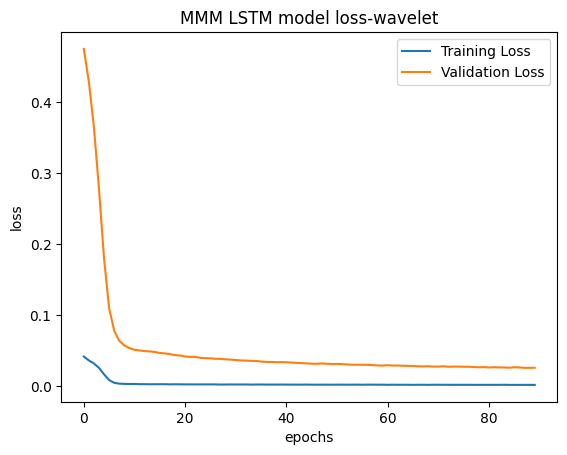

In [87]:

#Plot training and validation loss using history
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title(f'{ticker} LSTM model loss-{study_naam}')
plt.ylabel('loss')
plt.xlabel('epochs')
plt.legend(loc='upper right')
plt.show()

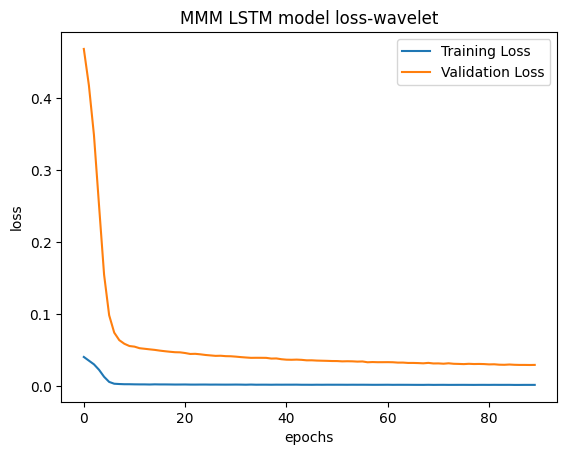

In [93]:

#Plot training and validation loss using history
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title(f'{ticker} LSTM model loss-{study_naam}')
plt.ylabel('loss')
plt.xlabel('epochs')
plt.legend(loc='upper right')
plt.show()

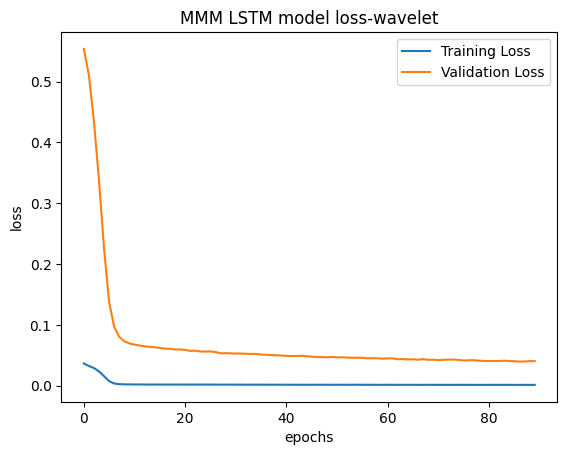

In [99]:

#Plot training and validation loss using history
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title(f'{ticker} LSTM model loss-{study_naam}')
plt.ylabel('loss')
plt.xlabel('epochs')
plt.legend(loc='upper right')
plt.show()

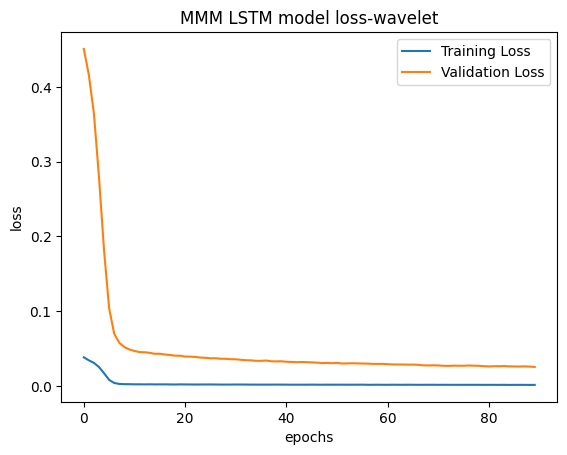

In [105]:

#Plot training and validation loss using history
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title(f'{ticker} LSTM model loss-{study_naam}')
plt.ylabel('loss')
plt.xlabel('epochs')
plt.legend(loc='upper right')
plt.show()

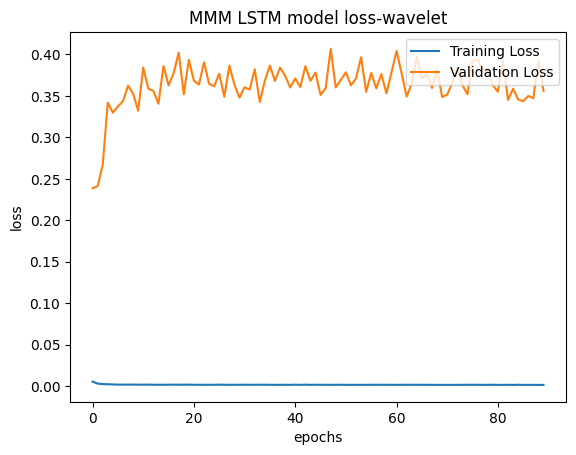

In [111]:

#Plot training and validation loss using history
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title(f'{ticker} LSTM model loss-{study_naam}')
plt.ylabel('loss')
plt.xlabel('epochs')
plt.legend(loc='upper right')
plt.show()

##### Save model

In [112]:
# Save the entire model as a `.keras` zip archive.
best_model.save(f'saved_model_LSTM/{ticker}_model_{study_naam}_{wavelet_name}({detail_index})_MSE_adam')

# Save the weights
# model.save_weights('./checkpoints/my_checkpoint')

# Create a new model instance
# model = create_model()

# Restore the weights
# model.load_weights('./checkpoints/my_checkpoint')

INFO:tensorflow:Assets written to: saved_model_LSTM/MMM_model_wavelet_sym18(3)_MSE_adam/assets


INFO:tensorflow:Assets written to: saved_model_LSTM/MMM_model_wavelet_sym18(3)_MSE_adam/assets


##### Load model

In [ ]:
new_model = tf.keras.models.load_model('TSLA_model_hyperparameter.keras')

##### Plot

In [89]:
if attn:
    a = "attention"
else:
    a = ""
org_data_split(stock_data[['Close']].values,split_size,win_size)
print("****************************TEST************************************")
model_name="LSTM"
# plot_simple(stock_data,"test",f'{study_naam} {ticker} Stock Price(Test) Prediction with {model_name}({a})',ticker,Org_y_test, predicted_stock_price_raw,10,6)
plot_interative(stock_data,"test",f'{study_naam} {ticker} Stock Price(Test) Prediction with {model_name}({a})',ticker,Org_y_test, predicted_stock_price_raw)

****************************TEST************************************


In [95]:
if attn:
    a = "attention"
else:
    a = ""
org_data_split(stock_data[['Close']].values,split_size,win_size)
print("****************************TEST************************************")
model_name="LSTM"
# plot_simple(stock_data,"test",f'{study_naam} {ticker} Stock Price(Test) Prediction with {model_name}({a})',ticker,Org_y_test, predicted_stock_price_raw,10,6)
plot_interative(stock_data,"test",f'{study_naam} {ticker} Stock Price(Test) Prediction with {model_name}({a})',ticker,Org_y_test, predicted_stock_price_raw)

****************************TEST************************************


In [101]:
if attn:
    a = "attention"
else:
    a = ""
org_data_split(stock_data[['Close']].values,split_size,win_size)
print("****************************TEST************************************")
model_name="LSTM"
# plot_simple(stock_data,"test",f'{study_naam} {ticker} Stock Price(Test) Prediction with {model_name}({a})',ticker,Org_y_test, predicted_stock_price_raw,10,6)
plot_interative(stock_data,"test",f'{study_naam} {ticker} Stock Price(Test) Prediction with {model_name}({a})',ticker,Org_y_test, predicted_stock_price_raw)

****************************TEST************************************


In [107]:
if attn:
    a = "attention"
else:
    a = ""
org_data_split(stock_data[['Close']].values,split_size,win_size)
print("****************************TEST************************************")
model_name="LSTM"
# plot_simple(stock_data,"test",f'{study_naam} {ticker} Stock Price(Test) Prediction with {model_name}({a})',ticker,Org_y_test, predicted_stock_price_raw,10,6)
plot_interative(stock_data,"test",f'{study_naam} {ticker} Stock Price(Test) Prediction with {model_name}({a})',ticker,Org_y_test, predicted_stock_price_raw)

****************************TEST************************************


In [113]:
if attn:
    a = "attention"
else:
    a = ""
org_data_split(stock_data[['Close']].values,split_size,win_size)
print("****************************TEST************************************")
model_name="LSTM"
# plot_simple(stock_data,"test",f'{study_naam} {ticker} Stock Price(Test) Prediction with {model_name}({a})',ticker,Org_y_test, predicted_stock_price_raw,10,6)
plot_interative(stock_data,"test",f'{study_naam} {ticker} Stock Price(Test) Prediction with {model_name}({a})',ticker,Org_y_test, predicted_stock_price_raw)

****************************TEST************************************


#### TSLA - Filtered(MSTL)

##### Start Tuning

In [ ]:
# win_size=20
# pred_step=10
# epoch_no=2
batch_size_no=32
# split_size=0.2
attn=False
# units=50
# drop_out=0.2
n_trial=2
ticker="TSLA" #Cyient.NS, GAIL.NS, INFY.NS, TCS.NS, RELIANCE.NS
filter="MSTL" # kalman, fourier, SMA, EMA, MACD, wavelet
# abc(ticker,win_size,pred_step,units,drop_out,n_trial,filter,epoch_no,batch_size_no,split_size,attn)
study_naam="MSTL"
detail_index=0
wavelet_name="db4"
approx_enable=True
threshold_enable=False
thresh_value=0
mstl_period=[7]
abc(ticker,n_trial,filter,study_naam,batch_size_no,attn,detail_index,wavelet_name,approx_enable,threshold_enable,thresh_value,mstl_period)

[I 2024-12-02 11:52:43,550] A new study created in memory with name: mstl
2024-12-02 11:52:44.902007: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1929] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 14031 MB memory:  -> device: 0, name: NVIDIA RTX A4000, pci bus id: 0000:65:00.0, compute capability: 8.6
2024-12-02 11:52:46.145986: E external/local_xla/xla/stream_executor/gpu/asm_compiler.cc:115] *** WARNING *** You are using ptxas 10.1.243, which is older than 11.1. ptxas before 11.1 is known to miscompile XLA code, leading to incorrect results or invalid-address errors.

2024-12-02 11:52:46.148606: W external/local_xla/xla/stream_executor/gpu/asm_compiler.cc:225] Falling back to the CUDA driver for PTX compilation; ptxas does not support CC 8.6
2024-12-02 11:52:46.148646: W external/local_xla/xla/stream_executor/gpu/asm_compiler.cc:228] Used ptxas at ptxas
2024-12-02 11:52:46.148730: W tensorflow/compiler/mlir/tools/kernel_gen/transforms/gpu_kernel_to_blob_pas

Epoch 1/10


2024-12-02 11:52:49.114097: I external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:454] Loaded cuDNN version 8904
2024-12-02 11:52:49.441480: E external/local_xla/xla/stream_executor/gpu/asm_compiler.cc:115] *** WARNING *** You are using ptxas 10.1.243, which is older than 11.1. ptxas before 11.1 is known to miscompile XLA code, leading to incorrect results or invalid-address errors.

2024-12-02 11:52:49.443098: W tensorflow/compiler/mlir/tools/kernel_gen/transforms/gpu_kernel_to_blob_pass.cc:191] Failed to compile generated PTX with ptxas. Falling back to compilation by driver.
2024-12-02 11:52:49.443670: E external/local_xla/xla/stream_executor/gpu/asm_compiler.cc:115] *** WARNING *** You are using ptxas 10.1.243, which is older than 11.1. ptxas before 11.1 is known to miscompile XLA code, leading to incorrect results or invalid-address errors.

2024-12-02 11:52:49.444215: E external/local_xla/xla/stream_executor/gpu/asm_compiler.cc:115] *** WARNING *** You are using ptxas 10.1.24

15/90 [====>.........................] - ETA: 0s - loss: 4.7412e-05 

2024-12-02 11:52:51.278270: E external/local_xla/xla/stream_executor/gpu/asm_compiler.cc:115] *** WARNING *** You are using ptxas 10.1.243, which is older than 11.1. ptxas before 11.1 is known to miscompile XLA code, leading to incorrect results or invalid-address errors.

2024-12-02 11:52:51.306395: E external/local_xla/xla/stream_executor/gpu/asm_compiler.cc:115] *** WARNING *** You are using ptxas 10.1.243, which is older than 11.1. ptxas before 11.1 is known to miscompile XLA code, leading to incorrect results or invalid-address errors.



90/90 [==============================] - 6s 16ms/step - loss: 0.0059 - val_loss: 0.0048
Epoch 2/10
90/90 [==============================] - 1s 10ms/step - loss: 0.0067 - val_loss: 0.0041
Epoch 3/10
90/90 [==============================] - 1s 9ms/step - loss: 0.0041 - val_loss: 0.0019
Epoch 4/10
90/90 [==============================] - 1s 9ms/step - loss: 0.0055 - val_loss: 0.0095
Epoch 5/10
90/90 [==============================] - 1s 10ms/step - loss: 0.0045 - val_loss: 0.0195
Epoch 6/10
90/90 [==============================] - 1s 10ms/step - loss: 0.0028 - val_loss: 0.0013
Epoch 7/10
90/90 [==============================] - 1s 10ms/step - loss: 0.0026 - val_loss: 0.0013
Epoch 8/10
90/90 [==============================] - 1s 10ms/step - loss: 0.0066 - val_loss: 0.0066
Epoch 9/10
90/90 [==============================] - 1s 10ms/step - loss: 0.0056 - val_loss: 0.0016
Epoch 10/10
90/90 [==============================] - 1s 10ms/step - loss: 0.0039 - val_loss: 0.0107


[I 2024-12-02 11:53:00,580] Trial 0 finished with value: 0.0013208534801378846 and parameters: {'win_size': 40, 'epoch_no': 10, 'split_size': 0.2, 'units': 60, 'drop_out': 0.5}. Best is trial 0 with value: 0.0013208534801378846.


loss value [0.004839727189391851, 0.004131915047764778, 0.001882300479337573, 0.009482579305768013, 0.01948384940624237, 0.0013208534801378846, 0.0013252238277345896, 0.006593830417841673, 0.0016331238439306617, 0.01068071834743023]
Epoch 1/30
 1/68 [..............................] - ETA: 2:39 - loss: 2.2075e-07

2024-12-02 11:53:03.221611: E external/local_xla/xla/stream_executor/gpu/asm_compiler.cc:115] *** WARNING *** You are using ptxas 10.1.243, which is older than 11.1. ptxas before 11.1 is known to miscompile XLA code, leading to incorrect results or invalid-address errors.

2024-12-02 11:53:03.338208: E external/local_xla/xla/stream_executor/gpu/asm_compiler.cc:115] *** WARNING *** You are using ptxas 10.1.243, which is older than 11.1. ptxas before 11.1 is known to miscompile XLA code, leading to incorrect results or invalid-address errors.

2024-12-02 11:53:03.338472: E external/local_xla/xla/stream_executor/gpu/asm_compiler.cc:115] *** WARNING *** You are using ptxas 10.1.243, which is older than 11.1. ptxas before 11.1 is known to miscompile XLA code, leading to incorrect results or invalid-address errors.



68/68 [==============================] - 4s 18ms/step - loss: 6.2392e-05 - val_loss: 0.1890
Epoch 2/30
68/68 [==============================] - 1s 10ms/step - loss: 2.0062e-04 - val_loss: 0.2046
Epoch 3/30
68/68 [==============================] - 1s 10ms/step - loss: 1.6443e-04 - val_loss: 0.2119
Epoch 4/30
68/68 [==============================] - 1s 9ms/step - loss: 2.1413e-04 - val_loss: 0.2212
Epoch 5/30
68/68 [==============================] - 1s 9ms/step - loss: 2.5072e-04 - val_loss: 0.2134
Epoch 6/30
68/68 [==============================] - 1s 10ms/step - loss: 3.5332e-04 - val_loss: 0.2183
Epoch 7/30
68/68 [==============================] - 1s 10ms/step - loss: 3.9601e-04 - val_loss: 0.2109
Epoch 8/30
68/68 [==============================] - 1s 9ms/step - loss: 4.4407e-04 - val_loss: 0.2204
Epoch 9/30
68/68 [==============================] - 1s 10ms/step - loss: 4.0949e-04 - val_loss: 0.2071
Epoch 10/30
68/68 [==============================] - 1s 10ms/step - loss: 3.8335e-04 - 

[I 2024-12-02 11:53:11,163] Trial 1 finished with value: 0.18901915848255157 and parameters: {'win_size': 20, 'epoch_no': 30, 'split_size': 0.4, 'units': 70, 'drop_out': 0.30000000000000004}. Best is trial 0 with value: 0.0013208534801378846.


loss value [0.18901915848255157, 0.20457500219345093, 0.21191009879112244, 0.221239373087883, 0.2133542150259018, 0.2183222621679306, 0.21094796061515808, 0.22040684521198273, 0.20709723234176636, 0.21935489773750305, 0.21560440957546234]
Best parameters: for mstl filter {'win_size': 40, 'epoch_no': 10, 'split_size': 0.2, 'units': 60, 'drop_out': 0.5}
Best value: for mstl filter 0.0013208534801378846
    win_size: 40
    epoch_no: 10
    split_size: 0.2
    units: 60
    drop_out: 0.5


({'win_size': 40,
  'epoch_no': 10,
  'split_size': 0.2,
  'units': 60,
  'drop_out': 0.5},
 0.0013208534801378846)

##### Optuna plot

In [ ]:
optuna.visualization.plot_optimization_history(study_lstm)

In [ ]:
# optuna-dashboard sqlite:///db.sqlite3

optuna.visualization.plot_slice(study_lstm)

##### Best parameter values

In [ ]:
study_lstm.best_trial.params

{'win_size': 40,
 'epoch_no': 10,
 'split_size': 0.2,
 'units': 60,
 'drop_out': 0.5}

##### After hyperparameter tuning - Train model with best values

In [ ]:
win_size=study_lstm.best_trial.params['win_size']
pred_step=10
epoch_no=study_lstm.best_trial.params['epoch_no']
batch_size_no=32
split_size=round(study_lstm.best_trial.params['split_size'],2)
attn=False
units=study_lstm.best_trial.params['units']
drop_out=round(study_lstm.best_trial.params['drop_out'],2)
n_trial=0
best_model = build_model(win_size,drop_out,units,split_size)
# print(f"**********************{study_naam} filter*************************")

scaled_data_unfilt = scaler.transform(tesla_data[['Close']].values)
X_unfilt,y_unfilt = create_sequences(scaled_data_unfilt,study_lstm.best_trial.params['win_size'])
X_test_unfilt = X_unfilt[-len(X_test):]
y_test_unfilt = y_unfilt[-len(y_test):]

history = best_model.fit(X_train, y_train, epochs=epoch_no, batch_size=32, validation_data=(X_test_unfilt, y_test_unfilt))
# abc("TSLA",win_size,pred_step,units,drop_out,n_trial,epoch_no,batch_size_no,split_size,attn)

Epoch 1/10
90/90 [==============================] - 4s 16ms/step - loss: 0.0049 - val_loss: 0.0088
Epoch 2/10
90/90 [==============================] - 1s 10ms/step - loss: 0.0021 - val_loss: 0.0031
Epoch 3/10
90/90 [==============================] - 1s 10ms/step - loss: 0.0017 - val_loss: 0.0030
Epoch 4/10
90/90 [==============================] - 1s 10ms/step - loss: 0.0017 - val_loss: 0.0029
Epoch 5/10
90/90 [==============================] - 1s 10ms/step - loss: 0.0017 - val_loss: 0.0036
Epoch 6/10
90/90 [==============================] - 1s 10ms/step - loss: 0.0014 - val_loss: 0.0026
Epoch 7/10
90/90 [==============================] - 1s 10ms/step - loss: 0.0012 - val_loss: 0.0040
Epoch 8/10
90/90 [==============================] - 1s 10ms/step - loss: 0.0015 - val_loss: 0.0026
Epoch 9/10
90/90 [==============================] - 1s 10ms/step - loss: 0.0013 - val_loss: 0.0025
Epoch 10/10
90/90 [==============================] - 1s 10ms/step - loss: 0.0014 - val_loss: 0.0024


##### Evaluate trained model

In [ ]:
X_test_unfilt.shape

(719, 40)

In [ ]:
type(X_test_unfilt)

numpy.ndarray

In [ ]:
X_test_unfilt

array([[0.94106936, 0.94700189, 0.91799464, ..., 0.87423682, 0.84456565,
        0.84509336],
       [0.94700189, 0.91799464, 0.96486761, ..., 0.84456565, 0.84509336,
        0.80051849],
       [0.91799464, 0.96486761, 0.97148106, ..., 0.84509336, 0.80051849,
        0.78868748],
       ...,
       [0.65595868, 0.6329776 , 0.61163068, ..., 0.86437202, 0.89736266,
        0.86169084],
       [0.6329776 , 0.61163068, 0.63568426, ..., 0.89736266, 0.86169084,
        0.86077163],
       [0.61163068, 0.63568426, 0.61206477, ..., 0.86169084, 0.86077163,
        0.84713618]])

In [ ]:
# scaled_data_org = scaler.transform(tesla_data[['Close']].values)
# X_test,y_test = create_sequences(scaled_data_org,study_lstm.best_trial.params['win_size'])
evaluate_model(best_model,X_test_unfilt,y_test_unfilt, filter)

23/23 [==============================] - 1s 3ms/step
**********************mstl filter***************************
Mean Absolute Percentage Error (MAPE): 0.07%
Mean Absolute Error (MAE): 15.10
Root Mean Squared Error (RMSE): 19.20
R2 Score: 0.86


##### Val and training loss plot

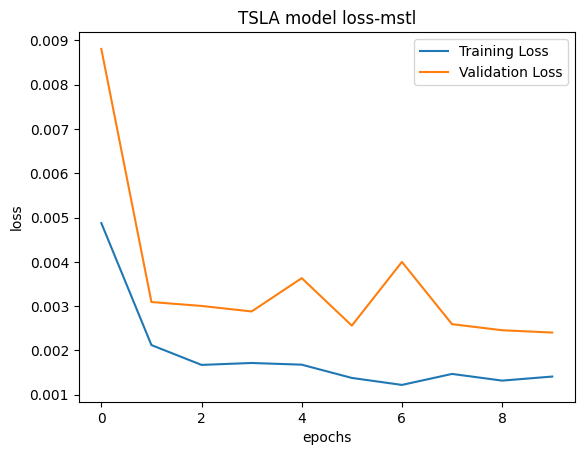

In [ ]:
#Plot training and validation loss using history
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title(f'{ticker} model loss-{study_naam}')
plt.ylabel('loss')
plt.xlabel('epochs')
plt.legend(loc='upper right')
plt.show()

##### Save model

In [ ]:
# Save the entire model as a `.keras` zip archive.
best_model.save(f'TSLA_model_hyperparameter_{filter}.keras')

# Save the weights
# model.save_weights('./checkpoints/my_checkpoint')

# Create a new model instance
# model = create_model()

# Restore the weights
# model.load_weights('./checkpoints/my_checkpoint')

In [ ]:
best_model.summary()

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_4 (LSTM)               (None, 40, 60)            14880     
                                                                 
 dropout_4 (Dropout)         (None, 40, 60)            0         
                                                                 
 lstm_5 (LSTM)               (None, 60)                29040     
                                                                 
 dropout_5 (Dropout)         (None, 60)                0         
                                                                 
 dense_2 (Dense)             (None, 1)                 61        
                                                                 
Total params: 43981 (171.80 KB)
Trainable params: 43981 (171.80 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


##### Load model

In [ ]:
new_model = tf.keras.models.load_model('TSLA_model_hyperparameter.keras')

##### Plot

****************************TEST************************************


<Figure size 1000x600 with 0 Axes>

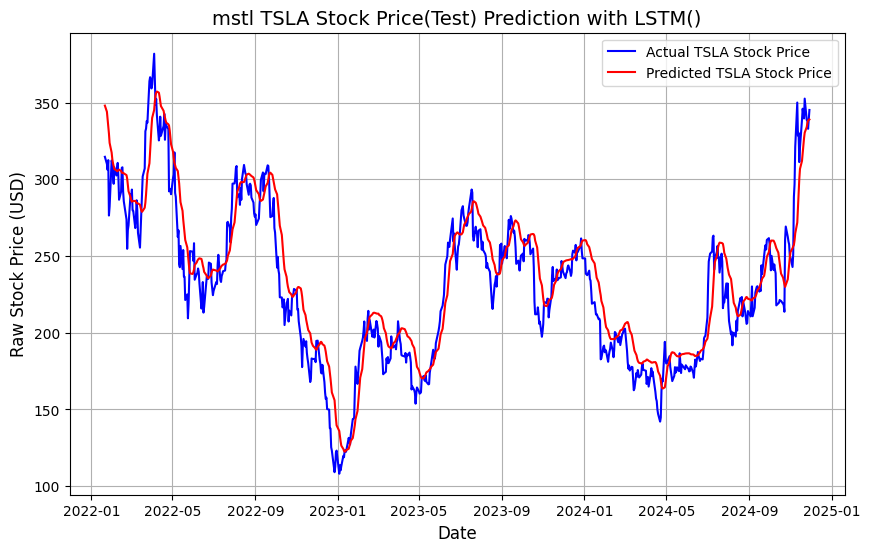

In [ ]:
if attn:
    a = "attention"
else:
    a = ""

print("****************************TEST************************************")
model_name="LSTM"
plot_simple(tesla_data,"test",f'{study_naam} {ticker} Stock Price(Test) Prediction with {model_name}({a})',ticker,y_raw, predicted_stock_price_raw,10,6)
plot_interative(tesla_data,"test",f'{study_naam} {ticker} Stock Price(Test) Prediction with {model_name}({a})',ticker,y_raw, predicted_stock_price_raw)

#### TSLA - Filtered(STL)

##### Start Tuning

In [ ]:
# win_size=20
# pred_step=10
# epoch_no=2
batch_size_no=32
# split_size=0.2
attn=False
# units=50
# drop_out=0.2
n_trial=2
ticker="TSLA" #Cyient.NS, GAIL.NS, INFY.NS, TCS.NS, RELIANCE.NS
filter="STL" # kalman, fourier, SMA, EMA, MACD, wavelet
# abc(ticker,win_size,pred_step,units,drop_out,n_trial,filter,epoch_no,batch_size_no,split_size,attn)
study_naam="STL"
detail_index=0
wavelet_name="db4"
approx_enable=True
threshold_enable=False
thresh_value=0
mstl_period=[7]
stl_period=30
abc(ticker,n_trial,filter,study_naam,batch_size_no,attn,detail_index,wavelet_name,approx_enable,threshold_enable,thresh_value,mstl_period,stl_period)

##### Optuna plot

In [ ]:
optuna.visualization.plot_optimization_history(study_lstm)

In [ ]:
# optuna-dashboard sqlite:///db.sqlite3

optuna.visualization.plot_slice(study_lstm)

##### Best parameter values

In [ ]:
study_lstm.best_trial.params

##### After hyperparameter tuning - Train model with best values

In [ ]:
win_size=study_lstm.best_trial.params['win_size']
pred_step=10
epoch_no=study_lstm.best_trial.params['epoch_no']
batch_size_no=32
split_size=round(study_lstm.best_trial.params['split_size'],2)
attn=False
units=study_lstm.best_trial.params['units']
drop_out=round(study_lstm.best_trial.params['drop_out'],2)
n_trial=0
best_model = build_model(win_size,drop_out,units,split_size)
# print(f"**********************{study_naam} filter*************************")

scaled_data_unfilt = scaler.transform(tesla_data[['Close']].values)
X_unfilt,y_unfilt = create_sequences(scaled_data_unfilt,study_lstm.best_trial.params['win_size'])
X_test_unfilt = X_unfilt[-len(X_test):]
y_test_unfilt = y_unfilt[-len(y_test):]

history = best_model.fit(X_train, y_train, epochs=epoch_no, batch_size=32, validation_data=(X_test_unfilt, y_test_unfilt))
# abc("TSLA",win_size,pred_step,units,drop_out,n_trial,epoch_no,batch_size_no,split_size,attn)

##### Evaluate trained model

In [ ]:
X_test_unfilt.shape

(719, 40)

In [ ]:
type(X_test_unfilt)

numpy.ndarray

In [ ]:
X_test_unfilt

In [ ]:
# scaled_data_org = scaler.transform(tesla_data[['Close']].values)
# X_test,y_test = create_sequences(scaled_data_org,study_lstm.best_trial.params['win_size'])
evaluate_model(best_model,X_test_unfilt,y_test_unfilt, filter)

##### Val and training loss plot

In [ ]:
#Plot training and validation loss using history
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title(f'{ticker} model loss-{study_naam}')
plt.ylabel('loss')
plt.xlabel('epochs')
plt.legend(loc='upper right')
plt.show()

##### Save model

In [ ]:
# Save the entire model as a `.keras` zip archive.
best_model.save(f'TSLA_model_hyperparameter_{filter}.keras')

# Save the weights
# model.save_weights('./checkpoints/my_checkpoint')

# Create a new model instance
# model = create_model()

# Restore the weights
# model.load_weights('./checkpoints/my_checkpoint')

In [ ]:
best_model.summary()

##### Load model

In [ ]:
new_model = tf.keras.models.load_model('TSLA_model_hyperparameter.keras')

##### Plot

In [ ]:
if attn:
    a = "attention"
else:
    a = ""

print("****************************TEST************************************")
model_name="LSTM"
plot_simple(tesla_data,"test",f'{study_naam} {ticker} Stock Price(Test) Prediction with {model_name}({a})',ticker,y_raw, predicted_stock_price_raw,10,6)
plot_interative(tesla_data,"test",f'{study_naam} {ticker} Stock Price(Test) Prediction with {model_name}({a})',ticker,y_raw, predicted_stock_price_raw)

In [ ]:
rt_fft = tf.signal.fft(tesla_data['Close'])
fft = tf.signal.rfft(tesla_data[['Close']])
np.fft.fft(tesla_data['Close'])
recovered = tf.signal.ifft(rt_fft)
#plot tesla_data['Close] and recovered with x axis as tesla_data.index
plt.figure(figsize=(16,8))
plt.plot(tesla_data.index,tesla_data['Close'], label='Org Price', color='blue')
plt.plot(tesla_data.index,recovered, label='Rec Price', color='green')
plt.title('Tesla Stock Price')
plt.xlabel('Date')
plt.ylabel('Price ($)')
plt.legend()
plt.show()


In [ ]:
len(tesla_data['Close'])

5534

In [ ]:
# import scipy.fft as fft
# # Generate a time-domain signal
# t = np.linspace(0, 1, 1000)
# x = np.sin(2 * np.pi * 10 * t) + np.sin(2 * np.pi * 20 * t)

# # Calculate the Fourier Transform
# X = fft.fft(tesla_data['Close'].values)
# freqs = fft.fftfreq(tesla_data['Close'].size,d=1)  # Calculate the frequencies

# from scipy import signal
# sos = signal.butter(2, 0.001, 'low', analog=False,output='sos')
# filtered = signal.sosfilt(sos, tesla_data[['Close']])
# # w, h = signal.freqs(b, a)

# # Plot the frequency-domain representation of the signal
# import matplotlib.pyplot as plt
# plt.plot(freqs, np.abs(X))
# plt.xlabel('Frequency (Hz)')
# plt.ylabel('Amplitude')
# plt.xlim([0, 50])  # Display frequencies from 0 to 50 Hz for clarity
# plt.show()

# #Plot the filtered data
# plt.figure(figsize=(10,6))
# plt.plot(tesla_data.index,filtered,label="filtered")
# plt.plot(tesla_data.index,tesla_data[['Close']],label="Actual")
# plt.title('Filtered Data')
# plt.xlabel('Time')
# plt.ylabel('Amplitude')
# plt.legend()
# plt.show()


#### MMM - Proposed Filter(hybrid) - fourier_wavelet

In [31]:
# win_size=20
# pred_step=10
# epoch_no=2
batch_size_no=32
# split_size=0.2
attn=False
# units=50
# drop_out=0.2
n_trial=2
ticker="MMM" #Cyient.NS, GAIL.NS, INFY.NS, TCS.NS, RELIANCE.NS
filter="hybrid" # kalman, fourier, SMA, EMA, MACD, wavelet
# abc(ticker,win_size,pred_step,units,drop_out,n_trial,filter,epoch_no,batch_size_no,split_size,attn)
study_naam="hybrid"
tuning=False
stock_file_name="MMM_autoencoder_data.csv"
detail_index=8
#'haar', 'db', 'sym', 'coif', 'bior', 'rbio', 'dmey', 'gaus',
# 'mexh', 'morl', 'cgau', 'shan', 'fbsp', 'cmor'
wavelet_name="dmey"
approx_enable=False
threshold_enable=False
thresh_value=0
abc(stock_file_name,ticker,n_trial,filter,f"{study_naam}",tuning,detail_index,wavelet_name,approx_enable,threshold_enable,thresh_value)

In [32]:
win_size= 30 #study_cnn.best_trial.params['win_size']
epoch_no= 100 #study_cnn.best_trial.params['epoch_no']
drop_out= 0.4 #round(study_cnn.best_trial.params['drop_out'],2)
units= 40 #study_cnn.best_trial.params['units']
split_size= 0.3 #round(study_cnn.best_trial.params['split_size'],2)
optimizer_options ='adagrad' #study_cnn.best_trial.params['optimizer_name']
num_of_layers= 4 #study_cnn.best_trial.params['no_layers']  
loss_option= 'mean_squared_logarithmic_error' #study_cnn.best_trial.params['loss_fn_name']
actv_option= 'gelu' #study_cnn.best_trial.params['activation_name']

# scaled_train_X, scaled_val_X, scaled_test_X, scaled_train_Y,scaled_val_Y,scaled_test_Y
best_model = build_model(win_size,drop_out,units,split_size,optimizer_options,num_of_layers,loss_option,actv_option)
# print(f"**********************{filter} filter*************************")
history = best_model.fit(scaled_train_X, scaled_train_Y, epochs=epoch_no, batch_size=32, validation_data=(scaled_val_X, scaled_val_Y))

unscaled X_train size (4879, 30)
scaled X_train size (4879, 30, 1) (4879,)


2025-01-08 11:35:30.328066: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1929] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 13858 MB memory:  -> device: 0, name: NVIDIA RTX A4000, pci bus id: 0000:65:00.0, compute capability: 8.6
2025-01-08 11:35:30.534375: E external/local_xla/xla/stream_executor/gpu/asm_compiler.cc:115] *** WARNING *** You are using ptxas 10.1.243, which is older than 11.1. ptxas before 11.1 is known to miscompile XLA code, leading to incorrect results or invalid-address errors.

2025-01-08 11:35:30.536770: W external/local_xla/xla/stream_executor/gpu/asm_compiler.cc:225] Falling back to the CUDA driver for PTX compilation; ptxas does not support CC 8.6
2025-01-08 11:35:30.536792: W external/local_xla/xla/stream_executor/gpu/asm_compiler.cc:228] Used ptxas at ptxas
2025-01-08 11:35:30.536838: W tensorflow/compiler/mlir/tools/kernel_gen/transforms/gpu_kernel_to_blob_pass.cc:191] Failed to compile generated PTX with ptxas. Falling back to comp

Epoch 1/100


2025-01-08 11:35:36.845085: I external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:454] Loaded cuDNN version 8904
2025-01-08 11:35:36.867738: E external/local_xla/xla/stream_executor/gpu/asm_compiler.cc:115] *** WARNING *** You are using ptxas 10.1.243, which is older than 11.1. ptxas before 11.1 is known to miscompile XLA code, leading to incorrect results or invalid-address errors.

2025-01-08 11:35:36.867845: E external/local_xla/xla/stream_executor/gpu/asm_compiler.cc:115] *** WARNING *** You are using ptxas 10.1.243, which is older than 11.1. ptxas before 11.1 is known to miscompile XLA code, leading to incorrect results or invalid-address errors.

2025-01-08 11:35:36.868699: E external/local_xla/xla/stream_executor/gpu/asm_compiler.cc:115] *** WARNING *** You are using ptxas 10.1.243, which is older than 11.1. ptxas before 11.1 is known to miscompile XLA code, leading to incorrect results or invalid-address errors.

2025-01-08 11:35:36.869360: E external/local_xla/xla/stream_e

153/153 [==============================] - 11s 29ms/step - loss: 0.0037 - val_loss: 2.5162
Epoch 2/100
153/153 [==============================] - 3s 19ms/step - loss: 0.0037 - val_loss: 2.5158
Epoch 3/100
153/153 [==============================] - 3s 19ms/step - loss: 0.0037 - val_loss: 2.5155
Epoch 4/100
153/153 [==============================] - 3s 19ms/step - loss: 0.0036 - val_loss: 2.5141
Epoch 5/100
153/153 [==============================] - 3s 19ms/step - loss: 0.0036 - val_loss: 2.5145
Epoch 6/100
153/153 [==============================] - 3s 19ms/step - loss: 0.0036 - val_loss: 2.5135
Epoch 7/100
153/153 [==============================] - 3s 19ms/step - loss: 0.0036 - val_loss: 2.5147
Epoch 8/100
153/153 [==============================] - 3s 20ms/step - loss: 0.0036 - val_loss: 2.5118
Epoch 9/100
153/153 [==============================] - 3s 19ms/step - loss: 0.0037 - val_loss: 2.5129
Epoch 10/100
153/153 [==============================] - 3s 20ms/step - loss: 0.0036 - val_los

In [35]:
win_size= 30 #study_cnn.best_trial.params['win_size']
epoch_no= 100 #study_cnn.best_trial.params['epoch_no']
drop_out= 0.4 #round(study_cnn.best_trial.params['drop_out'],2)
units= 40 #study_cnn.best_trial.params['units']
split_size= 0.3 #round(study_cnn.best_trial.params['split_size'],2)
optimizer_options ='adam' #study_cnn.best_trial.params['optimizer_name']
num_of_layers= 4 #study_cnn.best_trial.params['no_layers']  
loss_option= 'mean_squared_error' #study_cnn.best_trial.params['loss_fn_name']
actv_option= 'gelu' #study_cnn.best_trial.params['activation_name']

# scaled_train_X, scaled_val_X, scaled_test_X, scaled_train_Y,scaled_val_Y,scaled_test_Y
best_model = build_model(win_size,drop_out,units,split_size,optimizer_options,num_of_layers,loss_option,actv_option)
# print(f"**********************{filter} filter*************************")
history = best_model.fit(scaled_train_X, scaled_train_Y, epochs=epoch_no, batch_size=32, validation_data=(scaled_val_X, scaled_val_Y))

unscaled X_train size (4879, 30)
scaled X_train size (4879, 30, 1) (4879,)
Epoch 1/100


2025-01-08 11:45:50.288769: E external/local_xla/xla/stream_executor/gpu/asm_compiler.cc:115] *** WARNING *** You are using ptxas 10.1.243, which is older than 11.1. ptxas before 11.1 is known to miscompile XLA code, leading to incorrect results or invalid-address errors.

2025-01-08 11:45:50.389932: E external/local_xla/xla/stream_executor/gpu/asm_compiler.cc:115] *** WARNING *** You are using ptxas 10.1.243, which is older than 11.1. ptxas before 11.1 is known to miscompile XLA code, leading to incorrect results or invalid-address errors.

2025-01-08 11:45:50.507723: E external/local_xla/xla/stream_executor/gpu/asm_compiler.cc:115] *** WARNING *** You are using ptxas 10.1.243, which is older than 11.1. ptxas before 11.1 is known to miscompile XLA code, leading to incorrect results or invalid-address errors.

2025-01-08 11:45:50.513587: E external/local_xla/xla/stream_executor/gpu/asm_compiler.cc:115] *** WARNING *** You are using ptxas 10.1.243, which is older than 11.1. ptxas before

153/153 [==============================] - 10s 28ms/step - loss: 0.0034 - val_loss: 23.6272
Epoch 2/100
153/153 [==============================] - 3s 19ms/step - loss: 0.0015 - val_loss: 23.6281
Epoch 3/100
153/153 [==============================] - 3s 19ms/step - loss: 6.8120e-04 - val_loss: 23.4314
Epoch 4/100
153/153 [==============================] - 3s 19ms/step - loss: 8.6950e-04 - val_loss: 23.0052
Epoch 5/100
153/153 [==============================] - 3s 18ms/step - loss: 7.2921e-04 - val_loss: 23.8317
Epoch 6/100
153/153 [==============================] - 2s 16ms/step - loss: 5.4529e-04 - val_loss: 23.3495
Epoch 7/100
153/153 [==============================] - 3s 18ms/step - loss: 4.5613e-04 - val_loss: 22.8454
Epoch 8/100
153/153 [==============================] - 3s 19ms/step - loss: 4.4750e-04 - val_loss: 23.0731
Epoch 9/100
153/153 [==============================] - 3s 20ms/step - loss: 3.2585e-04 - val_loss: 23.1326
Epoch 10/100
153/153 [==============================] - 

In [33]:
evaluate_model(best_model,scaled_test_X,scaled_test_Y, filter)

33/33 [==============================] - 2s 6ms/step
**********************hybrid filter***************************
Mean Absolute Percentage Error (MAPE): 0.38%
Mean Absolute Error (MAE): 31.83
Root Mean Squared Error (RMSE): 52.05
R2 Score: -0.56


In [36]:
evaluate_model(best_model,scaled_test_X,scaled_test_Y, filter)

33/33 [==============================] - 2s 6ms/step
**********************hybrid filter***************************
Mean Absolute Percentage Error (MAPE): 0.33%
Mean Absolute Error (MAE): 27.31
Root Mean Squared Error (RMSE): 45.37
R2 Score: -0.18


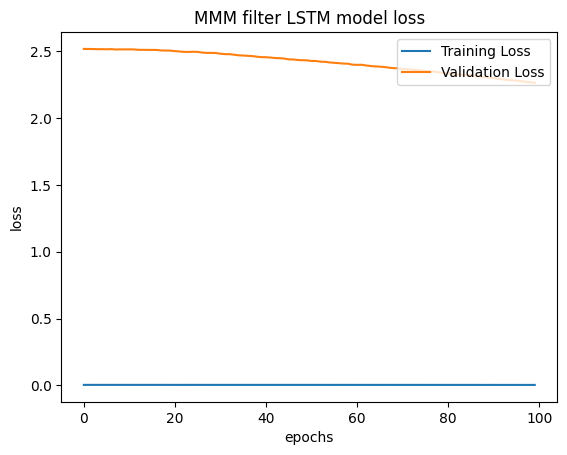

In [34]:

#Plot training and validation loss using history
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title(f'{ticker} filter LSTM model loss')
plt.ylabel('loss')
plt.xlabel('epochs')
plt.legend(loc='upper right')
plt.show()

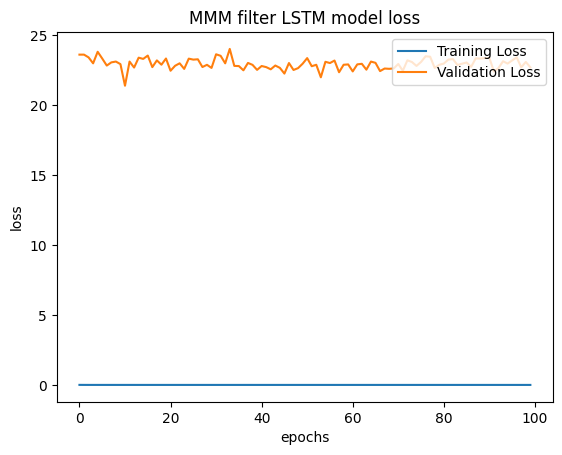

In [37]:

#Plot training and validation loss using history
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title(f'{ticker} filter LSTM model loss')
plt.ylabel('loss')
plt.xlabel('epochs')
plt.legend(loc='upper right')
plt.show()

In [38]:
# Save the entire model as a `.keras` zip archive.
best_model.save(f'saved_model_LSTM/{ticker}_model_{study_naam}')

# Save the weights
# model.save_weights('./checkpoints/my_checkpoint')

# Create a new model instance
# model = create_model()

# Restore the weights
# model.load_weights('./checkpoints/my_checkpoint')

INFO:tensorflow:Assets written to: saved_model_LSTM/MMM_model_hybrid/assets


INFO:tensorflow:Assets written to: saved_model_LSTM/MMM_model_hybrid/assets


In [ ]:
if attn:
    a = "attention"
else:
    a = ""
org_data_split(stock_data[['org_akam']].values,split_size,win_size)
print("****************************TEST************************************")
model_name="LSTM"
# plot_simple(stock_data,"test",f'{study_naam} {ticker} Stock Price(Test) Prediction with {model_name}({a})',ticker,Org_y_test, predicted_stock_price_raw,10,6)
plot_interative(stock_data,"test",f'{study_naam} {ticker} Stock Price(Test) Prediction with {model_name}({a})',ticker,Org_y_test, predicted_stock_price_raw)